In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['solar_activity'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-26 15:09:14,962] A new study created in memory with name: no-name-c847e791-6b2f-44d5-90ef-95049e675036
[I 2025-05-26 15:13:28,919] Trial 0 finished with value: 0.2027126967906952 and parameters: {'lr': 0.39497626147560405, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.46029234149030085}. Best is trial 0 with value: 0.2027126967906952.


Cross Validation Accuracies:
[0.21245668828487396, 0.19108551740646362, 0.20607902109622955, 0.19283314049243927, 0.21110911667346954]
Mean Cross Validation Accuracy:
0.2027126967906952
Standard Deviation of Cross Validation Accuracy:
0.009050682952131468


[I 2025-05-26 15:17:40,574] Trial 1 finished with value: 0.0627603828907013 and parameters: {'lr': 0.011262445195391334, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.42651163064540587}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.054539717733860016, 0.05620823800563812, 0.07205437123775482, 0.07846448570489883, 0.052535101771354675]
Mean Cross Validation Accuracy:
0.0627603828907013
Standard Deviation of Cross Validation Accuracy:
0.010469607220707796


[I 2025-05-26 15:21:52,277] Trial 2 finished with value: 0.0638879619538784 and parameters: {'lr': 0.004493085101765789, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.41594038230383246}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.05437242612242699, 0.058136943727731705, 0.0732426568865776, 0.07908608019351959, 0.054601702839136124]
Mean Cross Validation Accuracy:
0.0638879619538784
Standard Deviation of Cross Validation Accuracy:
0.010279565715079831


[I 2025-05-26 15:28:10,324] Trial 3 finished with value: 0.0657095491886139 and parameters: {'lr': 0.6944035204905481, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.1991172693927805}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.044449105858802795, 0.08244297653436661, 0.07676607370376587, 0.07217520475387573, 0.05271438509225845]
Mean Cross Validation Accuracy:
0.0657095491886139
Standard Deviation of Cross Validation Accuracy:
0.01459410680685637


[I 2025-05-26 15:33:33,329] Trial 4 finished with value: 0.1937649130821228 and parameters: {'lr': 0.014022798232238532, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.34242876166056885}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.0827103704214096, 0.24531884491443634, 0.16650983691215515, 0.22735287249088287, 0.24693264067173004]
Mean Cross Validation Accuracy:
0.1937649130821228
Standard Deviation of Cross Validation Accuracy:
0.06275144107392105


[I 2025-05-26 15:38:56,431] Trial 5 finished with value: 0.06991050094366073 and parameters: {'lr': 0.0015308812667134248, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.356924753153791}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.05575914680957794, 0.06294294446706772, 0.085770383477211, 0.07946673035621643, 0.06561329960823059]
Mean Cross Validation Accuracy:
0.06991050094366073
Standard Deviation of Cross Validation Accuracy:
0.011046546980512646


[I 2025-05-26 15:44:00,086] Trial 6 finished with value: 0.11929430812597275 and parameters: {'lr': 0.19968718471877417, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.30234078753784477}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.1202639639377594, 0.11129529029130936, 0.13432130217552185, 0.12590260803699493, 0.1046883761882782]
Mean Cross Validation Accuracy:
0.11929430812597275
Standard Deviation of Cross Validation Accuracy:
0.010466498405487485


[I 2025-05-26 15:51:34,247] Trial 7 finished with value: 0.0729853443801403 and parameters: {'lr': 0.004512109980143334, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4641856173629405}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.061209987848997116, 0.07025427371263504, 0.07557091116905212, 0.08911896497011185, 0.0687725841999054]
Mean Cross Validation Accuracy:
0.0729853443801403
Standard Deviation of Cross Validation Accuracy:
0.009282714966255233


[I 2025-05-26 15:55:57,909] Trial 8 finished with value: 0.07157324701547622 and parameters: {'lr': 0.002050327849180579, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.35096024070637677}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.06779245287179947, 0.06545479595661163, 0.07492266595363617, 0.0871322900056839, 0.06256403028964996]
Mean Cross Validation Accuracy:
0.07157324701547622
Standard Deviation of Cross Validation Accuracy:
0.008788609215614543


[I 2025-05-26 16:01:48,027] Trial 9 finished with value: 0.1697787806391716 and parameters: {'lr': 0.10951607895850923, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.13615426096211244}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.49418267607688904, 0.08137892186641693, 0.08632340282201767, 0.10966232419013977, 0.07734657824039459]
Mean Cross Validation Accuracy:
0.1697787806391716
Standard Deviation of Cross Validation Accuracy:
0.1625883900339069


[I 2025-05-26 16:05:16,403] Trial 10 finished with value: 0.07190184518694878 and parameters: {'lr': 0.04004340533386832, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.22529111386641346}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.07161516696214676, 0.05467703565955162, 0.0752480998635292, 0.08464284241199493, 0.07332608103752136]
Mean Cross Validation Accuracy:
0.07190184518694878
Standard Deviation of Cross Validation Accuracy:
0.009719414859619009


[I 2025-05-26 16:09:22,183] Trial 11 finished with value: 0.06445477977395057 and parameters: {'lr': 0.011134607789341881, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4065167043752607}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.05737539753317833, 0.06107216700911522, 0.07325182110071182, 0.07654669135808945, 0.054027821868658066]
Mean Cross Validation Accuracy:
0.06445477977395057
Standard Deviation of Cross Validation Accuracy:
0.008875623189950187


[I 2025-05-26 16:13:28,512] Trial 12 finished with value: 0.0628991775214672 and parameters: {'lr': 0.007165236853615222, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.48911679137879427}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.05275439843535423, 0.05643092468380928, 0.07560504227876663, 0.07546649873256683, 0.054239023476839066]
Mean Cross Validation Accuracy:
0.0628991775214672
Standard Deviation of Cross Validation Accuracy:
0.010383926687032533


[I 2025-05-26 16:17:22,488] Trial 13 finished with value: 0.06466172561049462 and parameters: {'lr': 0.033109579603722794, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.49864046745141827}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.0618140734732151, 0.05730123817920685, 0.0723271369934082, 0.07762424647808075, 0.054241932928562164]
Mean Cross Validation Accuracy:
0.06466172561049462
Standard Deviation of Cross Validation Accuracy:
0.00891788603164963


[I 2025-05-26 16:20:48,885] Trial 14 finished with value: 0.06376569494605064 and parameters: {'lr': 0.008869462043609298, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.4195497040543608}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.05541704595088959, 0.05683758482336998, 0.07299443334341049, 0.07924371212720871, 0.05433569848537445]
Mean Cross Validation Accuracy:
0.06376569494605064
Standard Deviation of Cross Validation Accuracy:
0.010308851647316377


[I 2025-05-26 16:24:18,412] Trial 15 finished with value: 0.39442819356918335 and parameters: {'lr': 0.062373042965534815, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4958424848887554}. Best is trial 1 with value: 0.0627603828907013.


Cross Validation Accuracies:
[0.27204400300979614, 0.5495771765708923, 0.2650967836380005, 0.3208714723587036, 0.5645515322685242]
Mean Cross Validation Accuracy:
0.39442819356918335
Standard Deviation of Cross Validation Accuracy:
0.13425963818331668


[I 2025-05-26 16:27:54,565] Trial 16 finished with value: 0.06261570453643799 and parameters: {'lr': 0.01931502133408876, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.39407679661555334}. Best is trial 16 with value: 0.06261570453643799.


Cross Validation Accuracies:
[0.05398552119731903, 0.057283006608486176, 0.07278656214475632, 0.07620926946401596, 0.05281416326761246]
Mean Cross Validation Accuracy:
0.06261570453643799
Standard Deviation of Cross Validation Accuracy:
0.009871365607969779


[I 2025-05-26 16:30:45,241] Trial 17 finished with value: 0.06247725486755371 and parameters: {'lr': 0.02046576936586598, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2730069361318359}. Best is trial 17 with value: 0.06247725486755371.


Cross Validation Accuracies:
[0.055150117725133896, 0.05722995847463608, 0.07157175987958908, 0.07650334388017654, 0.051931094378232956]
Mean Cross Validation Accuracy:
0.06247725486755371
Standard Deviation of Cross Validation Accuracy:
0.009714769720476343


[I 2025-05-26 16:35:03,550] Trial 18 finished with value: 0.06663288325071334 and parameters: {'lr': 0.023958677311270972, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.24590369633829998}. Best is trial 17 with value: 0.06247725486755371.


Cross Validation Accuracies:
[0.054603878408670425, 0.06678006798028946, 0.0760524570941925, 0.07955942302942276, 0.05616858974099159]
Mean Cross Validation Accuracy:
0.06663288325071334
Standard Deviation of Cross Validation Accuracy:
0.010099939222940214


[I 2025-05-26 16:38:17,629] Trial 19 finished with value: 0.05626493543386459 and parameters: {'lr': 0.08594550818694022, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2872139013646671}. Best is trial 19 with value: 0.05626493543386459.


Cross Validation Accuracies:
[0.04389403015375137, 0.05533516779541969, 0.06637454032897949, 0.06966423988342285, 0.04605669900774956]
Mean Cross Validation Accuracy:
0.05626493543386459
Standard Deviation of Cross Validation Accuracy:
0.010390931884193808


[I 2025-05-26 16:41:30,418] Trial 20 finished with value: 0.0588340163230896 and parameters: {'lr': 0.08613209376818269, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2720242790193065}. Best is trial 19 with value: 0.05626493543386459.


Cross Validation Accuracies:
[0.05840950086712837, 0.055484190583229065, 0.06561712920665741, 0.06787033379077911, 0.04678892716765404]
Mean Cross Validation Accuracy:
0.0588340163230896
Standard Deviation of Cross Validation Accuracy:
0.007538585708079039


[I 2025-05-26 16:44:46,500] Trial 21 finished with value: 0.06901407316327095 and parameters: {'lr': 0.126655600760172, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.27494388970318046}. Best is trial 19 with value: 0.05626493543386459.


Cross Validation Accuracies:
[0.058075275272130966, 0.07347644120454788, 0.07817220687866211, 0.0763438493013382, 0.0590025931596756]
Mean Cross Validation Accuracy:
0.06901407316327095
Standard Deviation of Cross Validation Accuracy:
0.008687885716151797


[I 2025-05-26 16:48:19,583] Trial 22 finished with value: 0.060976370424032214 and parameters: {'lr': 0.07151303635861794, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1744824501108686}. Best is trial 19 with value: 0.05626493543386459.


Cross Validation Accuracies:
[0.05702318251132965, 0.05703122541308403, 0.06515737622976303, 0.07488087564706802, 0.05078919231891632]
Mean Cross Validation Accuracy:
0.060976370424032214
Standard Deviation of Cross Validation Accuracy:
0.008316087260495581


[I 2025-05-26 16:51:39,431] Trial 23 finished with value: 0.05834206268191337 and parameters: {'lr': 0.07257914399258064, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1498277626460644}. Best is trial 19 with value: 0.05626493543386459.


Cross Validation Accuracies:
[0.05302465334534645, 0.0564938560128212, 0.06716164201498032, 0.06904754787683487, 0.045982614159584045]
Mean Cross Validation Accuracy:
0.05834206268191337
Standard Deviation of Cross Validation Accuracy:
0.008681463823472851


[I 2025-05-26 16:54:57,530] Trial 24 finished with value: 0.07350242733955384 and parameters: {'lr': 0.2665513049135186, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1348866420770415}. Best is trial 19 with value: 0.05626493543386459.


Cross Validation Accuracies:
[0.06569400429725647, 0.08123134821653366, 0.07435611635446548, 0.07864100486040115, 0.0675896629691124]
Mean Cross Validation Accuracy:
0.07350242733955384
Standard Deviation of Cross Validation Accuracy:
0.00604652354171213


[I 2025-05-26 16:58:17,533] Trial 25 finished with value: 0.05977799221873283 and parameters: {'lr': 0.05660032814215582, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.10020191885537055}. Best is trial 19 with value: 0.05626493543386459.


Cross Validation Accuracies:
[0.05666046962141991, 0.05238017067313194, 0.06848941743373871, 0.07091976702213287, 0.05044013634324074]
Mean Cross Validation Accuracy:
0.05977799221873283
Standard Deviation of Cross Validation Accuracy:
0.00838654086215641


[I 2025-05-26 17:01:36,082] Trial 26 finished with value: 0.0556078128516674 and parameters: {'lr': 0.11486804417943138, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.29997327270694923}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.04440493509173393, 0.058055415749549866, 0.06206884607672691, 0.06460276991128922, 0.048907097429037094]
Mean Cross Validation Accuracy:
0.0556078128516674
Standard Deviation of Cross Validation Accuracy:
0.007733679849393475


[I 2025-05-26 17:05:09,595] Trial 27 finished with value: 0.06357945427298546 and parameters: {'lr': 0.17720406192498214, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.31081123093696655}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.06168321520090103, 0.05370310693979263, 0.08491329848766327, 0.07032103836536407, 0.047276612371206284]
Mean Cross Validation Accuracy:
0.06357945427298546
Standard Deviation of Cross Validation Accuracy:
0.013171958687982026


[I 2025-05-26 17:08:38,502] Trial 28 finished with value: 0.07894766256213188 and parameters: {'lr': 0.44259493361754865, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.19176101076941632}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.060986701399087906, 0.07162804901599884, 0.098183274269104, 0.08355320990085602, 0.08038707822561264]
Mean Cross Validation Accuracy:
0.07894766256213188
Standard Deviation of Cross Validation Accuracy:
0.012405358598992727


[I 2025-05-26 17:12:15,235] Trial 29 finished with value: 0.0688084214925766 and parameters: {'lr': 0.39194416334117366, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2292877010682285}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.04406168311834335, 0.07174614816904068, 0.08172141760587692, 0.08365655690431595, 0.06285630166530609]
Mean Cross Validation Accuracy:
0.0688084214925766
Standard Deviation of Cross Validation Accuracy:
0.014447640793250647


[I 2025-05-26 17:16:02,793] Trial 30 finished with value: 0.06065211221575737 and parameters: {'lr': 0.03978894478840907, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3271662628312198}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05330725759267807, 0.054925188422203064, 0.07040302455425262, 0.07494306564331055, 0.049682024866342545]
Mean Cross Validation Accuracy:
0.06065211221575737
Standard Deviation of Cross Validation Accuracy:
0.010063786596770144


[I 2025-05-26 17:19:34,038] Trial 31 finished with value: 0.06198136582970619 and parameters: {'lr': 0.09290002119795775, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.28561485663518754}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.057456646114587784, 0.05758988857269287, 0.0632300078868866, 0.0745193362236023, 0.057110950350761414]
Mean Cross Validation Accuracy:
0.06198136582970619
Standard Deviation of Cross Validation Accuracy:
0.006666917076459947


[I 2025-05-26 17:23:15,343] Trial 32 finished with value: 0.05730567127466202 and parameters: {'lr': 0.14040533211079306, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.26106481773799517}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05101272091269493, 0.04769332334399223, 0.07002662122249603, 0.06965574622154236, 0.048139944672584534]
Mean Cross Validation Accuracy:
0.05730567127466202
Standard Deviation of Cross Validation Accuracy:
0.01029908656057734


[I 2025-05-26 17:26:44,544] Trial 33 finished with value: 0.06662846580147744 and parameters: {'lr': 0.17721616136072052, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.25309624536699055}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.051357995718717575, 0.07607858628034592, 0.07871069014072418, 0.0763598158955574, 0.050635240972042084]
Mean Cross Validation Accuracy:
0.06662846580147744
Standard Deviation of Cross Validation Accuracy:
0.012798082619641878


[I 2025-05-26 17:31:32,356] Trial 34 finished with value: 0.06773386150598526 and parameters: {'lr': 0.29830573066761734, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.16377839165338157}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.048500992357730865, 0.05348433554172516, 0.07904310524463654, 0.08719635009765625, 0.07044452428817749]
Mean Cross Validation Accuracy:
0.06773386150598526
Standard Deviation of Cross Validation Accuracy:
0.014744405004746086


[I 2025-05-26 17:35:27,375] Trial 35 finished with value: 0.06729815900325775 and parameters: {'lr': 0.6853008173052073, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.214713352847676}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05660265311598778, 0.06199033558368683, 0.0707942470908165, 0.0866042822599411, 0.06049927696585655]
Mean Cross Validation Accuracy:
0.06729815900325775
Standard Deviation of Cross Validation Accuracy:
0.010712055449022739


[I 2025-05-26 17:39:25,088] Trial 36 finished with value: 0.06667191088199616 and parameters: {'lr': 0.13344217869436237, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.37066523682827174}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.0701182633638382, 0.07168980687856674, 0.07394369691610336, 0.06863261759281158, 0.04897516965866089]
Mean Cross Validation Accuracy:
0.06667191088199616
Standard Deviation of Cross Validation Accuracy:
0.009021690734212351


[I 2025-05-26 17:43:03,044] Trial 37 finished with value: 0.0611288845539093 and parameters: {'lr': 0.06004866008984069, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3106588544585242}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.058290328830480576, 0.05476076528429985, 0.06898929178714752, 0.07349462807178497, 0.05010940879583359]
Mean Cross Validation Accuracy:
0.0611288845539093
Standard Deviation of Cross Validation Accuracy:
0.008771964457657447


[I 2025-05-26 17:46:22,222] Trial 38 finished with value: 0.05968298986554146 and parameters: {'lr': 0.04644439546525067, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.24933821172173337}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.055181894451379776, 0.05273456871509552, 0.06850565969944, 0.07325270026922226, 0.04874012619256973]
Mean Cross Validation Accuracy:
0.05968298986554146
Standard Deviation of Cross Validation Accuracy:
0.009489607212254282


[I 2025-05-26 17:51:56,849] Trial 39 finished with value: 3.3847065687179567 and parameters: {'lr': 0.9657783999239393, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.332424322679591}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[3.886359453201294, 1.8859721422195435, 3.777418375015259, 3.3325154781341553, 4.041267395019531]
Mean Cross Validation Accuracy:
3.3847065687179567
Standard Deviation of Cross Validation Accuracy:
0.7856053830082127


[I 2025-05-26 17:55:40,828] Trial 40 finished with value: 22.51984214782715 and parameters: {'lr': 0.2383777186063641, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.37937782005470105}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[14.095394134521484, 26.912702560424805, 25.883211135864258, 22.5273380279541, 23.180564880371094]
Mean Cross Validation Accuracy:
22.51984214782715
Standard Deviation of Cross Validation Accuracy:
4.517021332707349


[I 2025-05-26 17:59:28,548] Trial 41 finished with value: 0.05847213789820671 and parameters: {'lr': 0.08652679853877088, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.26877440699530986}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05079540237784386, 0.058473631739616394, 0.06799855828285217, 0.06930863857269287, 0.04578445851802826]
Mean Cross Validation Accuracy:
0.05847213789820671
Standard Deviation of Cross Validation Accuracy:
0.009253020163692458


[I 2025-05-26 18:03:37,451] Trial 42 finished with value: 0.06257651373744011 and parameters: {'lr': 0.13621362710685508, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2950691063752126}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.06787095963954926, 0.05820078030228615, 0.06852872669696808, 0.07023216038942337, 0.048049941658973694]
Mean Cross Validation Accuracy:
0.06257651373744011
Standard Deviation of Cross Validation Accuracy:
0.008393298060147273


[I 2025-05-26 18:06:57,132] Trial 43 finished with value: 0.060166095942258836 and parameters: {'lr': 0.08130124691472838, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.32634078301608416}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05984531715512276, 0.052615825086832047, 0.06693240255117416, 0.07001844793558121, 0.051418486982584]
Mean Cross Validation Accuracy:
0.060166095942258836
Standard Deviation of Cross Validation Accuracy:
0.007436153527975894


[I 2025-05-26 18:11:09,147] Trial 44 finished with value: 0.05948179513216019 and parameters: {'lr': 0.11217364891827138, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.25739756166005107}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.04935261979699135, 0.06554475426673889, 0.06572479009628296, 0.07239311933517456, 0.044393692165613174]
Mean Cross Validation Accuracy:
0.05948179513216019
Standard Deviation of Cross Validation Accuracy:
0.010702222165183227


[I 2025-05-26 18:17:24,443] Trial 45 finished with value: 13.870435523986817 and parameters: {'lr': 0.1832227702481513, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.20360736171487515}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[3.3266916275024414, 17.30742835998535, 14.743758201599121, 14.332854270935059, 19.64144515991211]
Mean Cross Validation Accuracy:
13.870435523986817
Standard Deviation of Cross Validation Accuracy:
5.60828906038304


[I 2025-05-26 18:21:01,250] Trial 46 finished with value: 0.06454509273171424 and parameters: {'lr': 0.02912160843028984, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.23535912430928219}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.055799517780542374, 0.06097337231040001, 0.07231990247964859, 0.07597348839044571, 0.05765918269753456]
Mean Cross Validation Accuracy:
0.06454509273171424
Standard Deviation of Cross Validation Accuracy:
0.008095849787916047


[I 2025-05-26 18:24:39,088] Trial 47 finished with value: 0.06162136122584343 and parameters: {'lr': 0.04624417175914695, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.30141715470839026}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05430704355239868, 0.056300755590200424, 0.0692359209060669, 0.07450644671916962, 0.05375663936138153]
Mean Cross Validation Accuracy:
0.06162136122584343
Standard Deviation of Cross Validation Accuracy:
0.008575183784123315


[I 2025-05-26 18:28:20,382] Trial 48 finished with value: 0.634025764465332 and parameters: {'lr': 0.09859315301819069, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.43763465772152055}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.8517679572105408, 1.1110247373580933, 0.4098067581653595, 0.15564271807670593, 0.6418866515159607]
Mean Cross Validation Accuracy:
0.634025764465332
Standard Deviation of Cross Validation Accuracy:
0.3329041838264197


[I 2025-05-26 18:34:41,236] Trial 49 finished with value: 35.851800537109376 and parameters: {'lr': 0.40181349415669926, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3503383207688322}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[45.1646614074707, 19.701597213745117, 23.2470645904541, 45.75730895996094, 45.388370513916016]
Mean Cross Validation Accuracy:
35.851800537109376
Standard Deviation of Cross Validation Accuracy:
11.794092396613907


[I 2025-05-26 18:38:11,464] Trial 50 finished with value: 0.06344793364405632 and parameters: {'lr': 0.0027268504384524088, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1740698618009897}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.056962575763463974, 0.05773209407925606, 0.07286156713962555, 0.07664510607719421, 0.053038325160741806]
Mean Cross Validation Accuracy:
0.06344793364405632
Standard Deviation of Cross Validation Accuracy:
0.009443225014418204


[I 2025-05-26 18:42:08,717] Trial 51 finished with value: 0.06140515655279159 and parameters: {'lr': 0.08757559795193447, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.279720529126826}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05781025066971779, 0.06046663224697113, 0.06700042635202408, 0.06970224529504776, 0.05204622820019722]
Mean Cross Validation Accuracy:
0.06140515655279159
Standard Deviation of Cross Validation Accuracy:
0.00634889662560112


[I 2025-05-26 18:46:00,956] Trial 52 finished with value: 0.0576872318983078 and parameters: {'lr': 0.07303541362953511, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2635504422918223}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05145471170544624, 0.05271271616220474, 0.06880225241184235, 0.0691574290394783, 0.04630905017256737]
Mean Cross Validation Accuracy:
0.0576872318983078
Standard Deviation of Cross Validation Accuracy:
0.009467441445509418


[I 2025-05-26 18:50:04,445] Trial 53 finished with value: 0.06844019144773483 and parameters: {'lr': 0.14561512905441046, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.29174375326246754}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.06798536330461502, 0.07004181295633316, 0.07579881697893143, 0.07624201476573944, 0.052132949233055115]
Mean Cross Validation Accuracy:
0.06844019144773483
Standard Deviation of Cross Validation Accuracy:
0.00876031992039731


[I 2025-05-26 18:54:06,929] Trial 54 finished with value: 0.0609812043607235 and parameters: {'lr': 0.05588446992414944, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2646945224516626}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05459536239504814, 0.05491901934146881, 0.06979517638683319, 0.0743197426199913, 0.05127672106027603]
Mean Cross Validation Accuracy:
0.0609812043607235
Standard Deviation of Cross Validation Accuracy:
0.009244552630797397


[I 2025-05-26 18:58:23,278] Trial 55 finished with value: 0.06207569465041161 and parameters: {'lr': 0.02916028056101202, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2386646446743948}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05412963405251503, 0.05621948465704918, 0.07146886736154556, 0.07655494660139084, 0.05200554057955742]
Mean Cross Validation Accuracy:
0.06207569465041161
Standard Deviation of Cross Validation Accuracy:
0.009967181228047087


[I 2025-05-26 19:02:15,701] Trial 56 finished with value: 0.06674794927239418 and parameters: {'lr': 0.2280456313747927, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.21454673230270901}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.06793283671140671, 0.0579075813293457, 0.07306716591119766, 0.07706167548894882, 0.057770486921072006]
Mean Cross Validation Accuracy:
0.06674794927239418
Standard Deviation of Cross Validation Accuracy:
0.007828874009449803


[I 2025-05-26 19:06:10,143] Trial 57 finished with value: 0.05857853591442108 and parameters: {'lr': 0.07085804801333205, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.31700396736636116}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.04580684006214142, 0.05668984726071358, 0.0697181299328804, 0.07281381636857986, 0.047864045947790146]
Mean Cross Validation Accuracy:
0.05857853591442108
Standard Deviation of Cross Validation Accuracy:
0.011029210484195737


[I 2025-05-26 19:10:15,452] Trial 58 finished with value: 0.06261903420090675 and parameters: {'lr': 0.015441355898518418, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.10196797987096057}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05649179220199585, 0.057399436831474304, 0.07143286615610123, 0.07557778805494308, 0.0521932877600193]
Mean Cross Validation Accuracy:
0.06261903420090675
Standard Deviation of Cross Validation Accuracy:
0.009155287163664393


[I 2025-05-26 19:16:06,529] Trial 59 finished with value: 0.05952238515019417 and parameters: {'lr': 0.04155135833190621, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.1424935978916429}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.053787533193826675, 0.05182570591568947, 0.06774239987134933, 0.0730394721031189, 0.051216814666986465]
Mean Cross Validation Accuracy:
0.05952238515019417
Standard Deviation of Cross Validation Accuracy:
0.009070724127221316


[I 2025-05-26 19:20:09,559] Trial 60 finished with value: 0.17173622250556947 and parameters: {'lr': 0.3174376468143568, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3443536910704361}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.15418383479118347, 0.17603516578674316, 0.18603244423866272, 0.16948054730892181, 0.17294912040233612]
Mean Cross Validation Accuracy:
0.17173622250556947
Standard Deviation of Cross Validation Accuracy:
0.01036830145735932


[I 2025-05-26 19:23:51,130] Trial 61 finished with value: 0.06013349369168282 and parameters: {'lr': 0.07223132047175532, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.31441822293025745}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.0561884380877018, 0.052237655967473984, 0.06698799133300781, 0.07047528773546219, 0.054778095334768295]
Mean Cross Validation Accuracy:
0.06013349369168282
Standard Deviation of Cross Validation Accuracy:
0.0072183772498486745


[I 2025-05-26 19:27:00,648] Trial 62 finished with value: 0.06350338160991668 and parameters: {'lr': 0.11231787619003732, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.26820384092286575}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.08008357137441635, 0.0526965893805027, 0.06681641936302185, 0.07276665419340134, 0.045153673738241196]
Mean Cross Validation Accuracy:
0.06350338160991668
Standard Deviation of Cross Validation Accuracy:
0.012846677920784111


[I 2025-05-26 19:30:06,812] Trial 63 finished with value: 0.05807119384407997 and parameters: {'lr': 0.06799062383626889, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.28413991539861255}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.04822908341884613, 0.05284646525979042, 0.06784196943044662, 0.07201797515153885, 0.04942047595977783]
Mean Cross Validation Accuracy:
0.05807119384407997
Standard Deviation of Cross Validation Accuracy:
0.009889192188576342


[I 2025-05-26 19:33:18,011] Trial 64 finished with value: 0.3555595278739929 and parameters: {'lr': 0.0010229383355432856, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.28497056095587625}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.3796652853488922, 0.36829712986946106, 0.3477364778518677, 0.337925523519516, 0.34417322278022766]
Mean Cross Validation Accuracy:
0.3555595278739929
Standard Deviation of Cross Validation Accuracy:
0.015780622376473666


[I 2025-05-26 19:37:10,132] Trial 65 finished with value: 0.05850426256656647 and parameters: {'lr': 0.14923752182378142, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.26357886906930067}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.03558528423309326, 0.05981062352657318, 0.07191932946443558, 0.07664722949266434, 0.04855884611606598]
Mean Cross Validation Accuracy:
0.05850426256656647
Standard Deviation of Cross Validation Accuracy:
0.0150667098195838


[I 2025-05-26 19:40:31,490] Trial 66 finished with value: 0.05996223986148834 and parameters: {'lr': 0.052559946312972956, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.24403123725091905}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.052107516676187515, 0.058075226843357086, 0.06991851329803467, 0.07000107318162918, 0.04970886930823326]
Mean Cross Validation Accuracy:
0.05996223986148834
Standard Deviation of Cross Validation Accuracy:
0.008605749907166784


[I 2025-05-26 19:43:41,362] Trial 67 finished with value: 0.10249828845262528 and parameters: {'lr': 0.07089402957007833, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.36426443890711147}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.10280895233154297, 0.10235972702503204, 0.10201148688793182, 0.11632781475782394, 0.0889834612607956]
Mean Cross Validation Accuracy:
0.10249828845262528
Standard Deviation of Cross Validation Accuracy:
0.008651693925809787


[I 2025-05-26 19:47:11,024] Trial 68 finished with value: 0.0613004244863987 and parameters: {'lr': 0.034640156177440755, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.22236960432765177}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05691027268767357, 0.05452163517475128, 0.07065623253583908, 0.0736241340637207, 0.05078984797000885]
Mean Cross Validation Accuracy:
0.0613004244863987
Standard Deviation of Cross Validation Accuracy:
0.009111559669547164


[I 2025-05-26 19:50:35,110] Trial 69 finished with value: 0.5655720472335816 and parameters: {'lr': 0.09680959780319505, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1955175532134271}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.6357579827308655, 0.45006561279296875, 0.677381157875061, 0.6165647506713867, 0.44809073209762573]
Mean Cross Validation Accuracy:
0.5655720472335816
Standard Deviation of Cross Validation Accuracy:
0.09713001016289538


[I 2025-05-26 19:54:02,425] Trial 70 finished with value: 0.062014321237802504 and parameters: {'lr': 0.11888149077941353, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3029450009793008}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05189928784966469, 0.0630500316619873, 0.0692172646522522, 0.07035641372203827, 0.05554860830307007]
Mean Cross Validation Accuracy:
0.062014321237802504
Standard Deviation of Cross Validation Accuracy:
0.007302943805446968


[I 2025-05-26 19:57:01,983] Trial 71 finished with value: 0.060710645467042926 and parameters: {'lr': 0.1643505431649872, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.25602159143732905}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.04004395380616188, 0.0619085468351841, 0.07342737913131714, 0.07355980575084686, 0.054613541811704636]
Mean Cross Validation Accuracy:
0.060710645467042926
Standard Deviation of Cross Validation Accuracy:
0.012589980301530529


[I 2025-05-26 20:00:10,445] Trial 72 finished with value: 0.06574069932103158 and parameters: {'lr': 0.147081492047161, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2654905501116623}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.04774700105190277, 0.07145363837480545, 0.07696405053138733, 0.08275552093982697, 0.049783285707235336]
Mean Cross Validation Accuracy:
0.06574069932103158
Standard Deviation of Cross Validation Accuracy:
0.014328416984334133


[I 2025-05-26 20:03:27,357] Trial 73 finished with value: 0.06586837247014046 and parameters: {'lr': 0.20139969016513007, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2798131353393582}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.039527345448732376, 0.07508958876132965, 0.07600507140159607, 0.07501688599586487, 0.06370297074317932]
Mean Cross Validation Accuracy:
0.06586837247014046
Standard Deviation of Cross Validation Accuracy:
0.013928513661032937


[I 2025-05-26 20:06:38,063] Trial 74 finished with value: 0.05836561024188995 and parameters: {'lr': 0.08022646578881144, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.33538981464656825}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.043860167264938354, 0.05116626247763634, 0.0711737722158432, 0.07785984128713608, 0.0477680079638958]
Mean Cross Validation Accuracy:
0.05836561024188995
Standard Deviation of Cross Validation Accuracy:
0.013554495309138328


[I 2025-05-26 20:09:44,825] Trial 75 finished with value: 0.05740090385079384 and parameters: {'lr': 0.07972527104479323, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3292022239384901}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.0499771386384964, 0.053188715130090714, 0.06792811304330826, 0.0695711150765419, 0.04633943736553192]
Mean Cross Validation Accuracy:
0.05740090385079384
Standard Deviation of Cross Validation Accuracy:
0.009530446361141677


[I 2025-05-26 20:12:59,368] Trial 76 finished with value: 0.06239662915468216 and parameters: {'lr': 0.06414671855813903, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.334476571709691}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05536879226565361, 0.05664096772670746, 0.07166852056980133, 0.07620278000831604, 0.05210208520293236]
Mean Cross Validation Accuracy:
0.06239662915468216
Standard Deviation of Cross Validation Accuracy:
0.009644413271877464


[I 2025-05-26 20:16:14,769] Trial 77 finished with value: 0.06141035556793213 and parameters: {'lr': 0.024435643666679892, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.38658117344825743}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.051455721259117126, 0.05637316778302193, 0.071959488093853, 0.07557002454996109, 0.051693376153707504]
Mean Cross Validation Accuracy:
0.06141035556793213
Standard Deviation of Cross Validation Accuracy:
0.010302117419921257


[I 2025-05-26 20:19:03,890] Trial 78 finished with value: 0.06118539944291115 and parameters: {'lr': 0.036541830685541773, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.32202299227104697}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.052174732089042664, 0.056079283356666565, 0.07025281339883804, 0.0747944787144661, 0.052625689655542374]
Mean Cross Validation Accuracy:
0.06118539944291115
Standard Deviation of Cross Validation Accuracy:
0.00946528619493207


[I 2025-05-26 20:23:29,256] Trial 79 finished with value: 0.05980386659502983 and parameters: {'lr': 0.05028620285448966, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3045800510215132}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.051576875150203705, 0.05360342562198639, 0.07116926461458206, 0.07193784415721893, 0.050731923431158066]
Mean Cross Validation Accuracy:
0.05980386659502983
Standard Deviation of Cross Validation Accuracy:
0.009641936453685102


[I 2025-05-26 20:27:21,564] Trial 80 finished with value: 6.646359586715699 and parameters: {'lr': 0.07901285776642966, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.35833686937359815}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[7.9033122062683105, 3.1912405490875244, 7.865201950073242, 6.02348518371582, 8.248558044433594]
Mean Cross Validation Accuracy:
6.646359586715699
Standard Deviation of Cross Validation Accuracy:
1.895171051832624


[I 2025-05-26 20:30:50,845] Trial 81 finished with value: 0.06027860566973686 and parameters: {'lr': 0.1097296303959461, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3375031022367412}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.04837013781070709, 0.05488881096243858, 0.06721775233745575, 0.06697867810726166, 0.06393764913082123]
Mean Cross Validation Accuracy:
0.06027860566973686
Standard Deviation of Cross Validation Accuracy:
0.0074470506904500584


[I 2025-05-26 20:34:19,355] Trial 82 finished with value: 0.06041699722409248 and parameters: {'lr': 0.08529454437026217, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2847725207014122}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.06277921050786972, 0.05311519280076027, 0.06795092672109604, 0.07032431662082672, 0.04791533946990967]
Mean Cross Validation Accuracy:
0.06041699722409248
Standard Deviation of Cross Validation Accuracy:
0.008603521573542935


[I 2025-05-26 20:37:44,009] Trial 83 finished with value: 0.05851371362805367 and parameters: {'lr': 0.06214388229769677, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2930467749213924}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.049688614904880524, 0.05140785127878189, 0.0682418942451477, 0.07327307760715485, 0.04995713010430336]
Mean Cross Validation Accuracy:
0.05851371362805367
Standard Deviation of Cross Validation Accuracy:
0.010139695182655731


[I 2025-05-26 20:41:14,579] Trial 84 finished with value: 0.061908609420061114 and parameters: {'lr': 0.0980868543435552, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3083162322795765}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05470402538776398, 0.06454078108072281, 0.06640355288982391, 0.07732725143432617, 0.046567436307668686]
Mean Cross Validation Accuracy:
0.061908609420061114
Standard Deviation of Cross Validation Accuracy:
0.010508329929674235


[I 2025-05-26 20:44:41,564] Trial 85 finished with value: 0.08526188135147095 and parameters: {'lr': 0.04480157935421034, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2741593486502316}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.09823907166719437, 0.07962635904550552, 0.08396833389997482, 0.08815352618694305, 0.07632211595773697]
Mean Cross Validation Accuracy:
0.08526188135147095
Standard Deviation of Cross Validation Accuracy:
0.007617359914174042


[I 2025-05-26 20:48:07,461] Trial 86 finished with value: 0.062268415838479994 and parameters: {'lr': 0.1212249699458142, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.4091731223382962}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.07151634991168976, 0.05637089163064957, 0.06875772029161453, 0.06588279455900192, 0.0488143227994442]
Mean Cross Validation Accuracy:
0.062268415838479994
Standard Deviation of Cross Validation Accuracy:
0.008443843931862371


[I 2025-05-26 20:51:39,566] Trial 87 finished with value: 0.45172143578529356 and parameters: {'lr': 0.059213341711488225, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.34572418607139477}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.42049381136894226, 0.49166935682296753, 0.34638795256614685, 0.6861039400100708, 0.31395211815834045]
Mean Cross Validation Accuracy:
0.45172143578529356
Standard Deviation of Cross Validation Accuracy:
0.132349300545997


[I 2025-05-26 20:55:12,997] Trial 88 finished with value: 0.059641700237989426 and parameters: {'lr': 0.07641608100596649, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3230893836653038}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05676919221878052, 0.056823309510946274, 0.0661265179514885, 0.07126706093549728, 0.04722242057323456]
Mean Cross Validation Accuracy:
0.059641700237989426
Standard Deviation of Cross Validation Accuracy:
0.008338285292871284


[I 2025-05-26 20:58:54,652] Trial 89 finished with value: 0.06492029801011086 and parameters: {'lr': 0.21015348827165817, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.22970025992392545}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05181443318724632, 0.05892623960971832, 0.08706466108560562, 0.07655210793018341, 0.0502440482378006]
Mean Cross Validation Accuracy:
0.06492029801011086
Standard Deviation of Cross Validation Accuracy:
0.014482793613649167


[I 2025-05-26 21:02:08,248] Trial 90 finished with value: 0.0582554429769516 and parameters: {'lr': 0.0920343857222585, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2969292305792317}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.0437636561691761, 0.05401831865310669, 0.07084798067808151, 0.07380525022745132, 0.04884200915694237]
Mean Cross Validation Accuracy:
0.0582554429769516
Standard Deviation of Cross Validation Accuracy:
0.011974525919496768


[I 2025-05-26 21:05:55,918] Trial 91 finished with value: 0.05867869332432747 and parameters: {'lr': 0.09356356002805537, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.28988194608845946}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.045424606651067734, 0.05587194859981537, 0.07084909826517105, 0.0732293352484703, 0.048018477857112885]
Mean Cross Validation Accuracy:
0.05867869332432747
Standard Deviation of Cross Validation Accuracy:
0.011463234797621761


[I 2025-05-26 21:09:45,133] Trial 92 finished with value: 0.05898762494325638 and parameters: {'lr': 0.12839690809135576, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.29490123844666155}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.04651087149977684, 0.058498919010162354, 0.07069328427314758, 0.07274860888719559, 0.04648644104599953]
Mean Cross Validation Accuracy:
0.05898762494325638
Standard Deviation of Cross Validation Accuracy:
0.011301105682757554


[I 2025-05-26 21:12:44,628] Trial 93 finished with value: 0.05706301406025886 and parameters: {'lr': 0.1661946285183118, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.25197343956920515}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.04008977860212326, 0.056060634553432465, 0.06636372953653336, 0.07243327051401138, 0.05036765709519386]
Mean Cross Validation Accuracy:
0.05706301406025886
Standard Deviation of Cross Validation Accuracy:
0.011460116782192008


[I 2025-05-26 21:15:50,018] Trial 94 finished with value: 0.06908921077847481 and parameters: {'lr': 0.16633157976126817, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.24642948504275758}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.05152885988354683, 0.07565806806087494, 0.06823109090328217, 0.07784707844257355, 0.07218095660209656]
Mean Cross Validation Accuracy:
0.06908921077847481
Standard Deviation of Cross Validation Accuracy:
0.00936494866541711


[I 2025-05-26 21:19:10,478] Trial 95 finished with value: 0.06794584542512894 and parameters: {'lr': 0.23842443364900304, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.11456822746775874}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.059300001710653305, 0.07487091422080994, 0.07657687366008759, 0.07684701681137085, 0.05213442072272301]
Mean Cross Validation Accuracy:
0.06794584542512894
Standard Deviation of Cross Validation Accuracy:
0.01026093409899713


[I 2025-05-26 21:23:39,106] Trial 96 finished with value: 0.06828533113002777 and parameters: {'lr': 0.29730795467649074, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1508463209198185}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.0781962051987648, 0.05350477993488312, 0.08086418360471725, 0.0797349363565445, 0.04912655055522919]
Mean Cross Validation Accuracy:
0.06828533113002777
Standard Deviation of Cross Validation Accuracy:
0.013950412043914806


[I 2025-05-26 21:27:05,337] Trial 97 finished with value: 0.059017504751682284 and parameters: {'lr': 0.10505642096128981, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.31336986336932654}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.04943590983748436, 0.04908609017729759, 0.07284744083881378, 0.0742003470659256, 0.049517735838890076]
Mean Cross Validation Accuracy:
0.059017504751682284
Standard Deviation of Cross Validation Accuracy:
0.011853028295400773


[I 2025-05-26 21:31:08,556] Trial 98 finished with value: 14.642238426208497 and parameters: {'lr': 0.143754769466508, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.27802089388734036}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[14.766797065734863, 15.414117813110352, 15.471985816955566, 13.722143173217773, 13.836148262023926]
Mean Cross Validation Accuracy:
14.642238426208497
Standard Deviation of Cross Validation Accuracy:
0.7478168228152379


[I 2025-05-26 21:34:47,339] Trial 99 finished with value: 0.09843538403511047 and parameters: {'lr': 0.06588705361549312, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2573998978392344}. Best is trial 26 with value: 0.0556078128516674.


Cross Validation Accuracies:
[0.0803997814655304, 0.10659963637590408, 0.11198026686906815, 0.10203707963228226, 0.09116015583276749]
Mean Cross Validation Accuracy:
0.09843538403511047
Standard Deviation of Cross Validation Accuracy:
0.011325219502406936
Number of finished trials: 100
Best trial: {'lr': 0.11486804417943138, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.29997327270694923}
Best hyperparameters:  {'lr': 0.11486804417943138, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.29997327270694923}
Fold 1:
Epoch 1/100
84/84 [==============================] - 15s 85ms/step - loss: 0.1135 - val_loss: 0.0656
Epoch 2/100
84/84 [==============================] - 5s 55ms/step - loss: 0.0815 - val_loss: 0.0599
Epoch 3/100
84/84 [==============================] - 5s 55ms/step - loss: 0.0766 - val_loss: 0.0801
Epoch 4/100
84/84 [==============================] - 5s 58ms/step

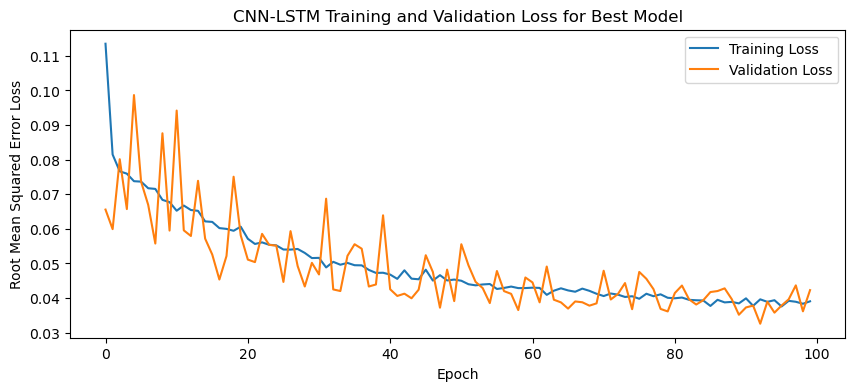

1/1 - 3s - loss: 0.0294 - 3s/epoch - 3s/step
Test Loss: 0.02940990775823593
1/1 [==============================] - 0s 73ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit a CNN-LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# Optimize and fit the model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S12_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

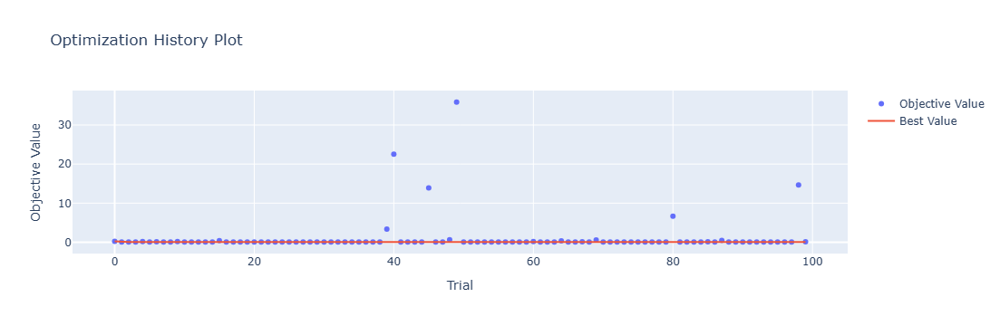

In [4]:
optuna.visualization.plot_optimization_history(study)

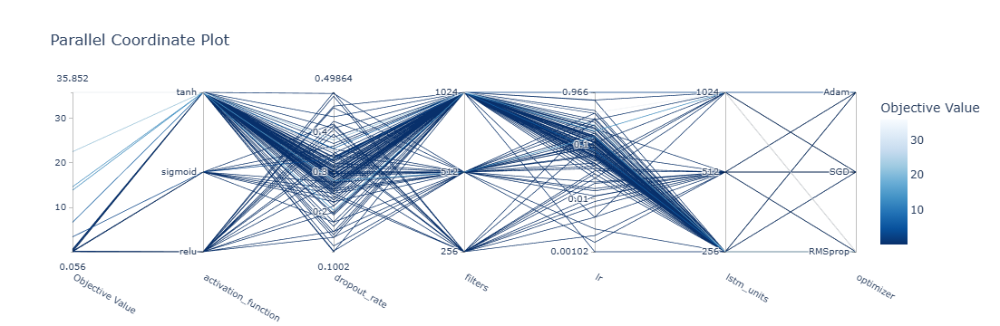

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

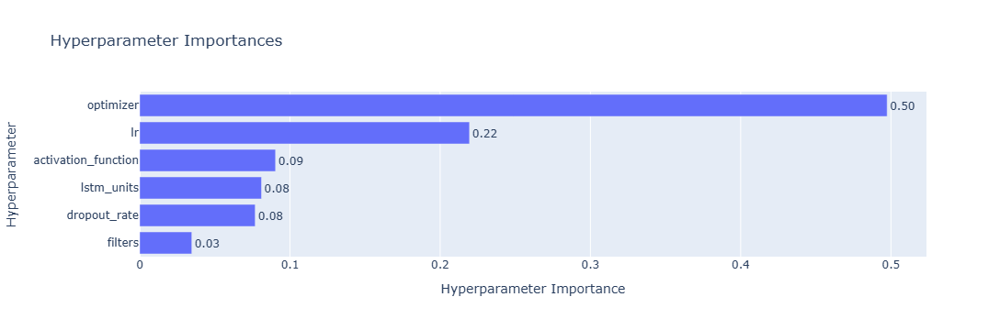

In [6]:
optuna.visualization.plot_param_importances(study)

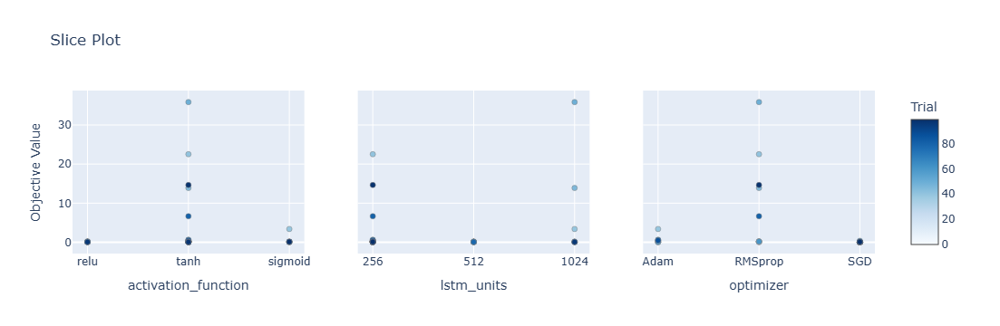

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

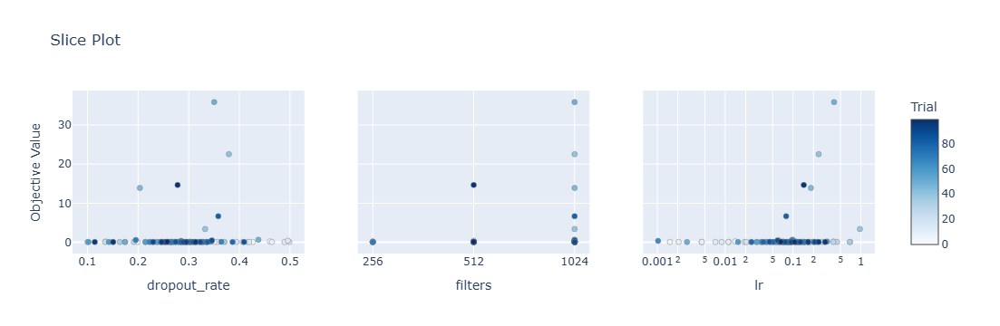

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate', 'filters'])

Epoch 1/100
84/84 [==============================] - 27s 152ms/step - loss: 0.1153 - accuracy: 0.5595 - mae: 0.0945 - rmse: 0.1153 - mape: 20.5487 - pearson: 0.6467 - val_loss: 0.0776 - val_accuracy: 0.8000 - val_mae: 0.0596 - val_rmse: 0.0776 - val_mape: 14.2024 - val_pearson: 0.7060
Epoch 2/100
84/84 [==============================] - 6s 67ms/step - loss: 0.0834 - accuracy: 0.6429 - mae: 0.0678 - rmse: 0.0834 - mape: 15.4686 - pearson: 0.7126 - val_loss: 0.0852 - val_accuracy: 0.8000 - val_mae: 0.0639 - val_rmse: 0.0852 - val_mape: 14.1404 - val_pearson: 0.6855
Epoch 3/100
84/84 [==============================] - 7s 80ms/step - loss: 0.0786 - accuracy: 0.6429 - mae: 0.0632 - rmse: 0.0786 - mape: 14.3930 - pearson: 0.7489 - val_loss: 0.0628 - val_accuracy: 0.8000 - val_mae: 0.0494 - val_rmse: 0.0628 - val_mape: 10.4303 - val_pearson: 0.7845
Epoch 4/100
84/84 [==============================] - 7s 79ms/step - loss: 0.0785 - accuracy: 0.7381 - mae: 0.0625 - rmse: 0.0785 - mape: 13.8673 -

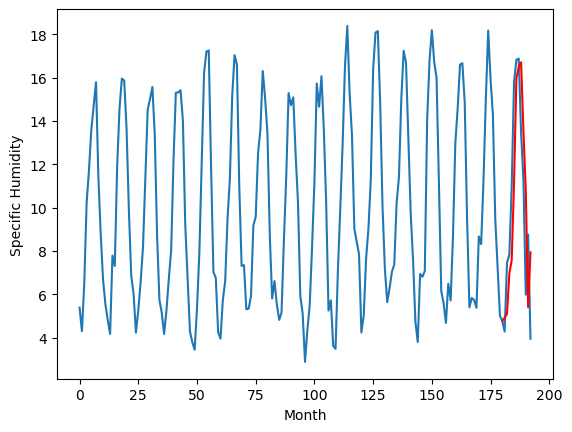

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.74		-0.16
5.61		5.86		0.25
7.82		6.76		-1.06
8.04		7.17		-0.87
10.53		9.87		-0.66
15.28		14.66		-0.62
16.08		15.17		-0.91
16.24		15.59		-0.65
14.08		13.40		-0.68
11.00		10.72		-0.28
5.34		5.17		-0.17
8.98		8.19		-0.79
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 4.740683707594871, 5.8610678046941755, 6.755709025263786, 7.169158908724785, 9.8704435557127, 14.656585428118706, 15.165976378321648, 15.592847231030465, 13.404323938488961, 10.71678459942341, 5.169663074612618, 8.185460928082467]


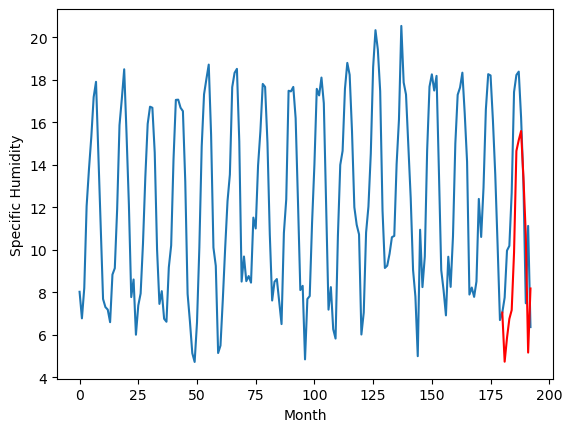

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		4.50		-0.32
4.97		5.26		0.29
6.82		6.39		-0.43
7.06		6.98		-0.08
9.82		9.75		-0.07
14.44		14.80		0.36
16.35		15.38		-0.97
16.55		15.88		-0.67
13.55		13.28		-0.27
10.83		10.69		-0.14
4.96		4.96		-0.00
7.36		7.65		0.29
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.06, 4.503232138752938, 5.257461028695107, 6.391954379677773, 6.975687401890755, 9.749368804097177, 14.801015990376474, 15.377131717801095, 15.88435901939869, 13.275561230778695, 10.68939151108265, 4.9566925936937345, 7.648219245076181]


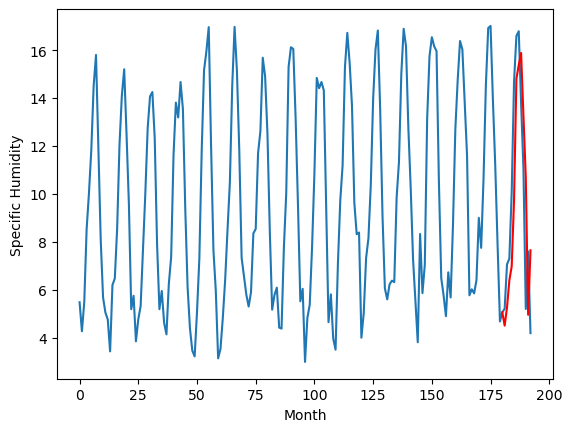

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		4.35		0.14
4.12		5.10		0.98
7.57		6.58		-0.99
8.14		6.97		-1.17
11.65		10.38		-1.27
15.55		15.00		-0.55
16.39		15.44		-0.95
16.01		15.63		-0.38
13.70		13.03		-0.67
11.27		10.18		-1.09
5.06		4.80		-0.26
8.11		7.93		-0.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 4.3511196666955945, 5.102511971592903, 6.578781097531318, 6.966199278235435, 10.379317640662194, 15.001297354102135, 15.439376145005227, 15.634307920336724, 13.027601301074029, 10.182965337634087, 4.795835077166558, 7.928153097033501]


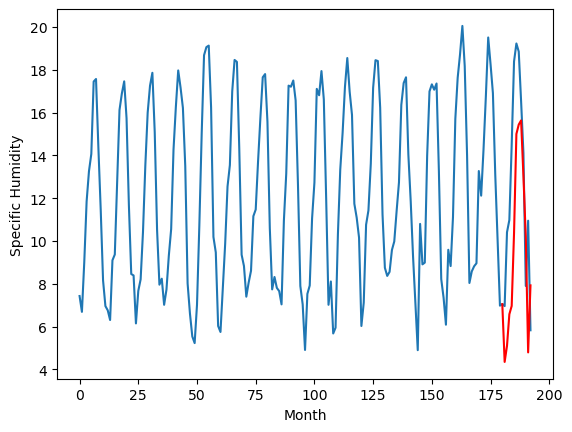

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		5.54		0.22
4.92		5.41		0.49
7.76		7.47		-0.29
9.16		8.02		-1.14
13.17		11.91		-1.26
16.86		16.15		-0.71
17.57		16.67		-0.90
17.49		16.56		-0.93
13.26		13.37		0.11
11.17		10.57		-0.60
6.95		5.98		-0.97
9.71		8.05		-1.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.2, 5.538825690150261, 5.41017180621624, 7.46664506137371, 8.017927884459496, 11.907148599028588, 16.149151086211205, 16.66683900296688, 16.562850765287877, 13.368168644011021, 10.571215204298497, 5.984188608229161, 8.05111270338297]


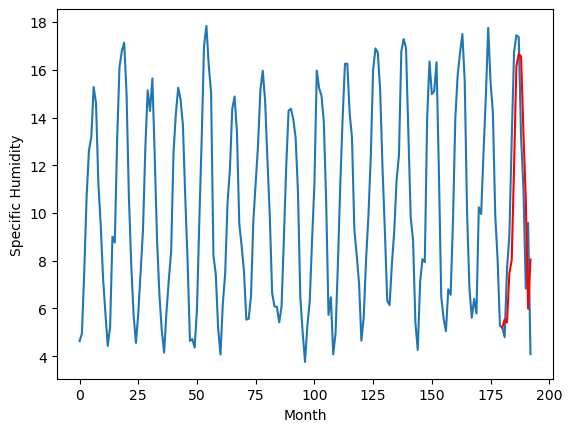

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		8.02		0.60
8.01		8.72		0.71
9.58		9.56		-0.02
10.59		10.27		-0.32
13.09		12.52		-0.57
18.35		17.62		-0.73
19.47		18.31		-1.16
20.63		18.96		-1.67
16.54		16.46		-0.08
14.22		14.08		-0.14
8.96		8.49		-0.47
10.38		10.55		0.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.16, 8.022970867548137, 8.724782479200512, 9.557040763292461, 10.268086147699504, 12.51936121026054, 17.61785383263603, 18.31391013899818, 18.955585611257703, 16.461930644903333, 14.076496017370374, 8.486270320806653, 10.54921711722389]


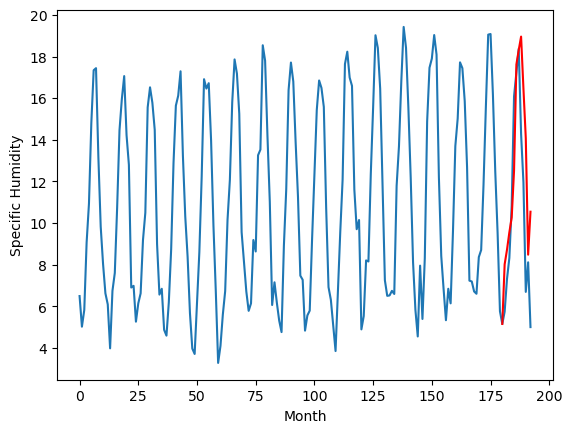

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		5.47		0.14
5.38		6.09		0.71
6.97		7.13		0.16
7.57		7.82		0.25
10.57		10.34		-0.23
14.95		15.49		0.54
16.39		16.14		-0.25
16.92		16.74		-0.18
13.60		14.08		0.48
11.49		11.64		0.15
5.74		5.94		0.20
7.58		8.20		0.62
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.05, 5.467296791747213, 6.085740400031209, 7.125042987540365, 7.824591351225973, 10.342369986250997, 15.487005663588644, 16.140937102511526, 16.74104942150414, 14.083380592539907, 11.638327015116811, 5.938145530894399, 8.19881857700646]


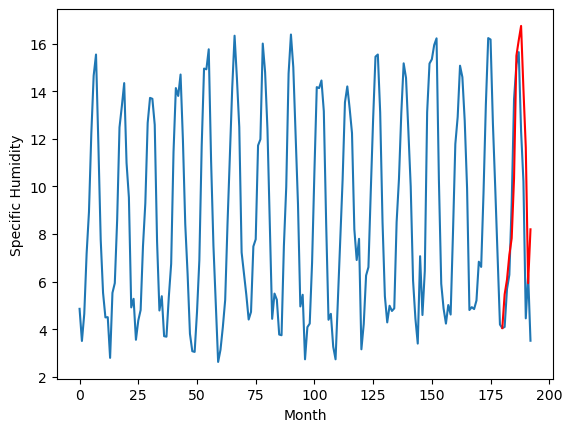

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		7.33		0.21
7.15		7.81		0.66
8.77		8.80		0.03
9.47		9.62		0.15
12.49		11.93		-0.56
16.76		17.22		0.46
18.26		17.95		-0.31
18.54		18.65		0.11
15.05		15.88		0.83
13.17		13.56		0.39
7.38		7.81		0.43
9.15		9.71		0.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.64, 7.334417499899864, 7.811538078188896, 8.80179259955883, 9.623084582686424, 11.931216277480125, 17.217418708205223, 17.950037934184074, 18.647955335974693, 15.883507646918297, 13.558853067755699, 7.81193629682064, 9.706436671614647]


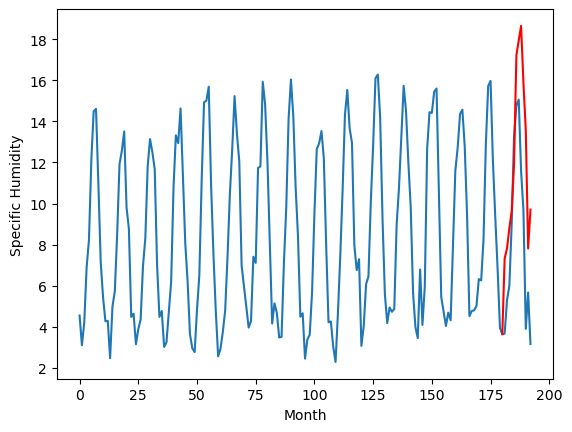

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		4.50		0.10
3.72		4.27		0.55
6.78		6.03		-0.75
7.51		6.92		-0.59
10.42		10.01		-0.41
15.40		15.17		-0.23
16.90		15.90		-1.00
17.09		16.33		-0.76
13.28		12.86		-0.42
10.86		10.45		-0.41
5.57		4.95		-0.62
7.16		6.52		-0.64
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.46, 4.4994918155670165, 4.266635661125183, 6.032255535125732, 6.92420131444931, 10.010792081356048, 15.172849004268645, 15.897801642417907, 16.33395267009735, 12.859222416877746, 10.446959023475646, 4.9493923234939565, 6.522422437667846]


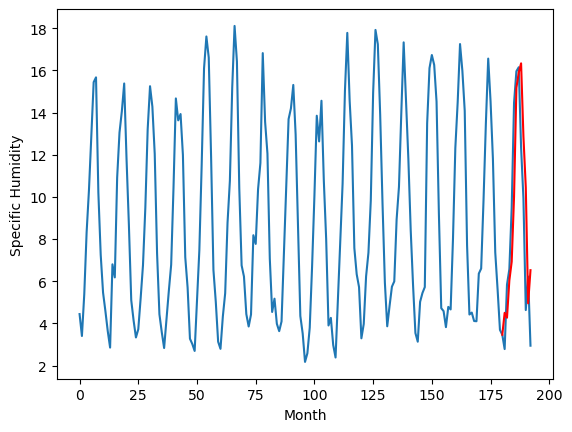

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.22		0.05
5.72		6.09		0.37
7.52		7.31		-0.21
8.84		8.42		-0.42
10.93		10.62		-0.31
15.70		16.19		0.49
16.63		17.07		0.44
17.05		17.88		0.83
13.88		14.57		0.69
12.57		12.48		-0.09
7.05		6.68		-0.37
7.89		7.71		-0.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.93, 6.219735503196716, 6.0860316157341, 7.31020325422287, 8.421753823757172, 10.62016886472702, 16.19083470106125, 17.074384927749634, 17.87703436613083, 14.565297544002533, 12.478635013103485, 6.679637610912323, 7.711613833904266]


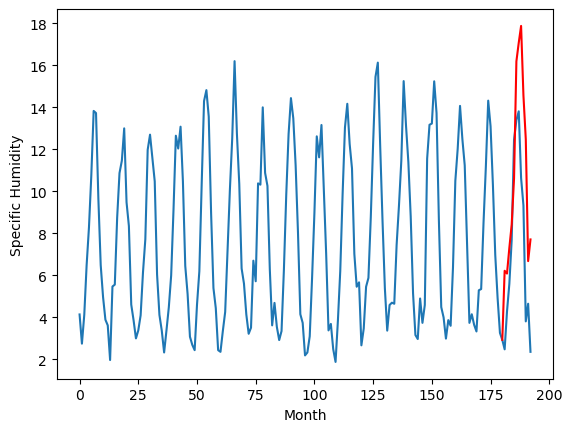

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.52		0.04
3.74		4.22		0.48
5.36		5.24		-0.12
6.96		6.47		-0.49
8.48		8.25		-0.23
13.61		13.76		0.15
14.68		14.76		0.08
15.17		15.63		0.46
11.55		12.37		0.82
10.56		10.49		-0.07
5.71		4.99		-0.72
5.71		5.29		-0.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.74, 4.523921415805817, 4.224575445652008, 5.236967489719391, 6.473454997539521, 8.250208423137664, 13.756964728832244, 14.75591646194458, 15.625548825263976, 12.373442873954772, 10.488755092620849, 4.9926670646667475, 5.294296399354934]


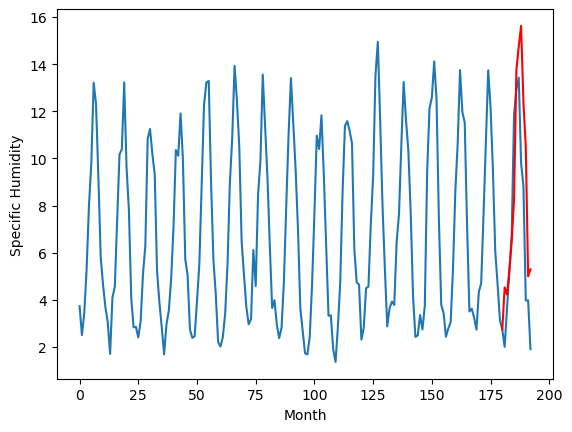

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.92663329154253, 4.740683707594871, 4.503232138752938, 4.3511196666955945, 5.538825690150261, 8.022970867548137, 5.467296791747213, 7.334417499899864, 4.4994918155670165, 6.219735503196716, 4.523921415805817]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.926633
1                 1    4.90   4.740684
2                 2    4.82   4.503232
3                 3    4.21   4.351120
4                 4    5.32   5.538826
5                 5    7.42   8.022971
6                 6    5.33   5.467297
7                 7    7.12   7.334417
8                 8    4.40   4.499492
9                 9    6.17   6.219736
10               10    4.48   4.523921


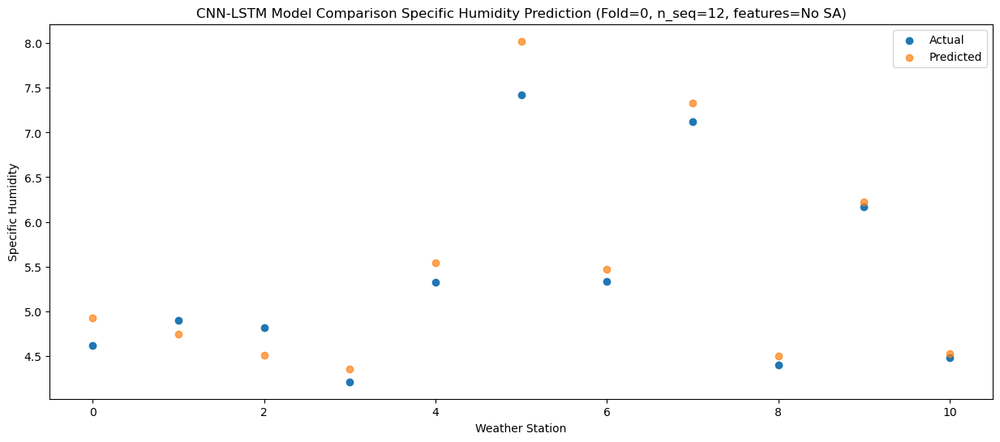

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   5.092955
1                 1    5.61   5.861068
2                 2    4.97   5.257461
3                 3    4.12   5.102512
4                 4    4.92   5.410172
5                 5    8.01   8.724782
6                 6    5.38   6.085740
7                 7    7.15   7.811538
8                 8    3.72   4.266636
9                 9    5.72   6.086032
10               10    3.74   4.224575


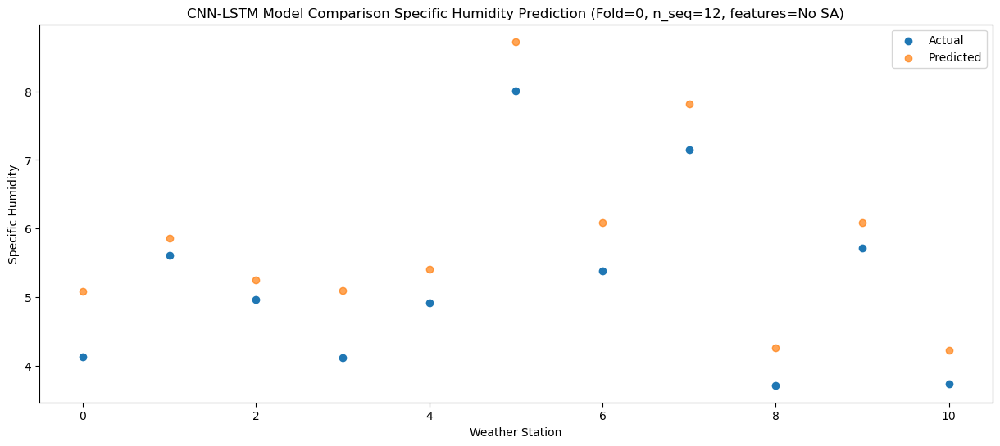

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   6.964851
1                 1    7.82   6.755709
2                 2    6.82   6.391954
3                 3    7.57   6.578781
4                 4    7.76   7.466645
5                 5    9.58   9.557041
6                 6    6.97   7.125043
7                 7    8.77   8.801793
8                 8    6.78   6.032256
9                 9    7.52   7.310203
10               10    5.36   5.236967


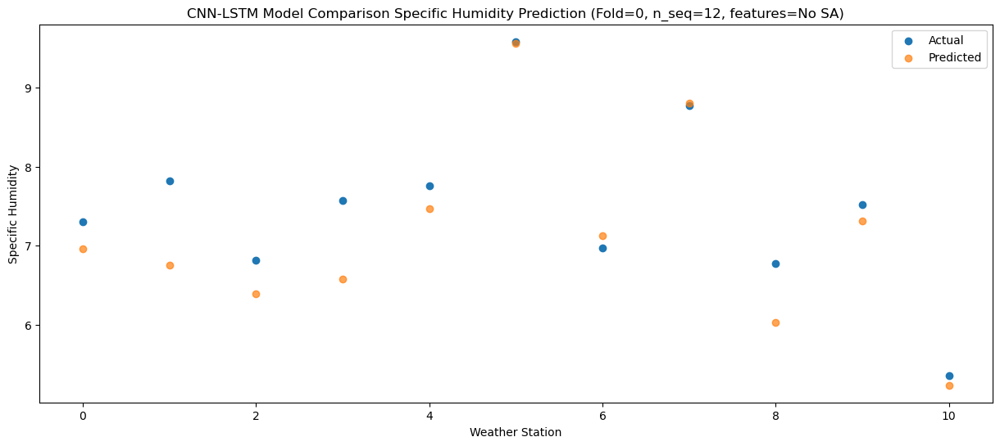

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.69   7.570509
1                 1    8.04   7.169159
2                 2    7.06   6.975687
3                 3    8.14   6.966199
4                 4    9.16   8.017928
5                 5   10.59  10.268086
6                 6    7.57   7.824591
7                 7    9.47   9.623085
8                 8    7.51   6.924201
9                 9    8.84   8.421754
10               10    6.96   6.473455


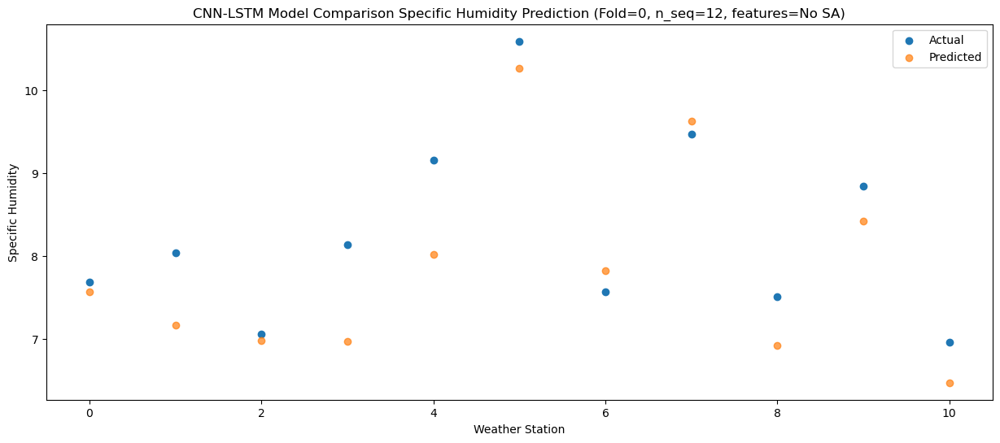

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.84  11.168958
1                 1   10.53   9.870444
2                 2    9.82   9.749369
3                 3   11.65  10.379318
4                 4   13.17  11.907149
5                 5   13.09  12.519361
6                 6   10.57  10.342370
7                 7   12.49  11.931216
8                 8   10.42  10.010792
9                 9   10.93  10.620169
10               10    8.48   8.250208


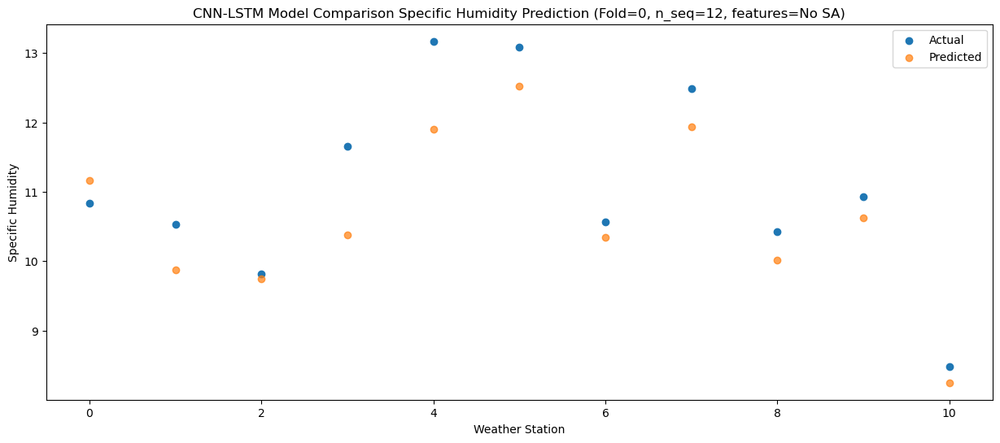

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.65  15.979774
1                 1   15.28  14.656585
2                 2   14.44  14.801016
3                 3   15.55  15.001297
4                 4   16.86  16.149151
5                 5   18.35  17.617854
6                 6   14.95  15.487006
7                 7   16.76  17.217419
8                 8   15.40  15.172849
9                 9   15.70  16.190835
10               10   13.61  13.756965


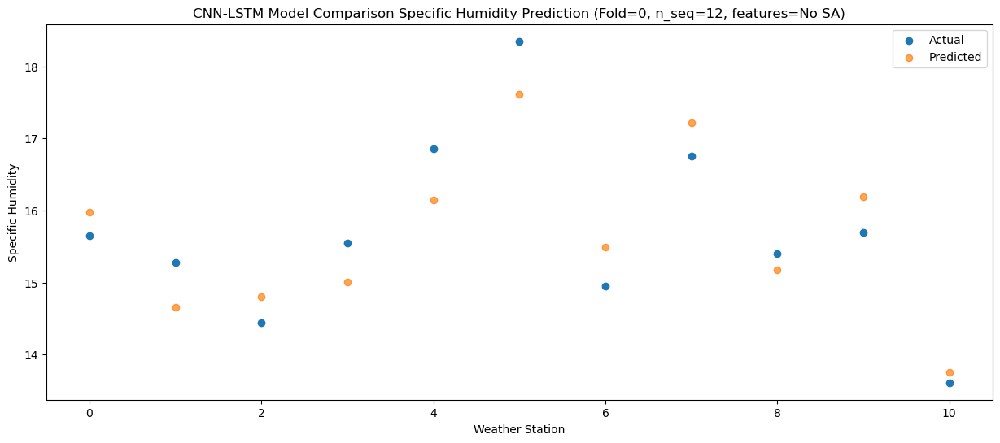

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.68  16.501268
1                 1   16.08  15.165976
2                 2   16.35  15.377132
3                 3   16.39  15.439376
4                 4   17.57  16.666839
5                 5   19.47  18.313910
6                 6   16.39  16.140937
7                 7   18.26  17.950038
8                 8   16.90  15.897802
9                 9   16.63  17.074385
10               10   14.68  14.755916


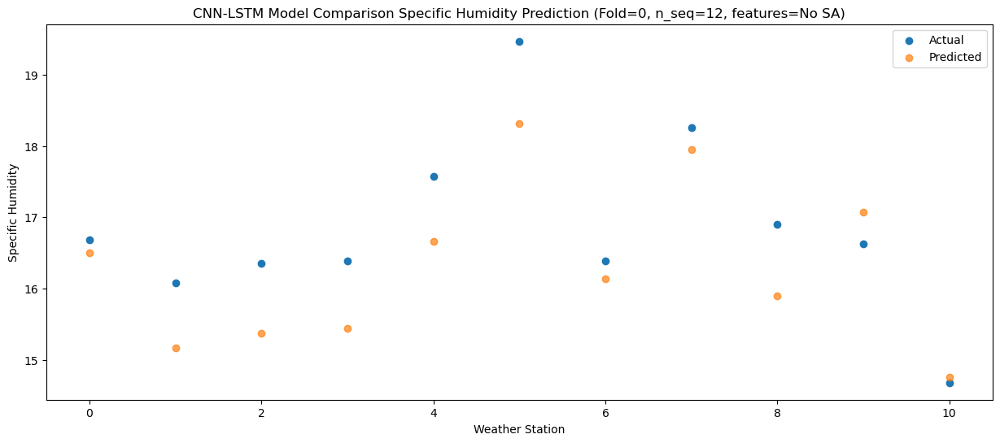

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.73  16.711520
1                 1   16.24  15.592847
2                 2   16.55  15.884359
3                 3   16.01  15.634308
4                 4   17.49  16.562851
5                 5   20.63  18.955586
6                 6   16.92  16.741049
7                 7   18.54  18.647955
8                 8   17.09  16.333953
9                 9   17.05  17.877034
10               10   15.17  15.625549


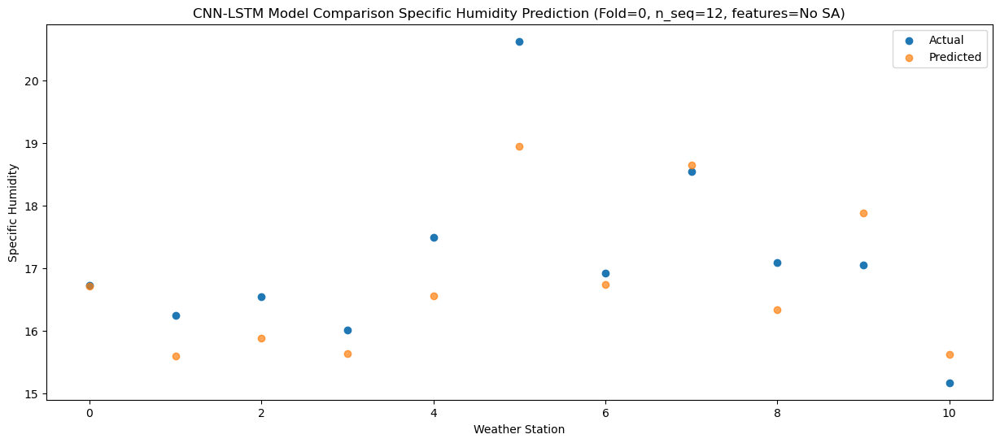

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.31  13.527248
1                 1   14.08  13.404324
2                 2   13.55  13.275561
3                 3   13.70  13.027601
4                 4   13.26  13.368169
5                 5   16.54  16.461931
6                 6   13.60  14.083381
7                 7   15.05  15.883508
8                 8   13.28  12.859222
9                 9   13.88  14.565298
10               10   11.55  12.373443


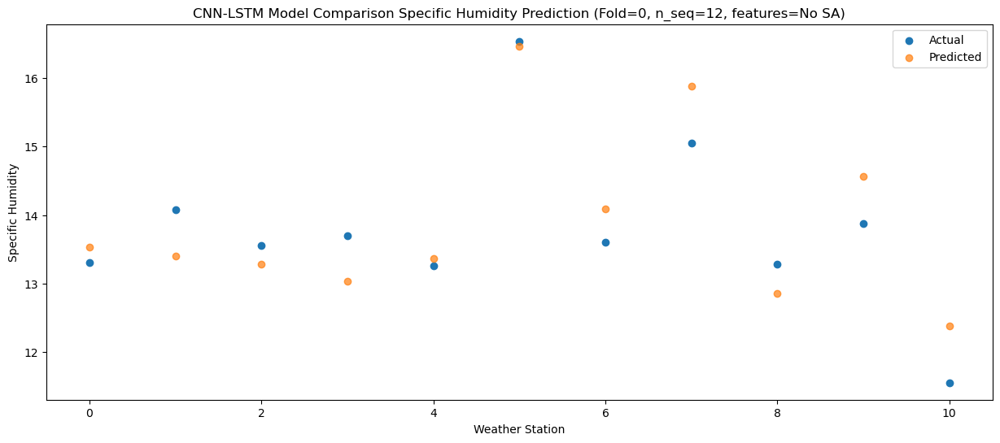

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   11.13  10.795952
1                 1   11.00  10.716785
2                 2   10.83  10.689392
3                 3   11.27  10.182965
4                 4   11.17  10.571215
5                 5   14.22  14.076496
6                 6   11.49  11.638327
7                 7   13.17  13.558853
8                 8   10.86  10.446959
9                 9   12.57  12.478635
10               10   10.56  10.488755


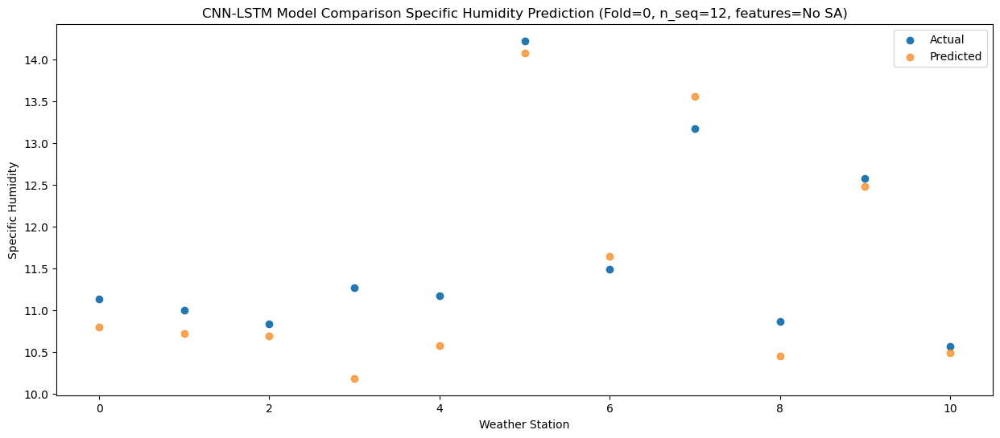

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.83   5.407561
1                 1    5.34   5.169663
2                 2    4.96   4.956693
3                 3    5.06   4.795835
4                 4    6.95   5.984189
5                 5    8.96   8.486270
6                 6    5.74   5.938146
7                 7    7.38   7.811936
8                 8    5.57   4.949392
9                 9    7.05   6.679638
10               10    5.71   4.992667


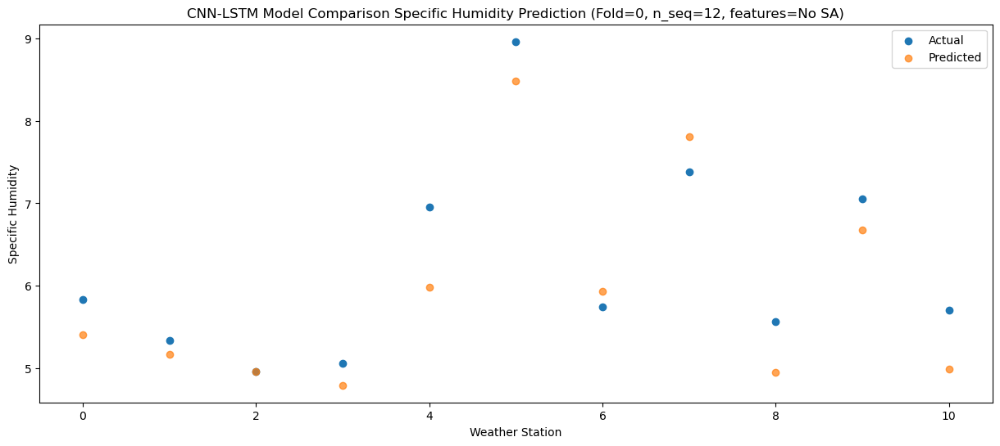

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.61   7.938036
1                 1    8.98   8.185461
2                 2    7.36   7.648219
3                 3    8.11   7.928153
4                 4    9.71   8.051113
5                 5   10.38  10.549217
6                 6    7.58   8.198819
7                 7    9.15   9.706437
8                 8    7.16   6.522422
9                 9    7.89   7.711614
10               10    5.71   5.294296


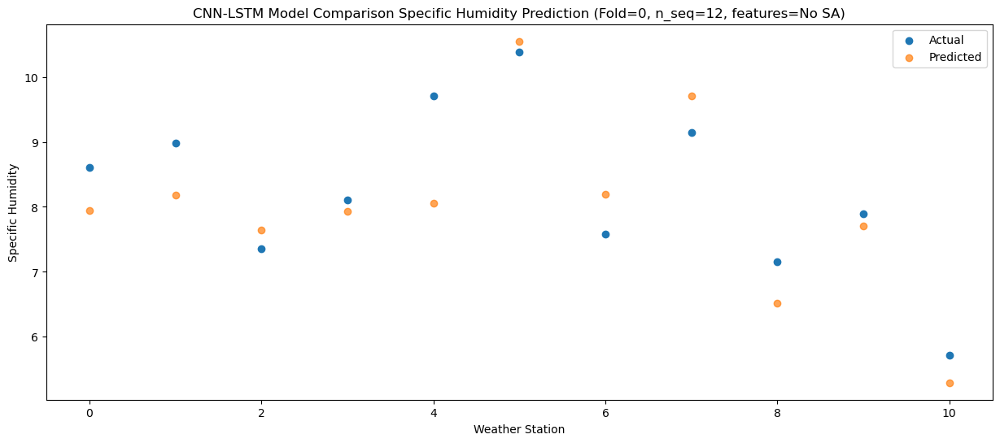

Model: "sequential_501"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_501 (Conv1D)         (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_501 (MaxPooli  (None, 1, 1024)          0         
 ng1D)                                                           
                                                                 
 dropout_1503 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1002 (LSTM)            (None, 1, 256)            1311744   
                                                                 
 dropout_1504 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1003 (LSTM)            (None, 256)               525312    
                                                    

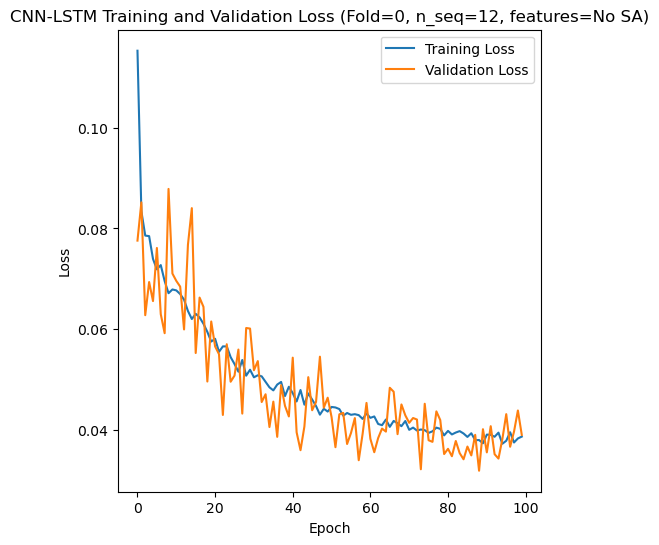

Epoch 1/100
84/84 [==============================] - 28s 120ms/step - loss: 0.1100 - accuracy: 0.6190 - mae: 0.0925 - rmse: 0.1100 - mape: 20.0982 - pearson: 0.6643 - val_loss: 0.0717 - val_accuracy: 0.7000 - val_mae: 0.0583 - val_rmse: 0.0717 - val_mape: 12.7676 - val_pearson: 0.7668
Epoch 2/100
84/84 [==============================] - 4s 52ms/step - loss: 0.0842 - accuracy: 0.7143 - mae: 0.0684 - rmse: 0.0842 - mape: 15.5314 - pearson: 0.7282 - val_loss: 0.0803 - val_accuracy: 0.7000 - val_mae: 0.0647 - val_rmse: 0.0803 - val_mape: 14.0331 - val_pearson: 0.6744
Epoch 3/100
84/84 [==============================] - 4s 53ms/step - loss: 0.0804 - accuracy: 0.7381 - mae: 0.0639 - rmse: 0.0804 - mape: 14.5090 - pearson: 0.7306 - val_loss: 0.0738 - val_accuracy: 0.7000 - val_mae: 0.0593 - val_rmse: 0.0738 - val_mape: 12.3164 - val_pearson: 0.7942
Epoch 4/100
84/84 [==============================] - 5s 56ms/step - loss: 0.0734 - accuracy: 0.7976 - mae: 0.0588 - rmse: 0.0734 - mape: 13.1574 -

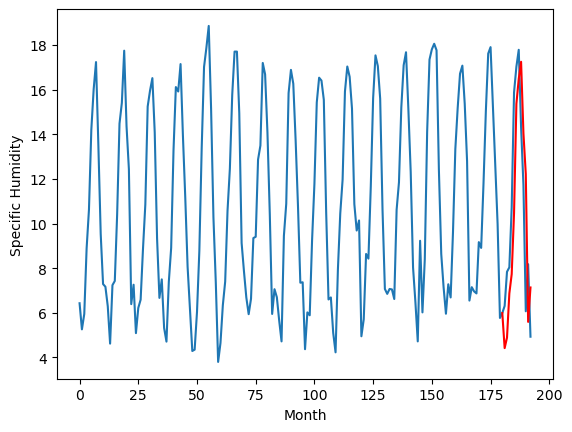

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		3.90		-0.44
4.53		4.16		-0.37
6.06		6.46		0.40
6.42		7.40		0.98
9.34		10.40		1.06
13.32		15.43		2.11
15.19		16.61		1.42
15.40		17.29		1.89
12.45		13.75		1.30
10.41		11.91		1.50
4.82		5.12		0.30
6.99		6.67		-0.32
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.15, 3.8990809988975528, 4.159715659618378, 6.457614905834198, 7.4033933353424075, 10.396417684555054, 15.433094091415406, 16.609504528045655, 17.291013605594635, 13.754091150760651, 11.913597233295441, 5.121873505115509, 6.668922073841095]


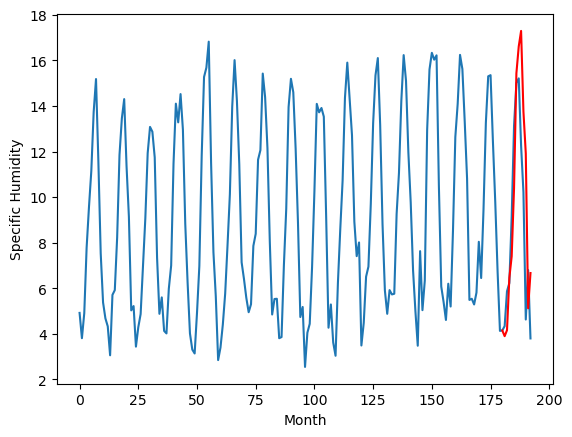

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		2.72		-0.50
3.22		3.04		-0.18
5.84		5.57		-0.27
5.55		6.38		0.83
8.39		9.66		1.27
12.91		14.65		1.74
14.50		15.82		1.32
14.72		16.34		1.62
11.96		12.79		0.83
9.21		10.76		1.55
3.71		3.94		0.23
6.35		5.91		-0.44
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.12, 2.719211287498474, 3.0436761450767515, 5.56830049276352, 6.38497609615326, 9.663175530433655, 14.65047878742218, 15.815305180549622, 16.343933231830597, 12.789871580600739, 10.76205504655838, 3.9444724392890933, 5.909006960391999]


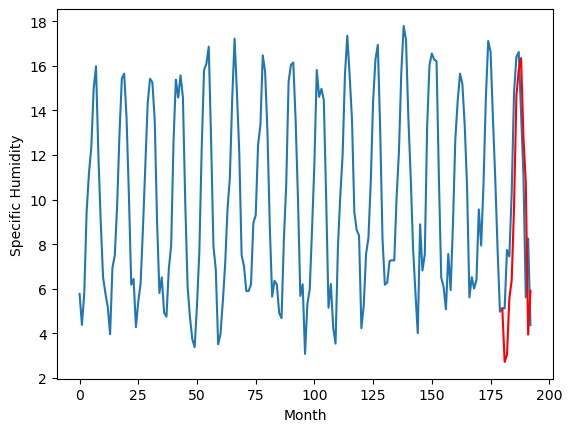

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.12		0.09
2.10		2.22		0.12
4.74		5.09		0.35
6.08		5.84		-0.24
9.97		9.51		-0.46
13.16		14.16		1.00
13.64		15.31		1.67
13.98		15.53		1.55
10.89		11.93		1.04
8.64		9.79		1.15
4.19		3.50		-0.69
7.11		5.44		-1.67
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.35, 2.1245722275972367, 2.216871793270111, 5.085334117412567, 5.83947306394577, 9.513266379833222, 14.16476422071457, 15.307503397464753, 15.533387835025788, 11.93384187936783, 9.785470182895661, 3.5027925324440012, 5.437662060260774]


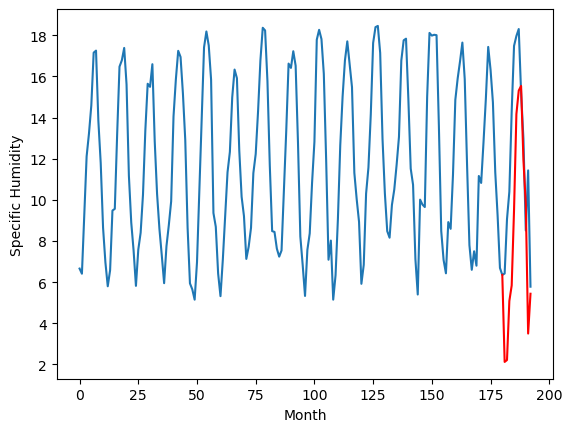

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.17		-0.01
6.22		6.22		0.00
8.94		9.13		0.19
10.20		9.91		-0.29
14.23		13.61		-0.62
17.64		18.30		0.66
17.82		19.45		1.63
17.86		19.68		1.82
14.76		16.01		1.25
12.81		13.88		1.07
8.22		7.56		-0.66
11.15		9.46		-1.69
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.08, 6.172009311914444, 6.2203190851211545, 9.132621340751648, 9.914538972377777, 13.614051692485809, 18.299196593761444, 19.45410465478897, 19.67822761118412, 16.01476497232914, 13.879368014931678, 7.55950088083744, 9.459859080910682]


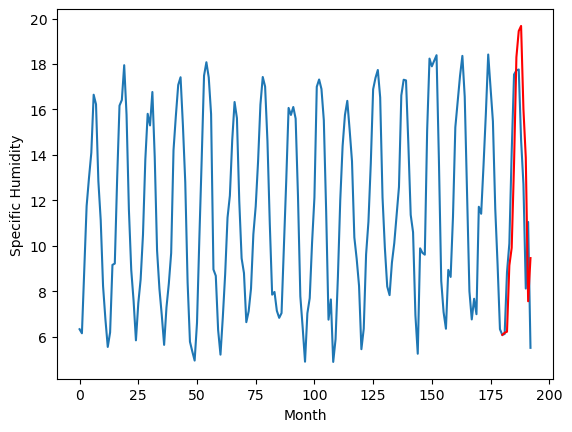

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		4.82		-0.93
5.12		4.63		-0.49
5.91		6.63		0.72
7.21		7.37		0.16
11.52		10.29		-1.23
13.69		13.81		0.12
15.02		14.75		-0.27
15.24		14.90		-0.34
11.70		12.24		0.54
8.59		10.55		1.96
6.75		6.29		-0.46
5.70		6.63		0.93
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.92, 4.820188289582729, 4.625291114747524, 6.630846267640591, 7.370248502194881, 10.290974324643612, 13.807929700314999, 14.75067824691534, 14.897711506187916, 12.244270315468311, 10.551522245705128, 6.293389311134815, 6.627788862287998]


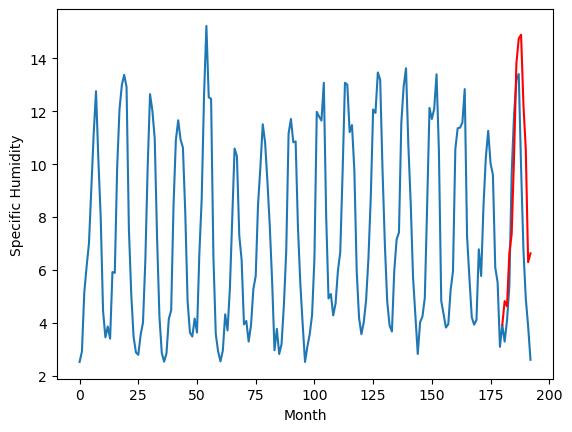

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.34		-0.32
5.78		5.60		-0.18
7.34		7.82		0.48
7.96		8.79		0.83
10.89		11.71		0.82
15.24		16.74		1.50
17.74		17.92		0.18
18.03		18.64		0.61
14.68		15.12		0.44
12.55		13.33		0.78
6.62		6.56		-0.06
8.49		8.01		-0.48
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.16, 5.33558609008789, 5.595304239988327, 7.821973551511764, 8.792163361310958, 11.709239710569381, 16.74193405032158, 17.918936122655868, 18.635040689706802, 15.123226333856582, 13.325289417505264, 6.559616256952285, 8.007000733613967]


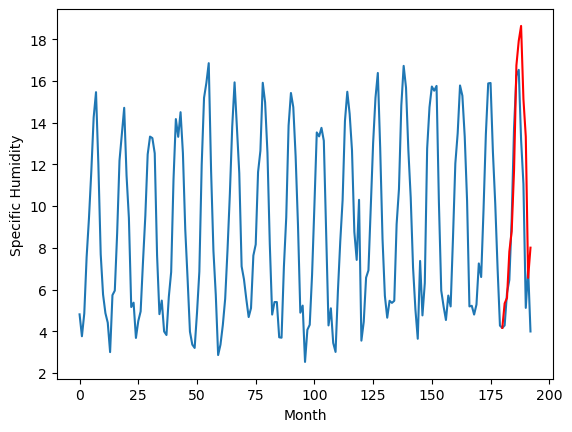

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.27		-0.26
6.01		6.04		0.03
8.74		8.93		0.19
9.97		9.98		0.01
13.18		13.50		0.32
17.94		18.42		0.48
18.57		19.65		1.08
18.42		20.04		1.62
15.17		16.08		0.91
12.44		14.20		1.76
7.88		7.72		-0.16
9.52		9.03		-0.49
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.84, 6.266427550315857, 6.041570115685463, 8.925197530388832, 9.975877214074135, 13.498241592049599, 18.423533607125282, 19.654143024086952, 20.03703375518322, 16.078245121836662, 14.203058916926384, 7.716018397212029, 9.034884888529778]


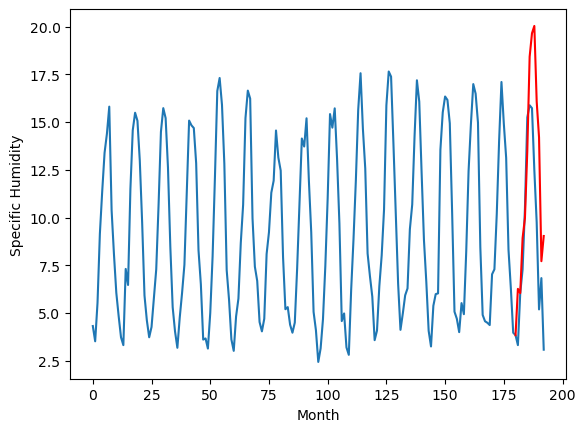

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.05		-0.44
5.68		5.49		-0.19
8.29		8.40		0.11
9.45		9.39		-0.06
13.67		13.06		-0.61
16.81		17.32		0.51
17.86		18.49		0.63
17.44		18.56		1.12
13.87		14.83		0.96
11.43		13.00		1.57
7.90		7.66		-0.24
7.29		8.30		1.01
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.73, 6.049840407371521, 5.492768244743347, 8.402583079338074, 9.388828353881836, 13.060855464935303, 17.31755407333374, 18.48705871582031, 18.562670567929743, 14.82833896011114, 13.002058723866938, 7.658333996236323, 8.297695020139216]


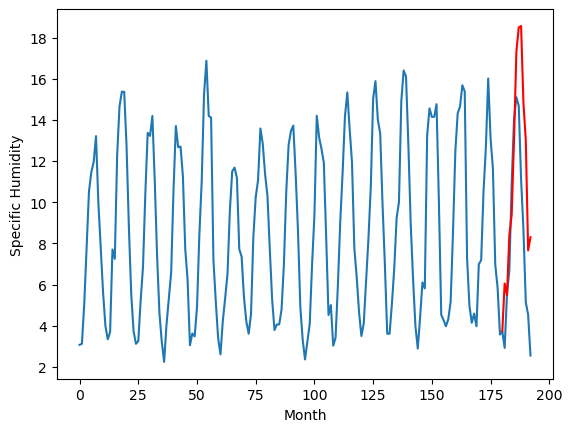

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.39		-0.32
1.97		1.86		-0.11
3.79		4.19		0.40
3.96		5.02		1.06
9.11		8.23		-0.88
12.10		11.76		-0.34
13.34		12.77		-0.57
12.31		12.77		0.46
9.35		9.78		0.43
5.91		8.12		2.21
3.55		3.96		0.41
2.57		3.98		1.41
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.83, 2.390828405022621, 1.8575798016786575, 4.188297603726387, 5.019908104538917, 8.231366310715675, 11.759423170685768, 12.767234597802162, 12.768194995510857, 9.779800735104363, 8.124803267109673, 3.9570586305740285, 3.980526804614346]


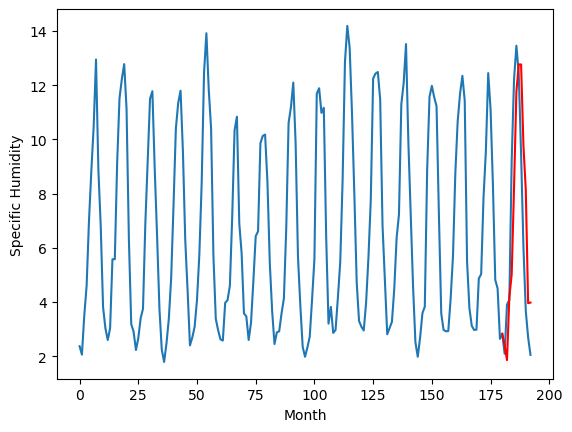

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.18		0.10
4.12		4.12		0.00
5.36		5.66		0.30
6.73		7.07		0.34
8.26		9.10		0.84
13.58		14.06		0.48
15.44		15.23		-0.21
15.78		16.37		0.59
12.59		13.01		0.42
10.73		11.84		1.11
5.54		5.61		0.07
5.42		5.53		0.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.69, 4.184994099140167, 4.12307803094387, 5.663724583983421, 7.069841665625572, 9.097585720419882, 14.0606255954504, 15.234945816397666, 16.372055334448813, 13.012768072485922, 11.844379348158835, 5.609335822463034, 5.529632320106028]


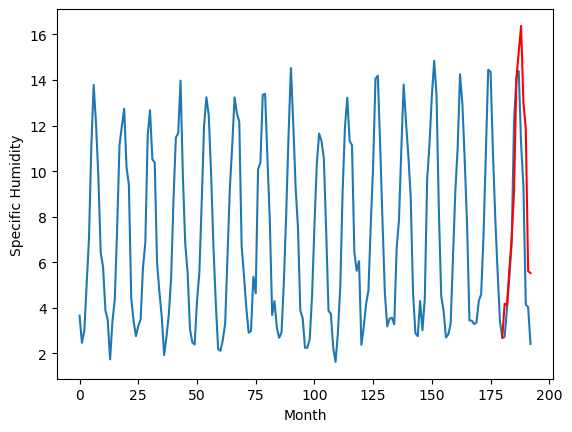

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.419236538410186, 3.8990809988975528, 2.719211287498474, 2.1245722275972367, 6.172009311914444, 4.820188289582729, 5.33558609008789, 6.266427550315857, 6.049840407371521, 2.390828405022621, 4.184994099140167]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.419237
1                 1    4.34   3.899081
2                 2    3.22   2.719211
3                 3    2.03   2.124572
4                 4    6.18   6.172009
5                 5    5.75   4.820188
6                 6    5.66   5.335586
7                 7    6.53   6.266428
8                 8    6.49   6.049840
9                 9    2.71   2.390828
10               10    4.08   4.184994


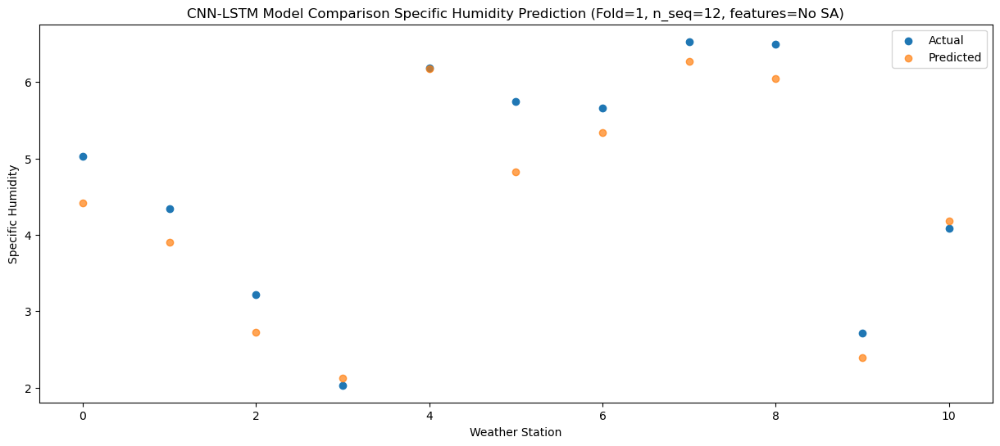

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35   4.886444
1                 1    4.53   4.159716
2                 2    3.22   3.043676
3                 3    2.10   2.216872
4                 4    6.22   6.220319
5                 5    5.12   4.625291
6                 6    5.78   5.595304
7                 7    6.01   6.041570
8                 8    5.68   5.492768
9                 9    1.97   1.857580
10               10    4.12   4.123078


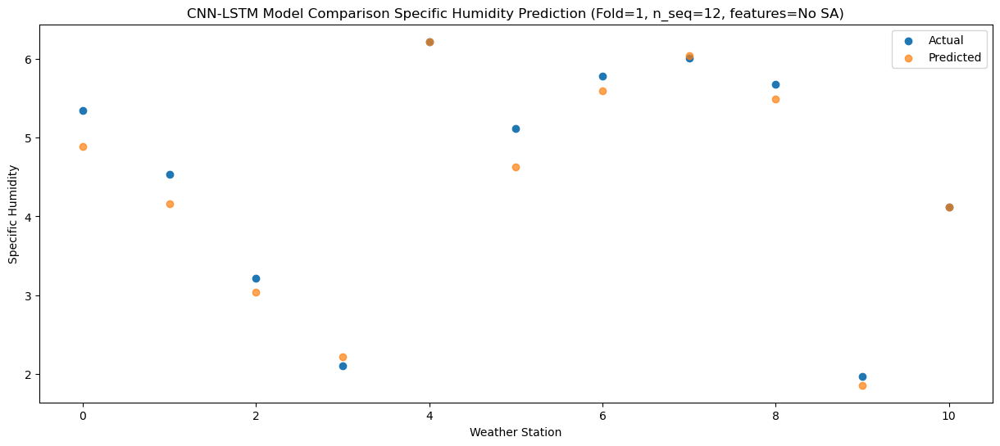

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   6.868772
1                 1    6.06   6.457615
2                 2    5.84   5.568300
3                 3    4.74   5.085334
4                 4    8.94   9.132621
5                 5    5.91   6.630846
6                 6    7.34   7.821974
7                 7    8.74   8.925198
8                 8    8.29   8.402583
9                 9    3.79   4.188298
10               10    5.36   5.663725


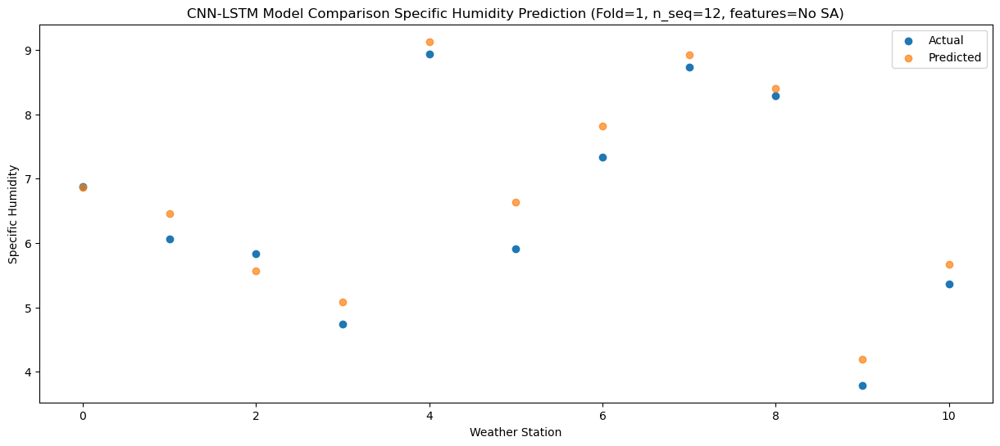

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.08   7.734934
1                 1    6.42   7.403393
2                 2    5.55   6.384976
3                 3    6.08   5.839473
4                 4   10.20   9.914539
5                 5    7.21   7.370249
6                 6    7.96   8.792163
7                 7    9.97   9.975877
8                 8    9.45   9.388828
9                 9    3.96   5.019908
10               10    6.73   7.069842


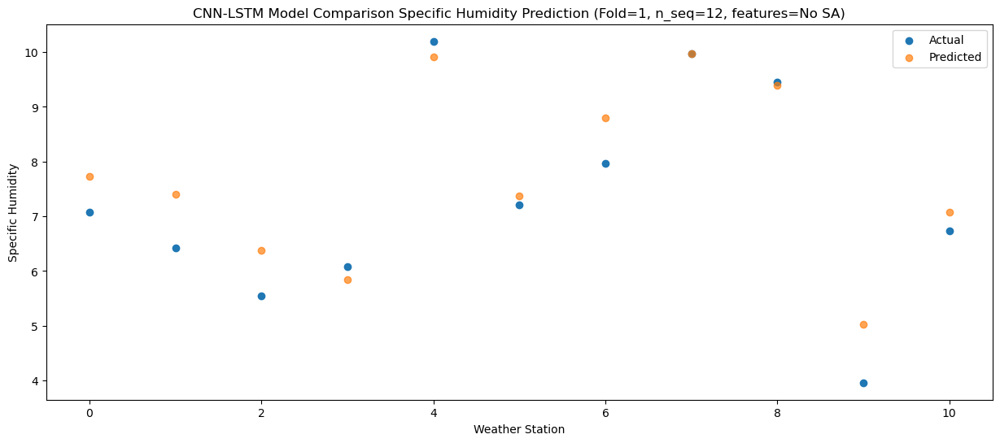

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    9.76  10.470795
1                 1    9.34  10.396418
2                 2    8.39   9.663176
3                 3    9.97   9.513266
4                 4   14.23  13.614052
5                 5   11.52  10.290974
6                 6   10.89  11.709240
7                 7   13.18  13.498242
8                 8   13.67  13.060855
9                 9    9.11   8.231366
10               10    8.26   9.097586


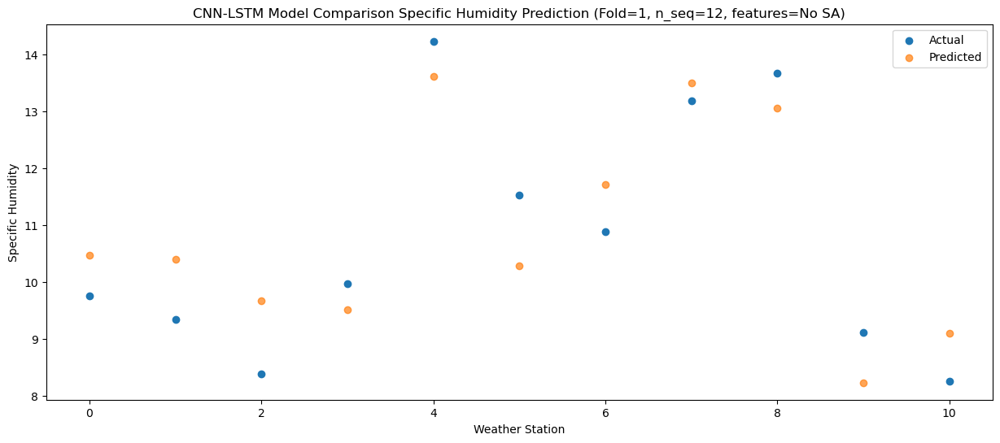

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.92  15.366971
1                 1   13.32  15.433094
2                 2   12.91  14.650479
3                 3   13.16  14.164764
4                 4   17.64  18.299197
5                 5   13.69  13.807930
6                 6   15.24  16.741934
7                 7   17.94  18.423534
8                 8   16.81  17.317554
9                 9   12.10  11.759423
10               10   13.58  14.060626


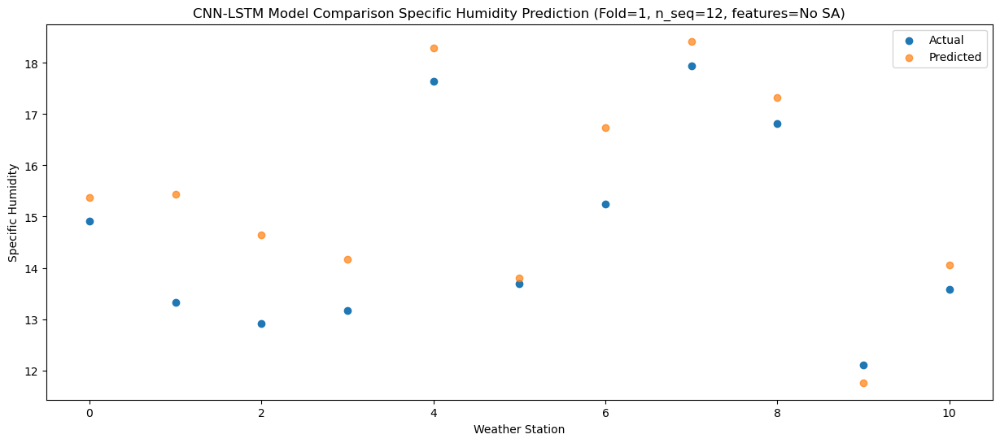

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.07  16.485782
1                 1   15.19  16.609505
2                 2   14.50  15.815305
3                 3   13.64  15.307503
4                 4   17.82  19.454105
5                 5   15.02  14.750678
6                 6   17.74  17.918936
7                 7   18.57  19.654143
8                 8   17.86  18.487059
9                 9   13.34  12.767235
10               10   15.44  15.234946


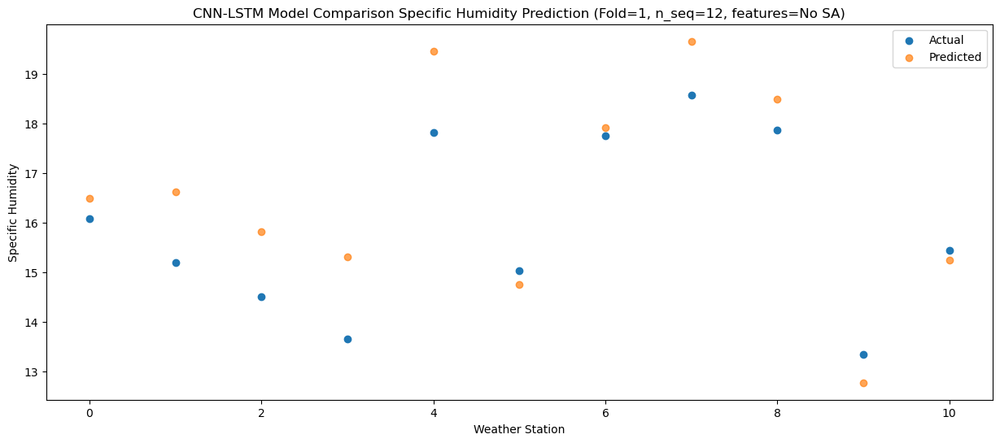

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.83  17.252192
1                 1   15.40  17.291014
2                 2   14.72  16.343933
3                 3   13.98  15.533388
4                 4   17.86  19.678228
5                 5   15.24  14.897712
6                 6   18.03  18.635041
7                 7   18.42  20.037034
8                 8   17.44  18.562671
9                 9   12.31  12.768195
10               10   15.78  16.372055


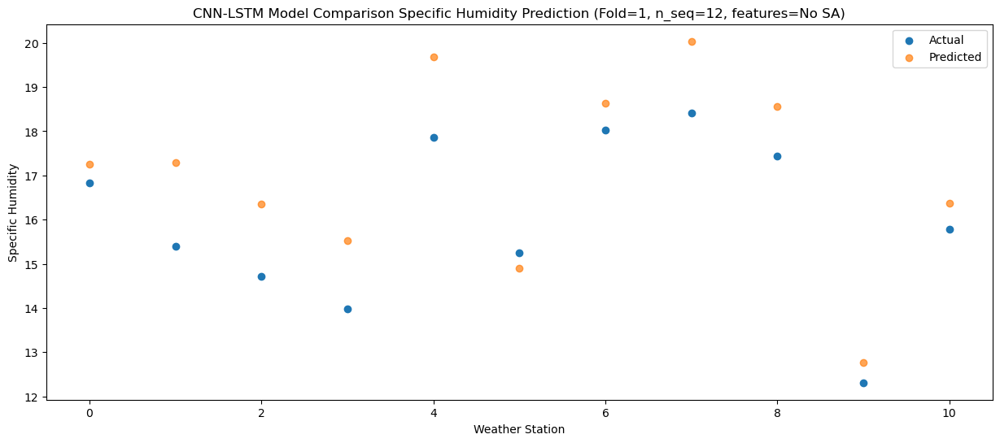

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.35  14.043532
1                 1   12.45  13.754091
2                 2   11.96  12.789872
3                 3   10.89  11.933842
4                 4   14.76  16.014765
5                 5   11.70  12.244270
6                 6   14.68  15.123226
7                 7   15.17  16.078245
8                 8   13.87  14.828339
9                 9    9.35   9.779801
10               10   12.59  13.012768


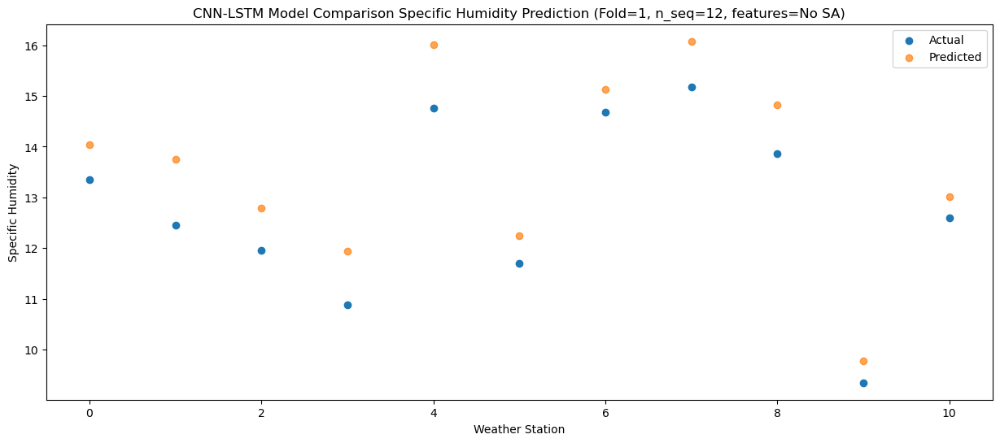

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.77  12.218728
1                 1   10.41  11.913597
2                 2    9.21  10.762055
3                 3    8.64   9.785470
4                 4   12.81  13.879368
5                 5    8.59  10.551522
6                 6   12.55  13.325289
7                 7   12.44  14.203059
8                 8   11.43  13.002059
9                 9    5.91   8.124803
10               10   10.73  11.844379


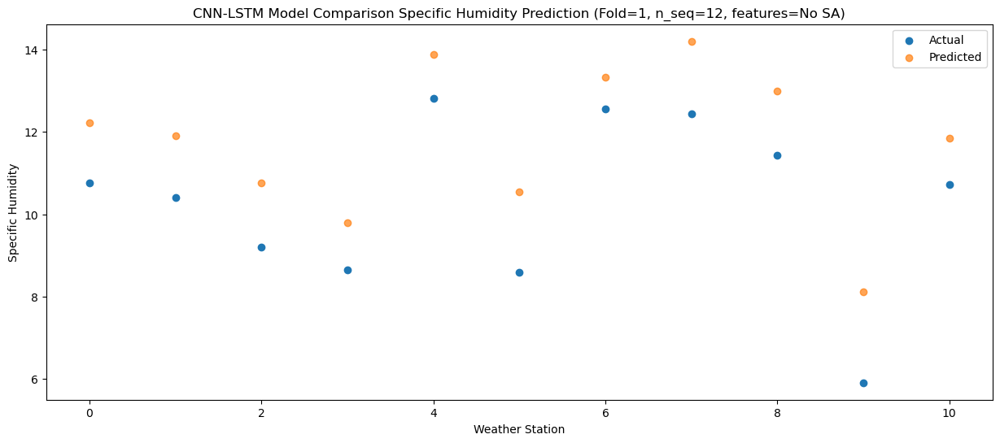

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.11   5.594500
1                 1    4.82   5.121874
2                 2    3.71   3.944472
3                 3    4.19   3.502793
4                 4    8.22   7.559501
5                 5    6.75   6.293389
6                 6    6.62   6.559616
7                 7    7.88   7.716018
8                 8    7.90   7.658334
9                 9    3.55   3.957059
10               10    5.54   5.609336


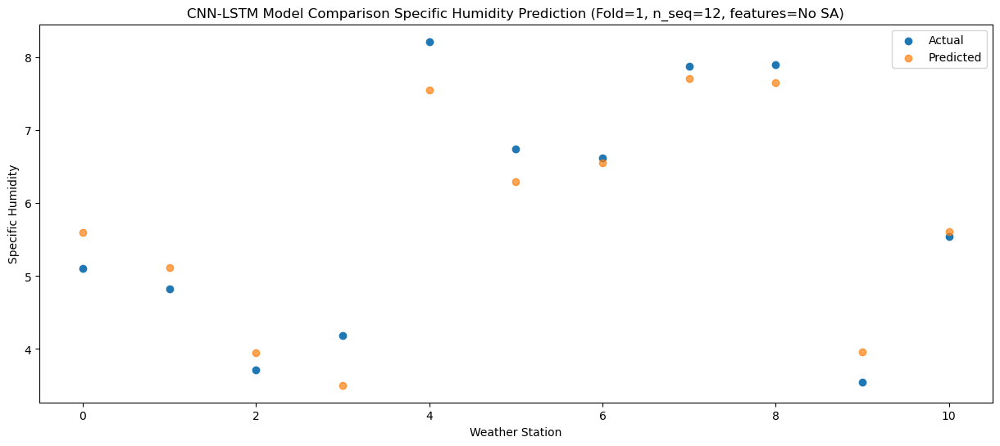

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.22   7.136820
1                 1    6.99   6.668922
2                 2    6.35   5.909007
3                 3    7.11   5.437662
4                 4   11.15   9.459859
5                 5    5.70   6.627789
6                 6    8.49   8.007001
7                 7    9.52   9.034885
8                 8    7.29   8.297695
9                 9    2.57   3.980527
10               10    5.42   5.529632


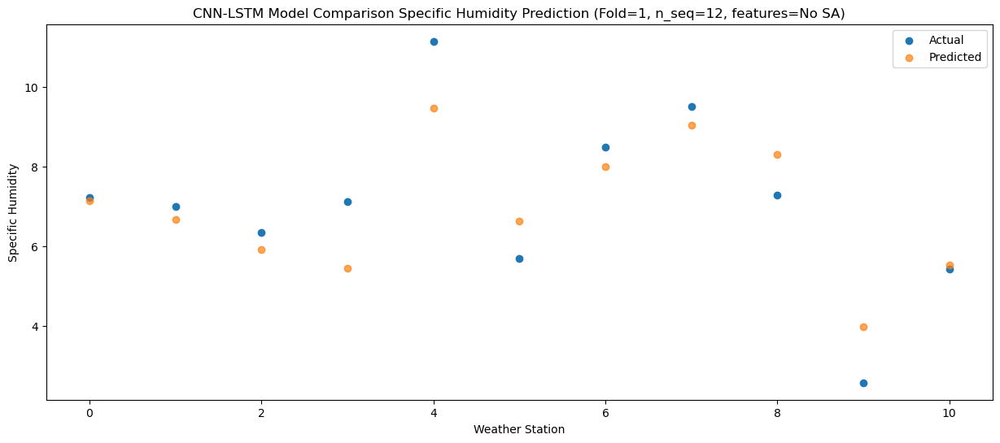

Model: "sequential_502"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_502 (Conv1D)         (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_502 (MaxPooli  (None, 1, 1024)          0         
 ng1D)                                                           
                                                                 
 dropout_1506 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1004 (LSTM)            (None, 1, 256)            1311744   
                                                                 
 dropout_1507 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1005 (LSTM)            (None, 256)               525312    
                                                    

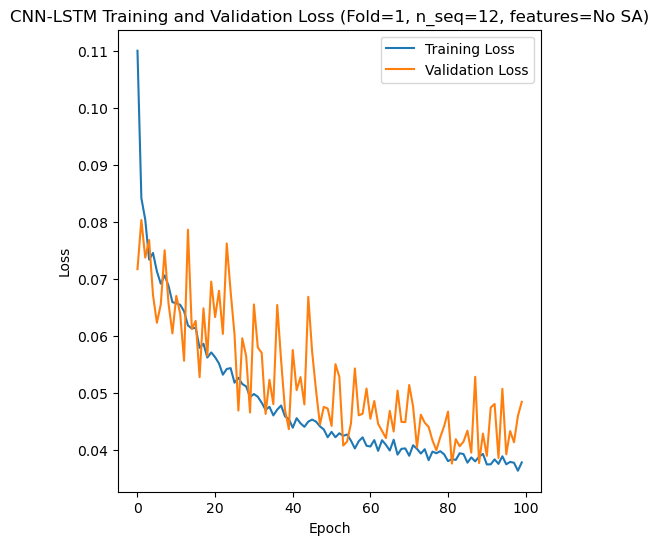

Epoch 1/100
84/84 [==============================] - 26s 131ms/step - loss: 0.1165 - accuracy: 0.6071 - mae: 0.0969 - rmse: 0.1165 - mape: 20.9456 - pearson: 0.6519 - val_loss: 0.0656 - val_accuracy: 1.0000 - val_mae: 0.0502 - val_rmse: 0.0656 - val_mape: 12.0431 - val_pearson: 0.8985
Epoch 2/100
84/84 [==============================] - 7s 89ms/step - loss: 0.0851 - accuracy: 0.6548 - mae: 0.0682 - rmse: 0.0851 - mape: 15.4261 - pearson: 0.7217 - val_loss: 0.0428 - val_accuracy: 1.0000 - val_mae: 0.0352 - val_rmse: 0.0428 - val_mape: 8.4442 - val_pearson: 0.9361
Epoch 3/100
84/84 [==============================] - 6s 70ms/step - loss: 0.0779 - accuracy: 0.7381 - mae: 0.0625 - rmse: 0.0779 - mape: 14.1858 - pearson: 0.7411 - val_loss: 0.0409 - val_accuracy: 1.0000 - val_mae: 0.0332 - val_rmse: 0.0409 - val_mape: 7.1628 - val_pearson: 0.9458
Epoch 4/100
84/84 [==============================] - 5s 64ms/step - loss: 0.0789 - accuracy: 0.6905 - mae: 0.0630 - rmse: 0.0789 - mape: 14.3591 - p

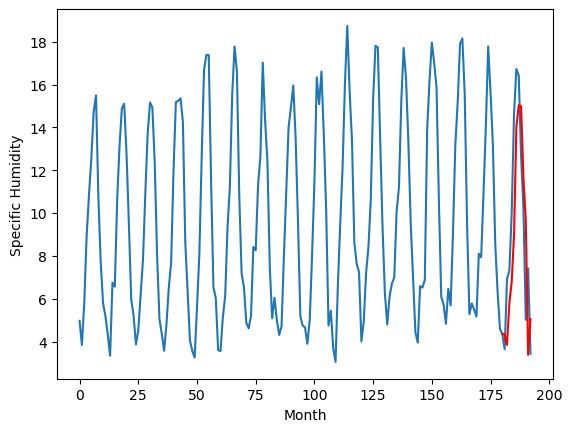

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		1.87		0.03
1.16		0.89		-0.27
3.01		2.72		-0.29
3.13		3.48		0.35
8.25		6.00		-2.25
11.16		9.32		-1.84
12.77		10.39		-2.38
11.15		9.49		-1.66
8.33		6.74		-1.59
4.94		4.87		-0.07
2.51		1.52		-0.99
1.45		1.55		0.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 1.870595415458083, 0.8928810556977986, 2.7201483448594805, 3.47754969201982, 5.997375627383589, 9.321097274646164, 10.385988493785263, 9.489711721763015, 6.743200977668167, 4.872593959197403, 1.5161093076318508, 1.5544341405481106]


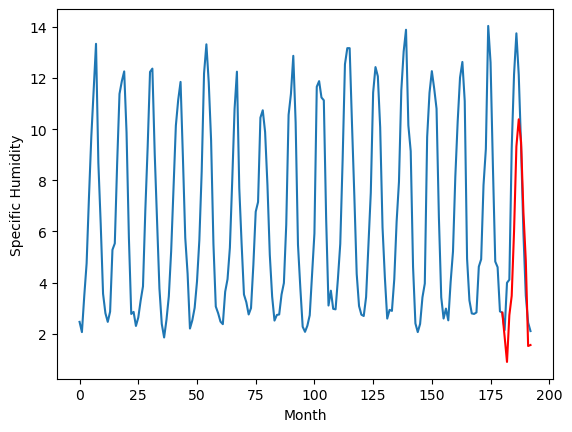

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		4.95		-0.58
7.66		5.50		-2.16
7.88		6.10		-1.78
8.85		6.71		-2.14
10.16		7.81		-2.35
13.94		12.43		-1.51
14.34		13.18		-1.16
14.96		13.46		-1.50
13.68		11.43		-2.25
11.02		9.76		-1.26
7.07		4.18		-2.89
8.47		6.31		-2.16
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.16, 4.946340271234512, 5.499916681051254, 6.099120088815689, 6.706931658983231, 7.813991137742996, 12.43292624592781, 13.176986702680587, 13.461294212341308, 11.42816738128662, 9.762513318061828, 4.176710762977599, 6.307271637916564]


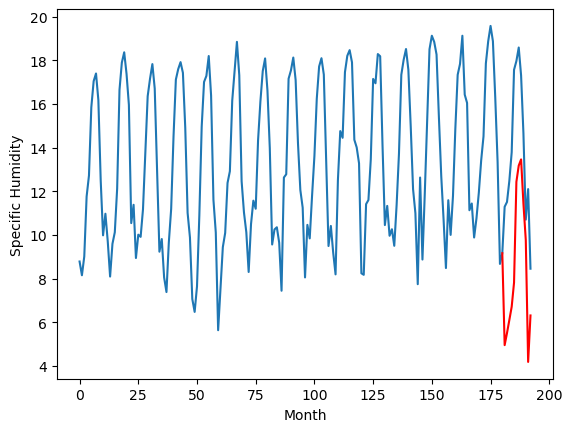

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		4.48		0.50
4.15		3.96		-0.19
4.79		4.78		-0.01
6.14		6.15		0.01
7.82		6.76		-1.06
12.42		11.84		-0.58
15.02		12.86		-2.16
15.76		13.40		-2.36
13.10		10.44		-2.66
10.14		9.51		-0.63
5.69		3.94		-1.75
5.33		3.91		-1.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.44, 4.476659355163574, 3.9622008180618282, 4.779786584377288, 6.15289664030075, 6.760427591800689, 11.84232055902481, 12.860265848636626, 13.395296392440795, 10.441718397140502, 9.511666951179503, 3.9390465593338, 3.9055654606223094]


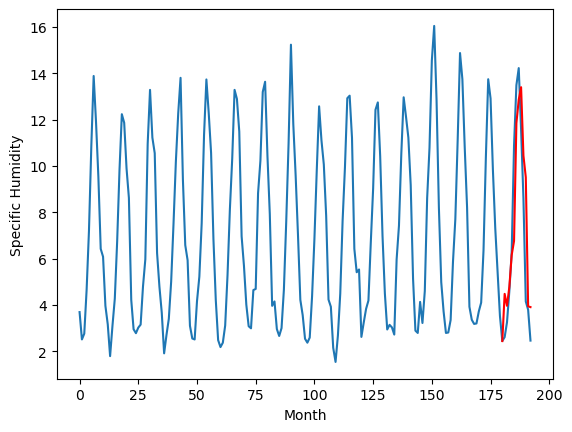

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		4.87		-0.23
5.08		5.06		-0.02
8.37		6.61		-1.76
8.39		7.26		-1.13
11.59		9.36		-2.23
15.48		14.29		-1.19
16.51		15.16		-1.35
16.11		15.19		-0.92
13.97		12.43		-1.54
11.44		10.24		-1.20
5.78		3.84		-1.94
9.06		6.55		-2.51
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.65, 4.866668419241905, 5.0561826390028, 6.614690558314323, 7.26421155154705, 9.363146201968192, 14.29306258380413, 15.157273427844046, 15.190828182995318, 12.425370791256427, 10.24451480180025, 3.8443058517575253, 6.546352484524249]


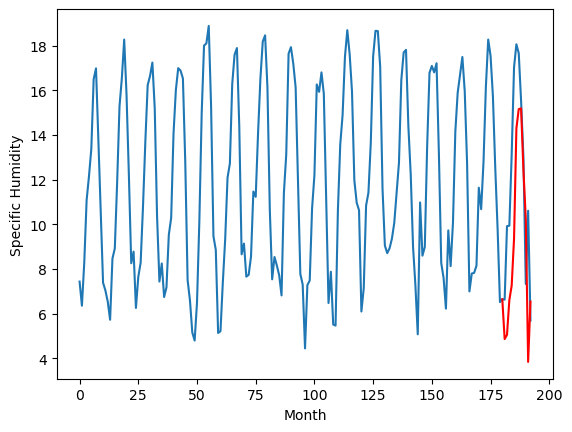

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.35		0.02
2.28		2.01		-0.27
5.27		3.98		-1.29
6.84		4.74		-2.10
11.67		7.30		-4.37
14.31		11.83		-2.48
13.27		12.78		-0.49
13.40		12.45		-0.95
9.84		9.41		-0.43
8.25		7.19		-1.06
4.06		1.51		-2.55
6.93		3.48		-3.45
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.19, 2.351031965613365, 2.00616017639637, 3.9823409682512283, 4.736625528931618, 7.296138859391212, 11.829189873337747, 12.780803239941598, 12.452836013436318, 9.41111395418644, 7.189826942086221, 1.5142612224817285, 3.4828395611047753]


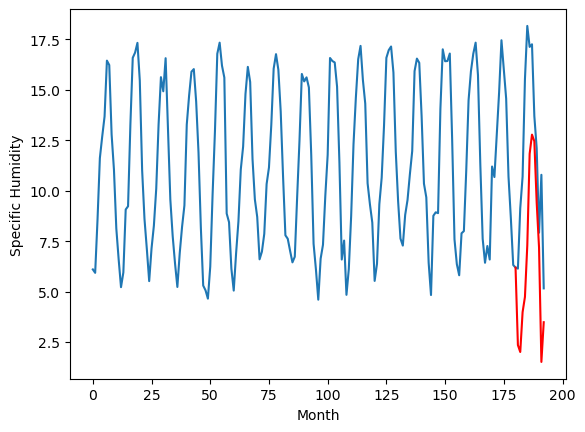

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.62		-0.06
8.35		7.98		-0.37
11.21		10.16		-1.05
12.53		11.03		-1.50
16.73		13.73		-3.00
20.48		18.22		-2.26
21.30		19.25		-2.05
21.68		18.82		-2.86
17.23		15.54		-1.69
14.62		13.34		-1.28
10.63		7.82		-2.81
13.13		9.34		-3.79
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.78, 8.617363824248313, 7.975969030261039, 10.159969999194145, 11.02541263282299, 13.727708174586295, 18.21559364974499, 19.24620933711529, 18.818202211260797, 15.537291480898858, 13.342215492129327, 7.823382331728936, 9.343015148043634]


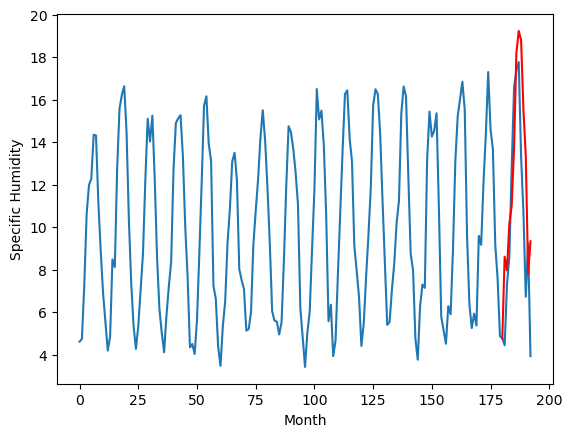

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.77		-0.20
3.84		3.32		-0.52
3.93		4.22		0.29
4.23		4.79		0.56
4.35		6.42		2.07
7.01		9.41		2.40
12.25		10.28		-1.97
12.54		9.59		-2.95
9.78		7.72		-2.06
6.07		6.23		0.16
4.42		3.59		-0.83
4.55		3.61		-0.94
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 3.7717306116223335, 3.31750194221735, 4.22349981456995, 4.79314217954874, 6.415797094404697, 9.408146003782749, 10.28435198456049, 9.592552463114261, 7.721771637499332, 6.232140461504459, 3.585959354937076, 3.613608029261231]


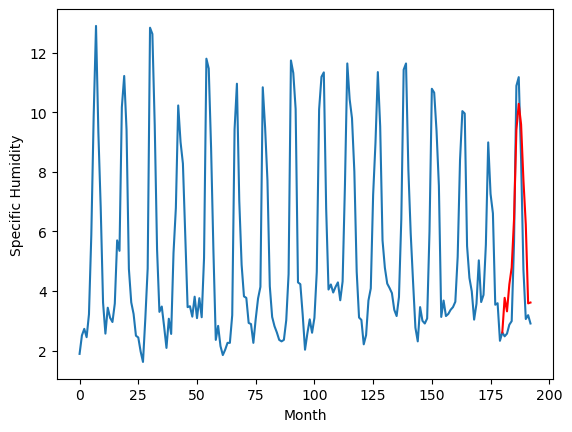

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.60		-0.69
8.82		7.33		-1.49
8.93		7.43		-1.50
10.25		7.90		-2.35
11.73		8.68		-3.05
12.98		11.16		-1.82
14.13		11.90		-2.23
13.53		11.29		-2.24
13.07		10.16		-2.91
10.27		9.18		-1.09
9.73		7.70		-2.03
9.55		7.05		-2.50
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.6, 7.598589184284211, 7.3302948498725895, 7.425921904444695, 7.898443388342858, 8.68422572553158, 11.157089399695398, 11.901796447634698, 11.287299441695215, 10.156374263167383, 9.176611530184747, 7.698226439356805, 7.046067404150964]


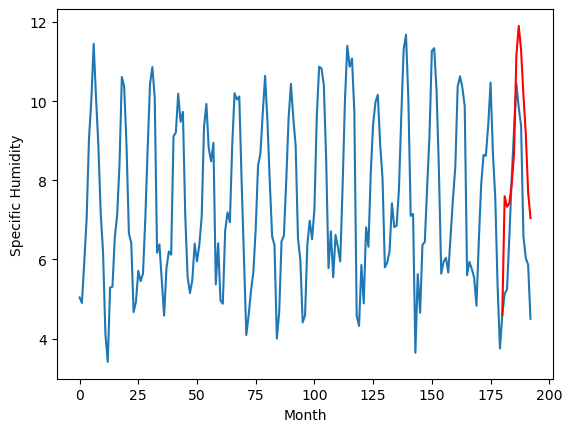

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		5.77		-0.21
6.05		5.68		-0.37
7.78		7.07		-0.71
8.31		8.04		-0.27
11.02		9.65		-1.37
15.52		14.83		-0.69
17.04		15.78		-1.26
17.62		16.05		-1.57
14.02		13.04		-0.98
11.86		11.28		-0.58
6.30		4.82		-1.48
8.15		6.63		-1.52
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.27, 5.773927873373031, 5.675931020081043, 7.071896238625049, 8.03880546838045, 9.649456723034382, 14.832988961040973, 15.780356211960315, 16.04856519252062, 13.039736552536489, 11.27556268721819, 4.82053510695696, 6.6278571322560325]


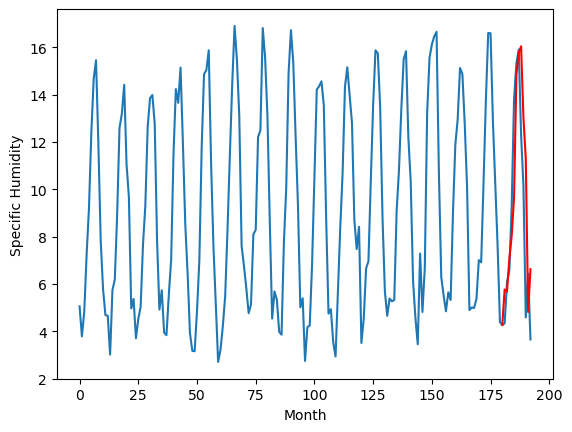

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.23		-0.40
4.87		4.01		-0.86
5.90		5.37		-0.53
6.51		6.44		-0.07
9.18		7.92		-1.26
13.28		13.14		-0.14
14.69		14.12		-0.57
15.08		14.43		-0.65
11.87		11.34		-0.53
10.14		9.72		-0.42
4.78		3.32		-1.46
6.34		4.79		-1.55
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.91, 4.230462874174118, 4.005576248168945, 5.3722380352020265, 6.441529626846314, 7.919706816673279, 13.141417021751405, 14.119433457851411, 14.431897814273835, 11.344232733249665, 9.715406353473664, 3.32106202363968, 4.792895371913911]


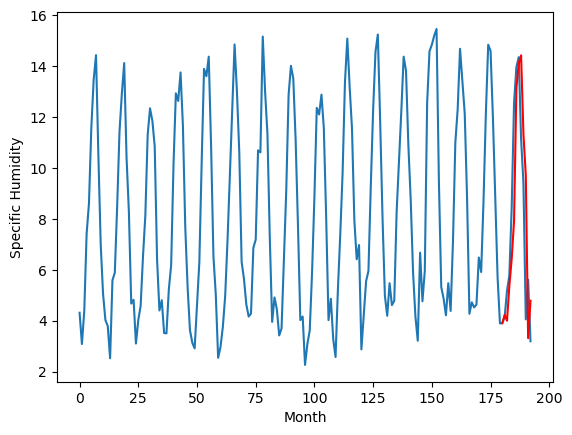

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.322562689781189, 1.870595415458083, 4.946340271234512, 4.476659355163574, 4.866668419241905, 2.351031965613365, 8.617363824248313, 3.7717306116223335, 7.598589184284211, 5.773927873373031, 4.230462874174118]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.322563
1                 1    1.84   1.870595
2                 2    5.53   4.946340
3                 3    3.98   4.476659
4                 4    5.10   4.866668
5                 5    2.33   2.351032
6                 6    8.68   8.617364
7                 7    3.97   3.771731
8                 8    8.29   7.598589
9                 9    5.98   5.773928
10               10    4.63   4.230463


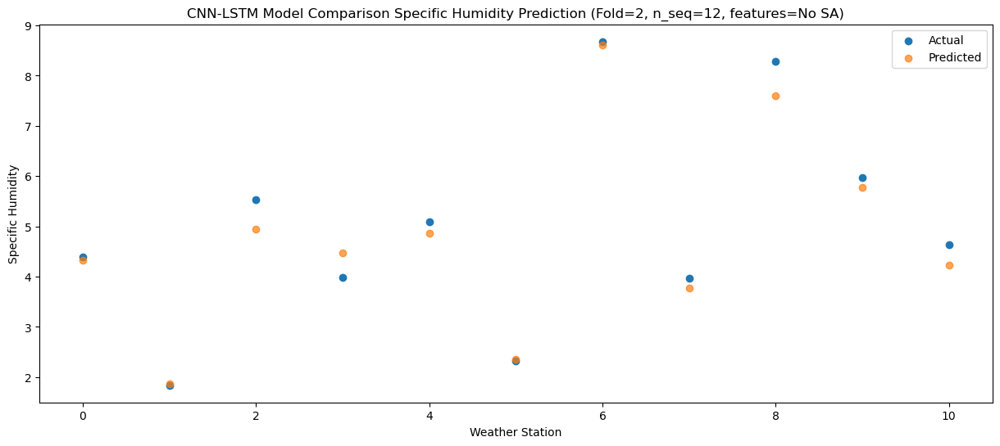

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   3.848584
1                 1    1.16   0.892881
2                 2    7.66   5.499917
3                 3    4.15   3.962201
4                 4    5.08   5.056183
5                 5    2.28   2.006160
6                 6    8.35   7.975969
7                 7    3.84   3.317502
8                 8    8.82   7.330295
9                 9    6.05   5.675931
10               10    4.87   4.005576


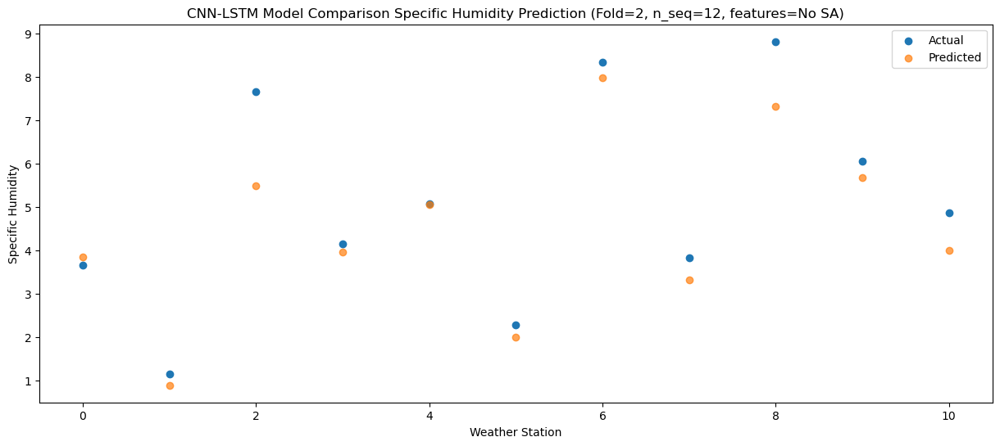

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   5.792516
1                 1    3.01   2.720148
2                 2    7.88   6.099120
3                 3    4.79   4.779787
4                 4    8.37   6.614691
5                 5    5.27   3.982341
6                 6   11.21  10.159970
7                 7    3.93   4.223500
8                 8    8.93   7.425922
9                 9    7.78   7.071896
10               10    5.90   5.372238


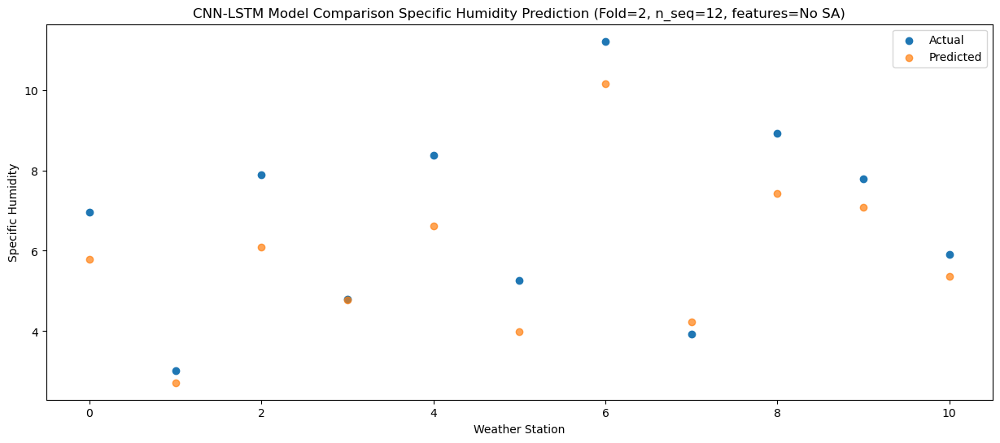

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.34   6.784785
1                 1    3.13   3.477550
2                 2    8.85   6.706932
3                 3    6.14   6.152897
4                 4    8.39   7.264212
5                 5    6.84   4.736626
6                 6   12.53  11.025413
7                 7    4.23   4.793142
8                 8   10.25   7.898443
9                 9    8.31   8.038805
10               10    6.51   6.441530


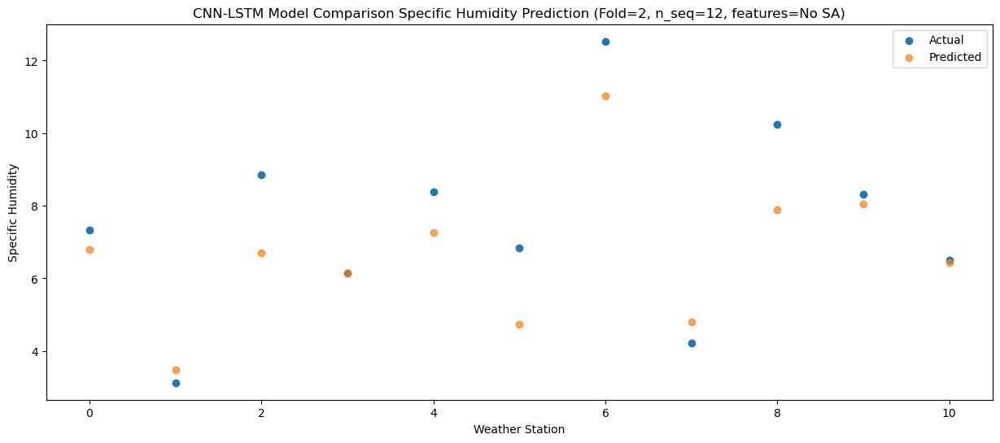

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.01   8.999804
1                 1    8.25   5.997376
2                 2   10.16   7.813991
3                 3    7.82   6.760428
4                 4   11.59   9.363146
5                 5   11.67   7.296139
6                 6   16.73  13.727708
7                 7    4.35   6.415797
8                 8   11.73   8.684226
9                 9   11.02   9.649457
10               10    9.18   7.919707


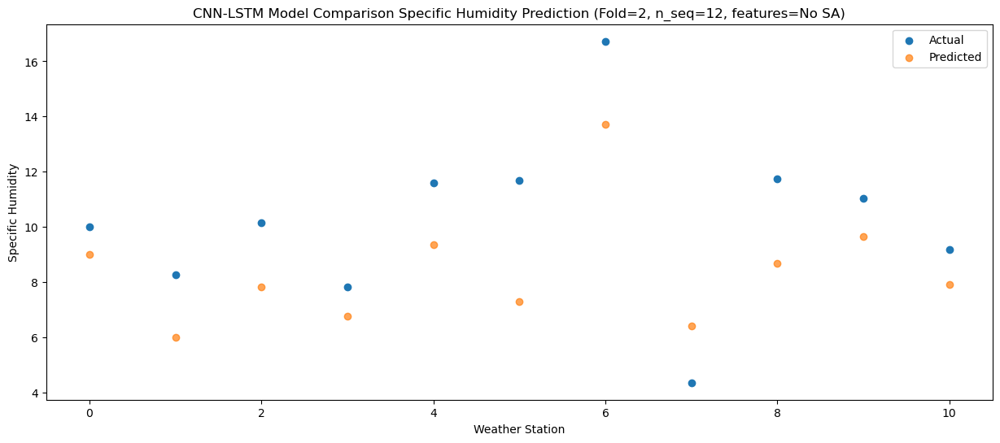

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.66  14.020305
1                 1   11.16   9.321097
2                 2   13.94  12.432926
3                 3   12.42  11.842321
4                 4   15.48  14.293063
5                 5   14.31  11.829190
6                 6   20.48  18.215594
7                 7    7.01   9.408146
8                 8   12.98  11.157089
9                 9   15.52  14.832989
10               10   13.28  13.141417


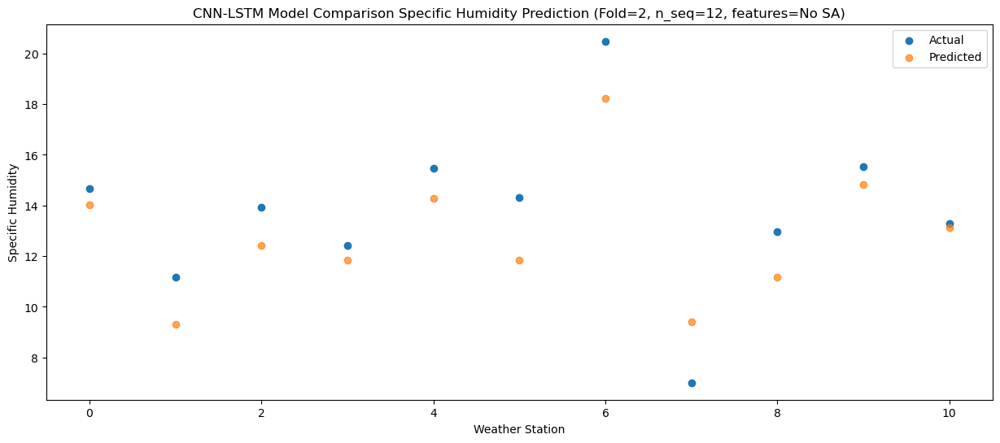

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.76  15.039468
1                 1   12.77  10.385988
2                 2   14.34  13.176987
3                 3   15.02  12.860266
4                 4   16.51  15.157273
5                 5   13.27  12.780803
6                 6   21.30  19.246209
7                 7   12.25  10.284352
8                 8   14.13  11.901796
9                 9   17.04  15.780356
10               10   14.69  14.119433


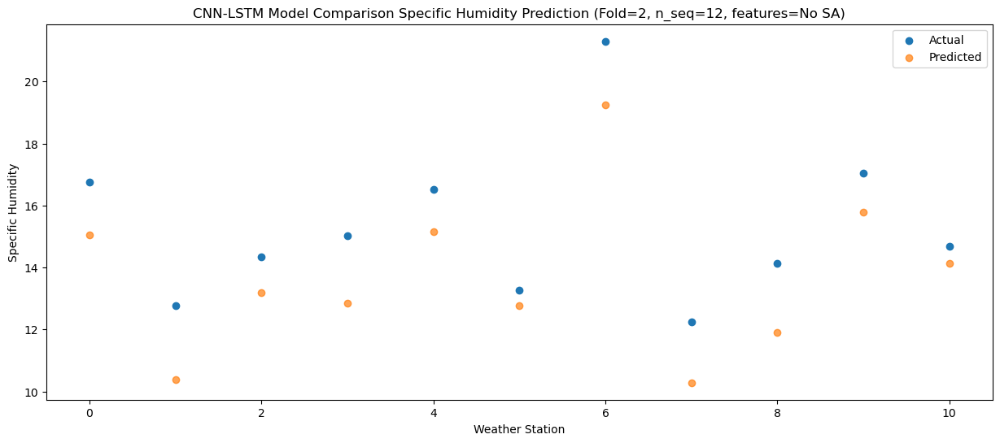

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.46  14.992509
1                 1   11.15   9.489712
2                 2   14.96  13.461294
3                 3   15.76  13.395296
4                 4   16.11  15.190828
5                 5   13.40  12.452836
6                 6   21.68  18.818202
7                 7   12.54   9.592552
8                 8   13.53  11.287299
9                 9   17.62  16.048565
10               10   15.08  14.431898


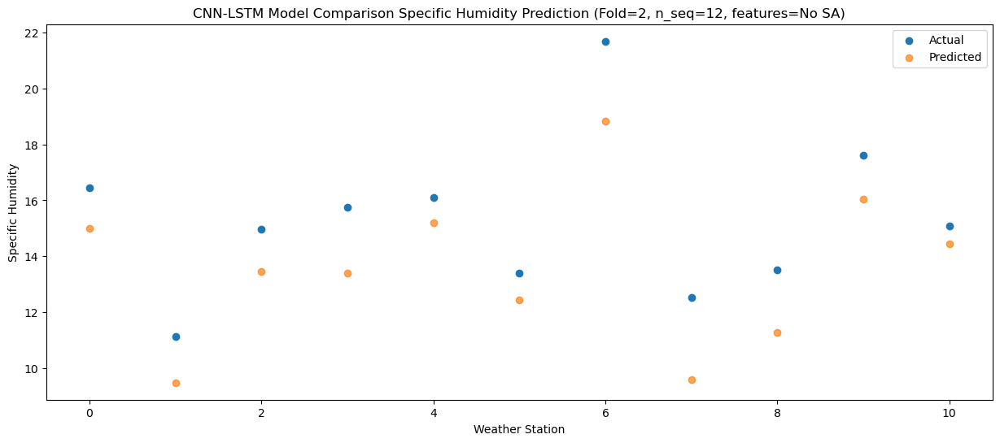

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.69  11.645854
1                 1    8.33   6.743201
2                 2   13.68  11.428167
3                 3   13.10  10.441718
4                 4   13.97  12.425371
5                 5    9.84   9.411114
6                 6   17.23  15.537291
7                 7    9.78   7.721772
8                 8   13.07  10.156374
9                 9   14.02  13.039737
10               10   11.87  11.344233


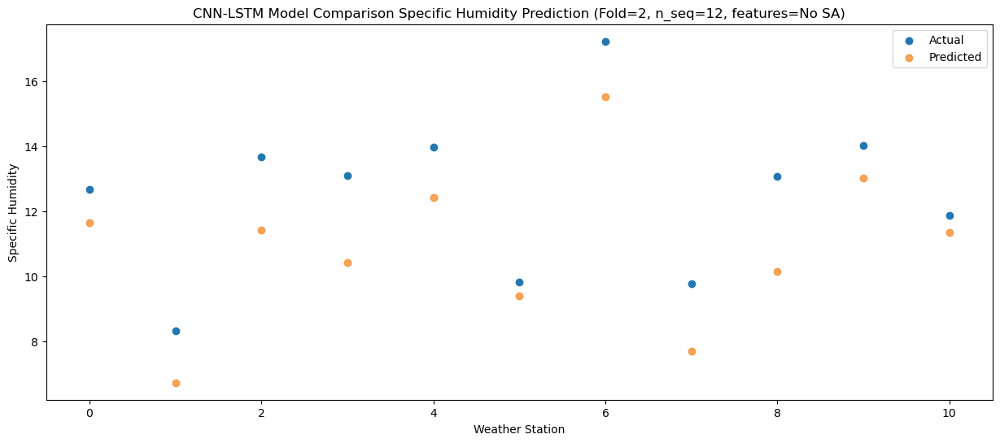

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.24   9.657691
1                 1    4.94   4.872594
2                 2   11.02   9.762513
3                 3   10.14   9.511667
4                 4   11.44  10.244515
5                 5    8.25   7.189827
6                 6   14.62  13.342215
7                 7    6.07   6.232140
8                 8   10.27   9.176612
9                 9   11.86  11.275563
10               10   10.14   9.715406


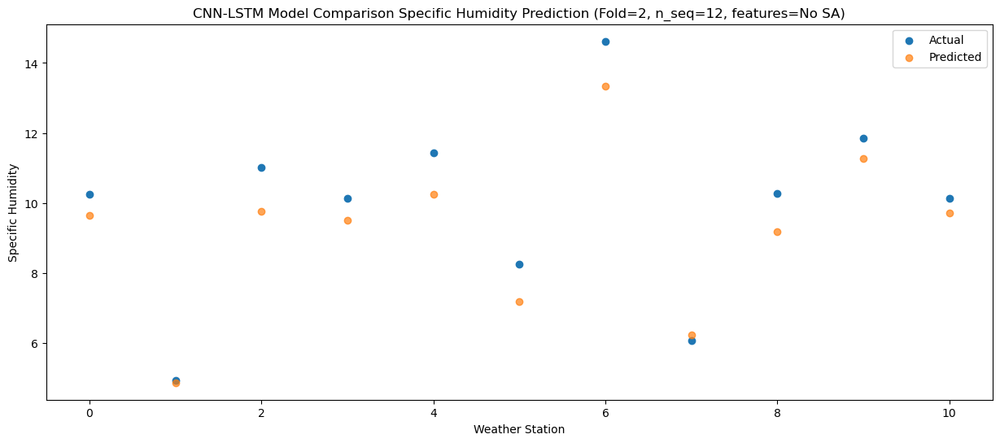

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.05   3.382385
1                 1    2.51   1.516109
2                 2    7.07   4.176711
3                 3    5.69   3.939047
4                 4    5.78   3.844306
5                 5    4.06   1.514261
6                 6   10.63   7.823382
7                 7    4.42   3.585959
8                 8    9.73   7.698226
9                 9    6.30   4.820535
10               10    4.78   3.321062


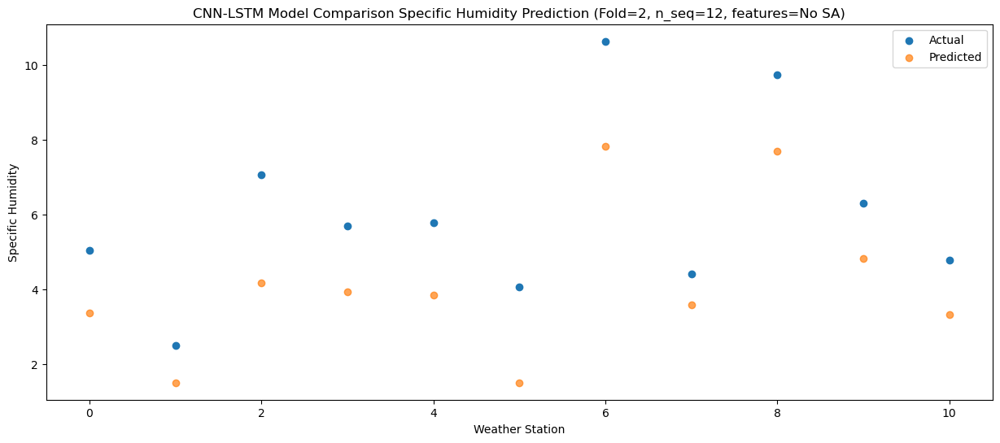

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.45   5.053734
1                 1    1.45   1.554434
2                 2    8.47   6.307272
3                 3    5.33   3.905565
4                 4    9.06   6.546352
5                 5    6.93   3.482840
6                 6   13.13   9.343015
7                 7    4.55   3.613608
8                 8    9.55   7.046067
9                 9    8.15   6.627857
10               10    6.34   4.792895


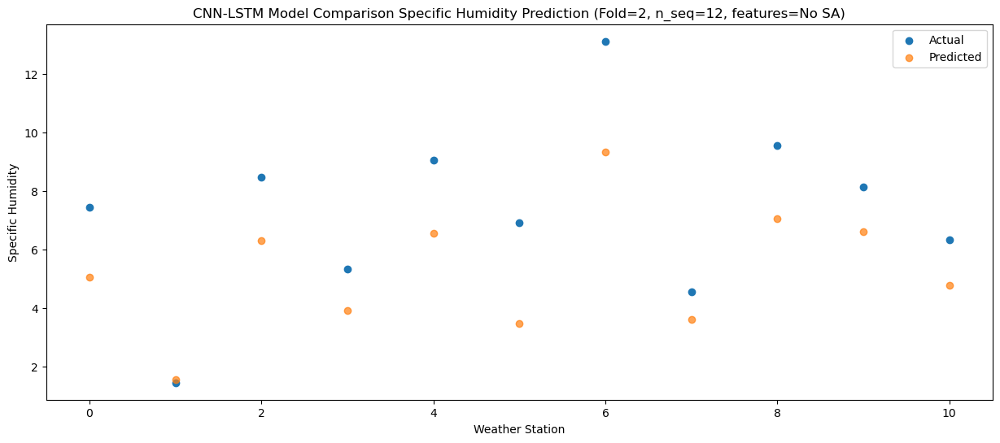

Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_503 (Conv1D)         (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_503 (MaxPooli  (None, 1, 1024)          0         
 ng1D)                                                           
                                                                 
 dropout_1509 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1006 (LSTM)            (None, 1, 256)            1311744   
                                                                 
 dropout_1510 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1007 (LSTM)            (None, 256)               525312    
                                                    

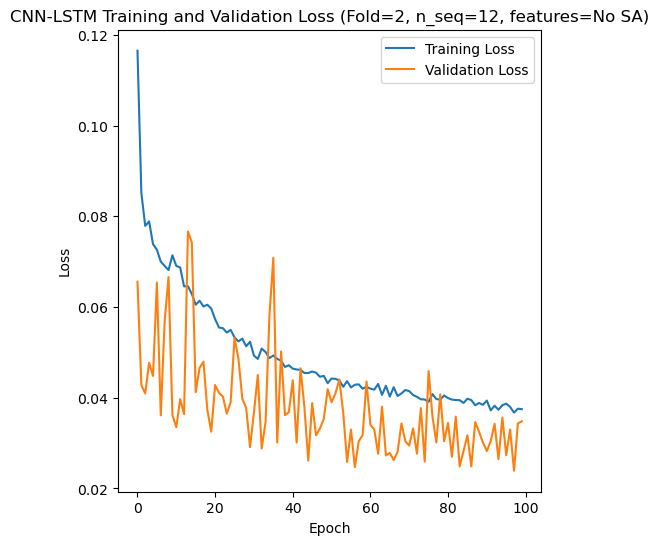

Epoch 1/100
84/84 [==============================] - 18s 66ms/step - loss: 0.1124 - accuracy: 0.5238 - mae: 0.0942 - rmse: 0.1124 - mape: 20.4321 - pearson: 0.6980 - val_loss: 0.0985 - val_accuracy: 0.9000 - val_mae: 0.0750 - val_rmse: 0.0985 - val_mape: 16.1732 - val_pearson: 0.5910
Epoch 2/100
84/84 [==============================] - 3s 30ms/step - loss: 0.0807 - accuracy: 0.6071 - mae: 0.0645 - rmse: 0.0807 - mape: 14.2705 - pearson: 0.7559 - val_loss: 0.0898 - val_accuracy: 0.9000 - val_mae: 0.0685 - val_rmse: 0.0898 - val_mape: 15.3989 - val_pearson: 0.5953
Epoch 3/100
84/84 [==============================] - 2s 28ms/step - loss: 0.0778 - accuracy: 0.6786 - mae: 0.0619 - rmse: 0.0778 - mape: 13.9011 - pearson: 0.7726 - val_loss: 0.0741 - val_accuracy: 0.9000 - val_mae: 0.0555 - val_rmse: 0.0741 - val_mape: 12.1043 - val_pearson: 0.6928
Epoch 4/100
84/84 [==============================] - 3s 30ms/step - loss: 0.0720 - accuracy: 0.6905 - mae: 0.0574 - rmse: 0.0720 - mape: 13.0445 - 

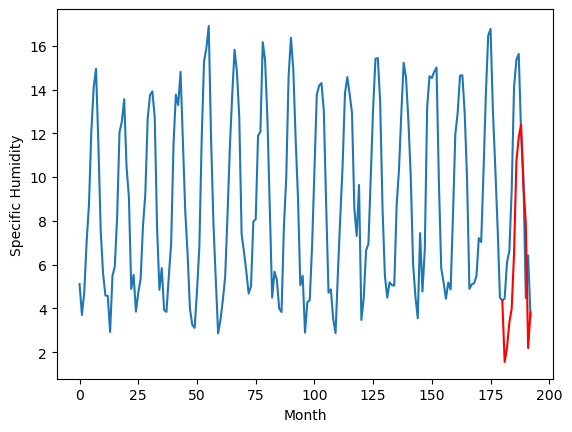

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.61		-0.03
2.08		2.46		0.38
4.59		4.32		-0.27
5.76		5.10		-0.66
9.28		8.60		-0.68
13.81		12.23		-1.58
14.69		13.26		-1.43
14.86		13.25		-1.61
10.89		9.84		-1.05
8.70		7.93		-0.77
4.27		3.20		-1.07
5.24		4.02		-1.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.43, 2.605321067869663, 2.4603947135806084, 4.324863764941693, 5.103678021132946, 8.597914728820324, 12.228900704085827, 13.257967862784863, 13.25446847059764, 9.84156277754344, 7.925712138200179, 3.204001933122054, 4.016382068181411]


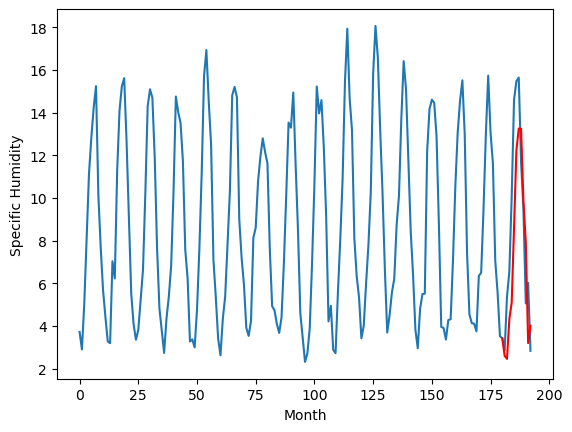

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		6.23		-0.14
6.31		6.60		0.29
6.39		5.93		-0.46
7.01		6.47		-0.54
7.41		7.88		0.47
9.86		9.50		-0.36
10.56		9.86		-0.70
10.09		9.76		-0.33
8.80		8.91		0.11
7.66		7.62		-0.04
8.24		6.93		-1.31
6.74		4.95		-1.79
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.43, 6.229557507038116, 6.59695836186409, 5.931882523298263, 6.473527454137802, 7.878866337537765, 9.49973597407341, 9.860647760629654, 9.7574005651474, 8.91452478647232, 7.617191307544708, 6.9298198747634885, 4.9513063955307]


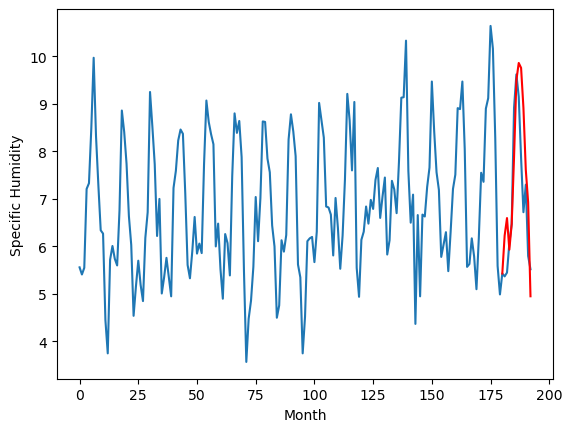

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.38		-0.06
3.37		3.65		0.28
4.67		4.76		0.09
5.86		5.75		-0.11
8.39		7.92		-0.47
13.81		12.37		-1.44
14.44		13.56		-0.88
15.32		14.35		-0.97
11.85		11.15		-0.70
9.79		9.85		0.06
4.10		4.12		0.02
5.24		4.92		-0.32
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.21, 3.3772515273094177, 3.649987450838089, 4.755859128236771, 5.75000398516655, 7.922200611829758, 12.370171002149583, 13.557380369901658, 14.347306898832322, 11.150030544996262, 9.85026901125908, 4.1248113429546365, 4.9153933441638955]


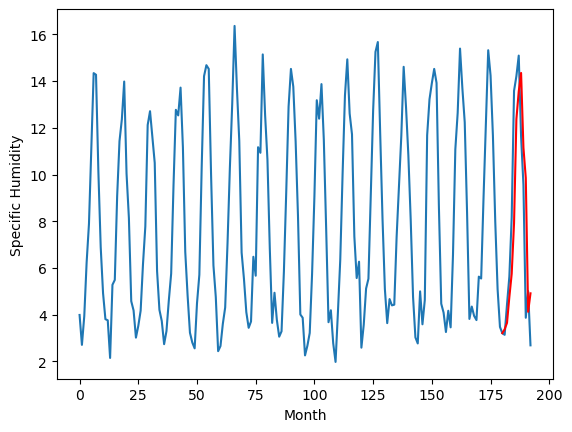

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		4.80		-0.11
4.08		4.62		0.54
6.56		6.11		-0.45
7.62		7.16		-0.46
10.04		9.87		-0.17
14.50		13.96		-0.54
16.45		15.11		-1.34
16.54		15.53		-1.01
12.77		12.04		-0.73
10.82		10.59		-0.23
5.70		5.49		-0.21
6.40		5.76		-0.64
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.04, 4.800858542919159, 4.62027561724186, 6.113563180565834, 7.161670208573342, 9.872468948960304, 13.956354141831397, 15.108896494507789, 15.525764942765235, 12.037458897233009, 10.586447835564613, 5.486876607537269, 5.763932139277458]


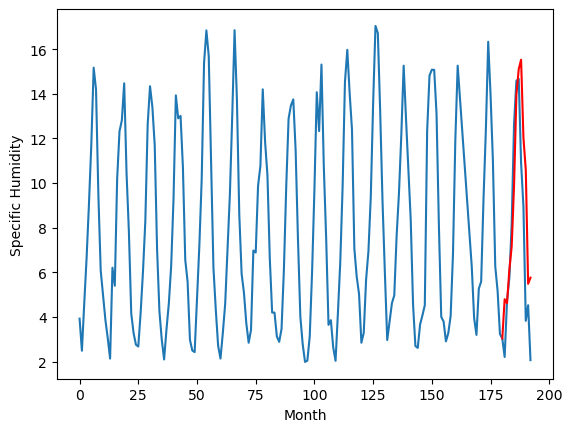

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.35		-0.07
2.90		3.33		0.43
4.93		4.68		-0.25
6.23		5.78		-0.45
8.47		8.16		-0.31
13.69		12.60		-1.09
14.94		13.82		-1.12
15.11		14.51		-0.60
11.81		11.02		-0.79
10.19		9.72		-0.47
4.32		4.08		-0.24
5.37		4.60		-0.77
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.91, 3.3473546612262726, 3.330609315559268, 4.684383624717594, 5.781016701385379, 8.160996311828494, 12.602668160125614, 13.820157402679325, 14.509255760833621, 11.016570681259036, 9.721895807906986, 4.081212156936527, 4.601934844180942]


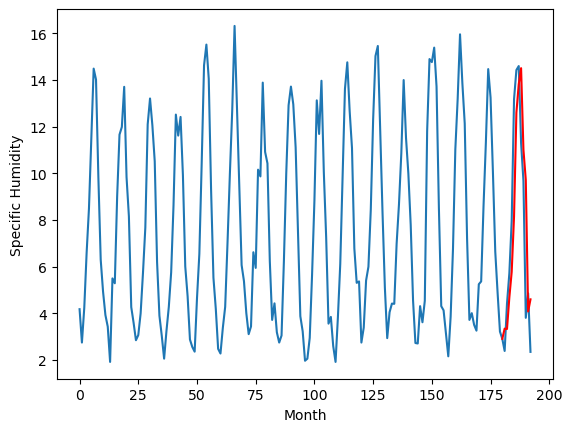

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.79		0.06
5.79		5.95		0.16
6.10		6.02		-0.08
6.57		6.62		0.05
7.97		8.79		0.82
9.30		10.74		1.44
11.75		11.27		-0.48
10.32		11.05		0.73
8.62		9.52		0.90
7.53		7.95		0.42
6.82		6.45		-0.37
6.11		5.11		-1.00
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.6, 5.7853894507884975, 5.954072949886322, 6.021546383798122, 6.617655237615108, 8.785179336965083, 10.742683371007441, 11.270084579885005, 11.051941966116427, 9.524465655386447, 7.950202201902865, 6.445043777525424, 5.106590365469454]


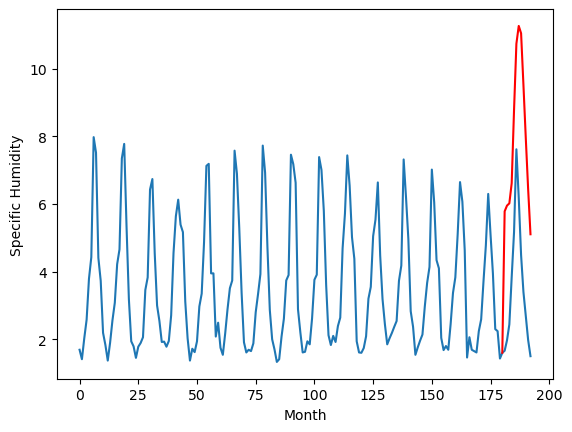

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		4.30		-0.50
4.32		4.55		0.23
4.62		4.12		-0.50
4.31		4.66		0.35
4.87		6.38		1.51
6.29		7.95		1.66
11.65		8.33		-3.32
9.22		8.10		-1.12
7.50		7.08		-0.42
6.40		5.66		-0.74
5.13		4.97		-0.16
5.27		3.06		-2.21
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 4.297678520679474, 4.547684302330017, 4.120811840295792, 4.656745930910111, 6.384296675920487, 7.952246328592301, 8.33478610754013, 8.09968266427517, 7.081200575232506, 5.657205318808556, 4.96770069539547, 3.0587765926122668]


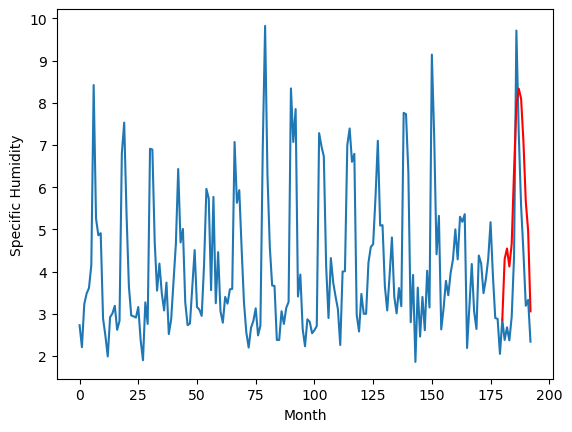

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		4.24		-0.36
4.25		4.70		0.45
3.90		3.98		0.08
4.83		4.51		-0.32
5.27		5.85		0.58
6.70		7.50		0.80
7.18		7.84		0.66
7.57		7.78		0.21
6.93		7.00		0.07
5.90		5.72		-0.18
6.12		4.96		-1.16
4.87		3.11		-1.76
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.65, 4.2413020360469815, 4.700803868770599, 3.979683332443237, 4.510134749412536, 5.850534491539001, 7.500276260375976, 7.838633857965469, 7.778816201090812, 7.002705313563347, 5.71581266105175, 4.962580778002739, 3.106914021372795]


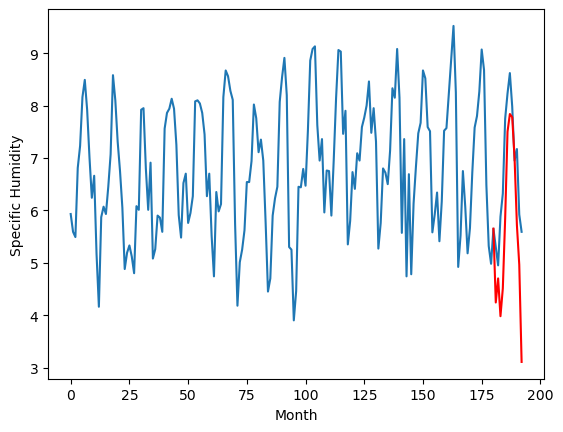

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		3.78		0.69
3.24		3.96		0.72
4.02		4.25		0.23
5.40		5.54		0.14
6.97		6.79		-0.18
11.87		10.97		-0.90
14.08		12.06		-2.02
14.46		13.06		-1.40
11.86		10.29		-1.57
9.32		9.43		0.11
4.79		4.73		-0.06
4.49		4.04		-0.45
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.54, 3.7787324118614194, 3.9620830345153806, 4.253466360569, 5.54126035451889, 6.790936820507049, 10.967240207195282, 12.055056207180023, 13.056415312290191, 10.29189705133438, 9.428247921466827, 4.727251045703888, 4.041977577209472]


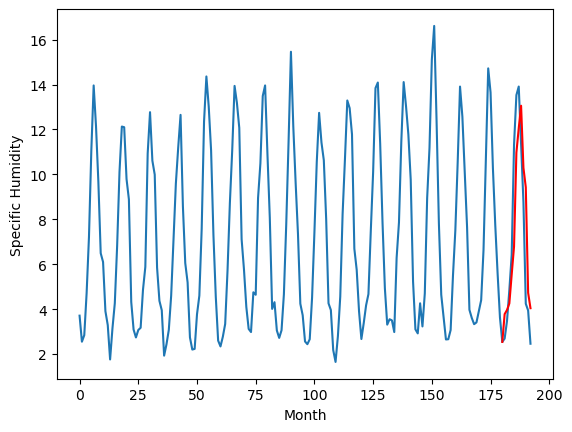

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.24		0.24
0.86		1.38		0.52
2.14		1.89		-0.25
3.55		3.20		-0.35
5.14		4.61		-0.53
10.01		8.98		-1.03
11.70		10.13		-1.57
12.02		11.15		-0.87
9.10		8.15		-0.95
7.20		7.25		0.05
2.28		2.17		-0.11
2.18		1.73		-0.45
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.51, 1.2402586662769317, 1.3761690431833267, 1.8900139504671096, 3.199561613202095, 4.609599130749702, 8.97768689930439, 10.132089393734931, 11.150754945874214, 8.150626199841499, 7.2494782978296275, 2.1677403026819224, 1.728666501641273]


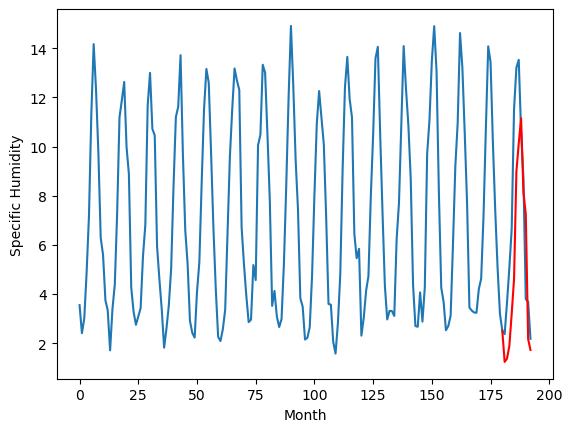

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.5524139726161956, 2.605321067869663, 6.229557507038116, 3.3772515273094177, 4.800858542919159, 3.3473546612262726, 5.7853894507884975, 4.297678520679474, 4.2413020360469815, 3.7787324118614194, 1.2402586662769317]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.552414
1                 1    2.64   2.605321
2                 2    6.37   6.229558
3                 3    3.44   3.377252
4                 4    4.91   4.800859
5                 5    3.42   3.347355
6                 6    5.73   5.785389
7                 7    4.80   4.297679
8                 8    4.60   4.241302
9                 9    3.09   3.778732
10               10    1.00   1.240259


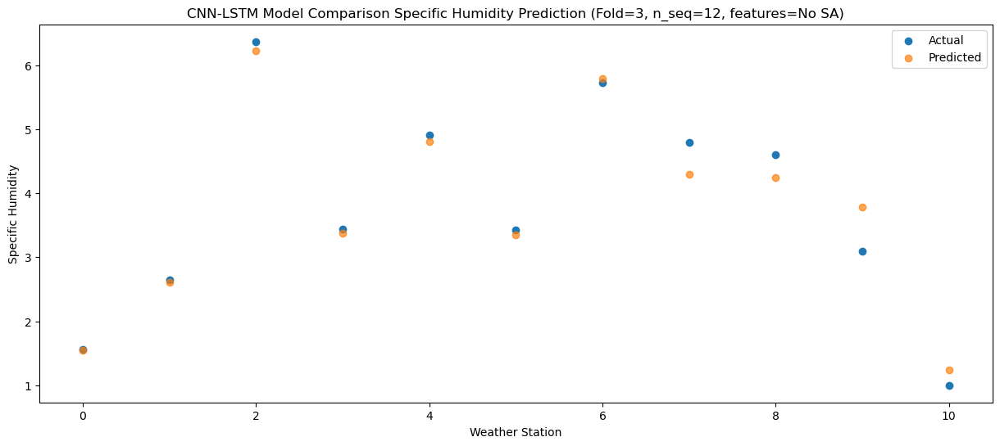

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   2.196863
1                 1    2.08   2.460395
2                 2    6.31   6.596958
3                 3    3.37   3.649987
4                 4    4.08   4.620276
5                 5    2.90   3.330609
6                 6    5.79   5.954073
7                 7    4.32   4.547684
8                 8    4.25   4.700804
9                 9    3.24   3.962083
10               10    0.86   1.376169


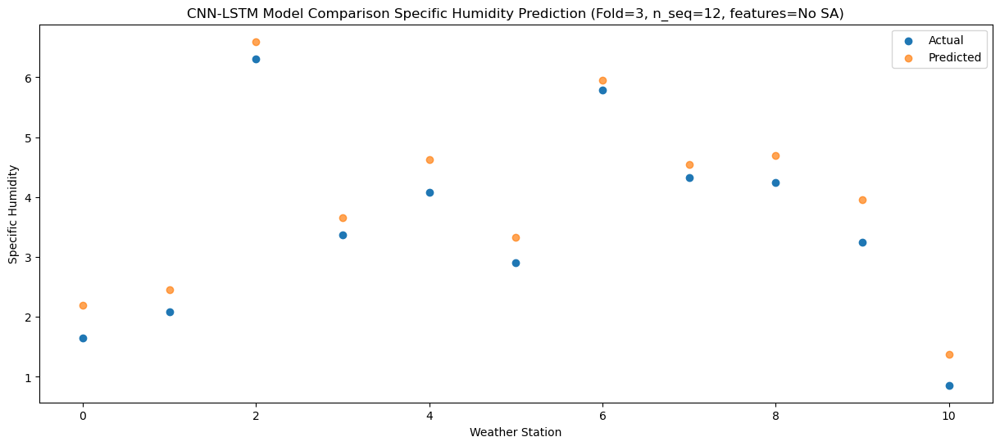

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   3.355037
1                 1    4.59   4.324864
2                 2    6.39   5.931883
3                 3    4.67   4.755859
4                 4    6.56   6.113563
5                 5    4.93   4.684384
6                 6    6.10   6.021546
7                 7    4.62   4.120812
8                 8    3.90   3.979683
9                 9    4.02   4.253466
10               10    2.14   1.890014


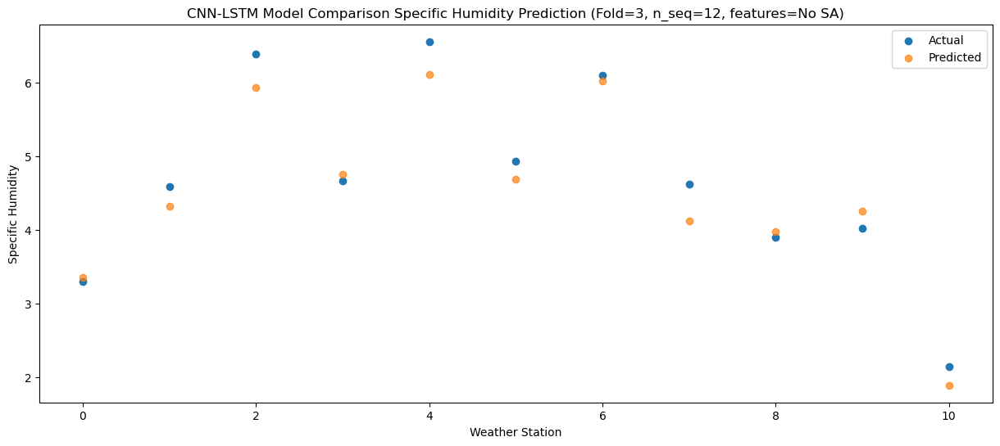

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    3.82   3.991014
1                 1    5.76   5.103678
2                 2    7.01   6.473527
3                 3    5.86   5.750004
4                 4    7.62   7.161670
5                 5    6.23   5.781017
6                 6    6.57   6.617655
7                 7    4.31   4.656746
8                 8    4.83   4.510135
9                 9    5.40   5.541260
10               10    3.55   3.199562


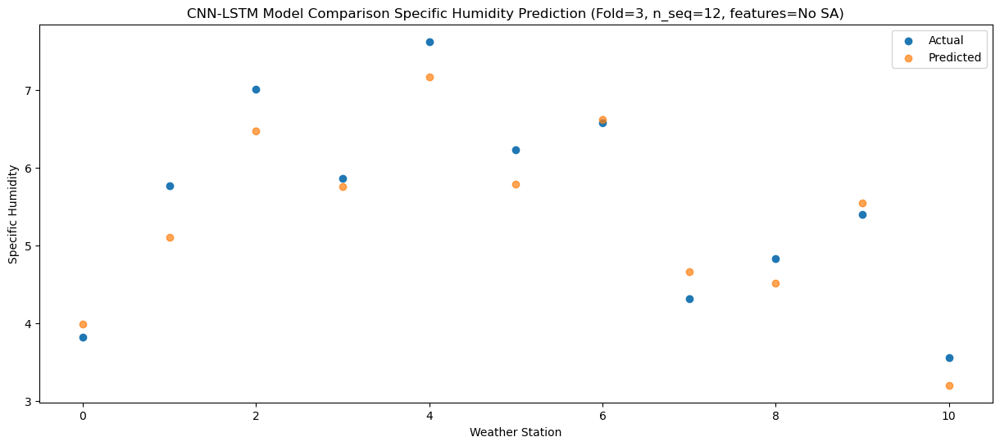

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    6.60   6.518291
1                 1    9.28   8.597915
2                 2    7.41   7.878866
3                 3    8.39   7.922201
4                 4   10.04   9.872469
5                 5    8.47   8.160996
6                 6    7.97   8.785179
7                 7    4.87   6.384297
8                 8    5.27   5.850534
9                 9    6.97   6.790937
10               10    5.14   4.609599


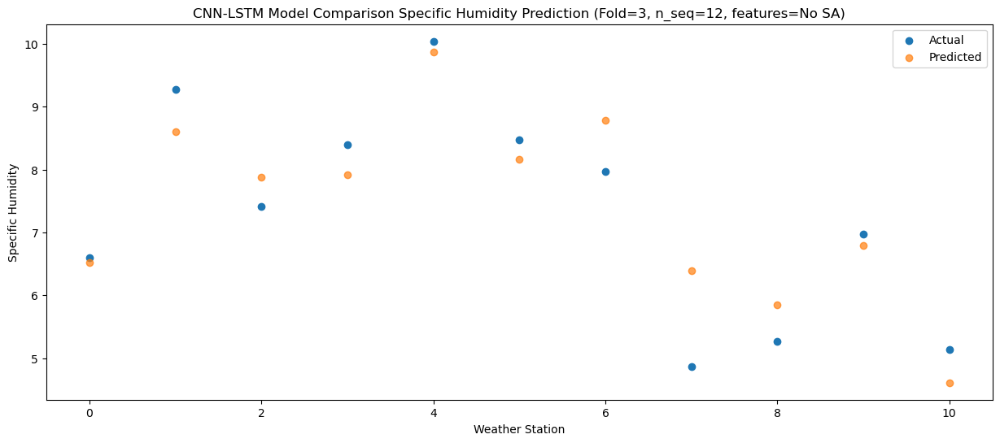

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   11.32  10.717109
1                 1   13.81  12.228901
2                 2    9.86   9.499736
3                 3   13.81  12.370171
4                 4   14.50  13.956354
5                 5   13.69  12.602668
6                 6    9.30  10.742683
7                 7    6.29   7.952246
8                 8    6.70   7.500276
9                 9   11.87  10.967240
10               10   10.01   8.977687


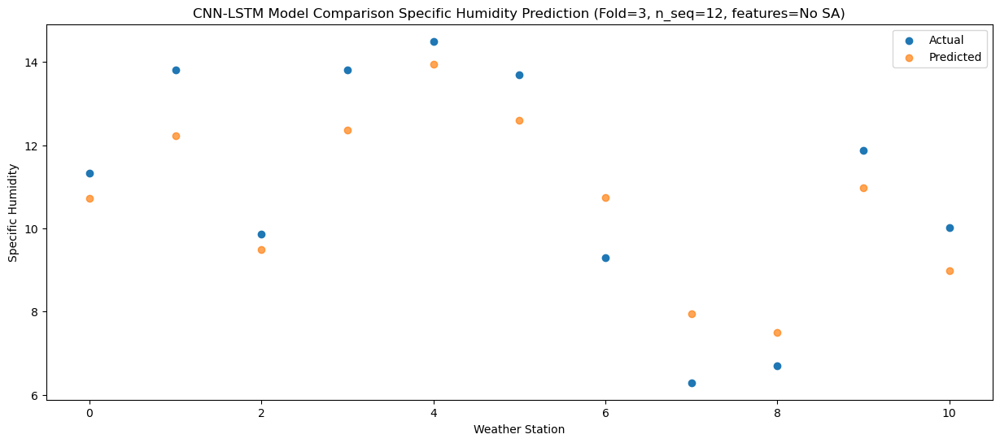

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   12.56  11.809904
1                 1   14.69  13.257968
2                 2   10.56   9.860648
3                 3   14.44  13.557380
4                 4   16.45  15.108896
5                 5   14.94  13.820157
6                 6   11.75  11.270085
7                 7   11.65   8.334786
8                 8    7.18   7.838634
9                 9   14.08  12.055056
10               10   11.70  10.132089


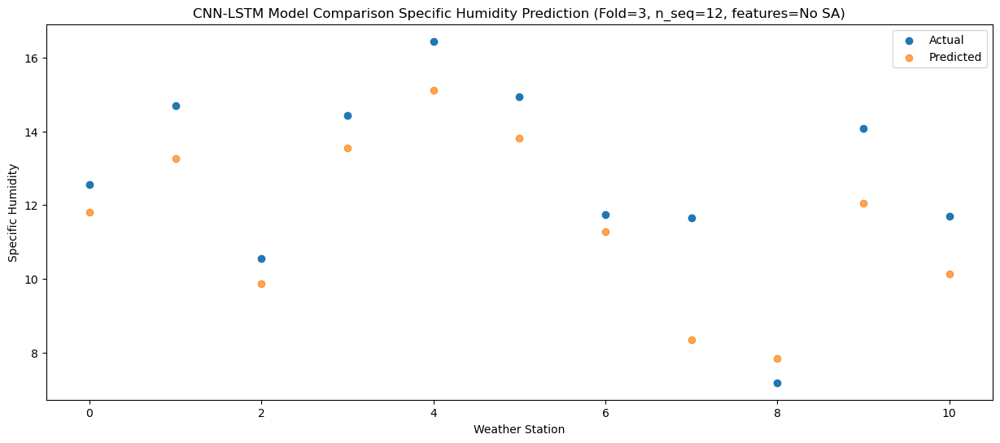

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   12.83  12.408336
1                 1   14.86  13.254468
2                 2   10.09   9.757401
3                 3   15.32  14.347307
4                 4   16.54  15.525765
5                 5   15.11  14.509256
6                 6   10.32  11.051942
7                 7    9.22   8.099683
8                 8    7.57   7.778816
9                 9   14.46  13.056415
10               10   12.02  11.150755


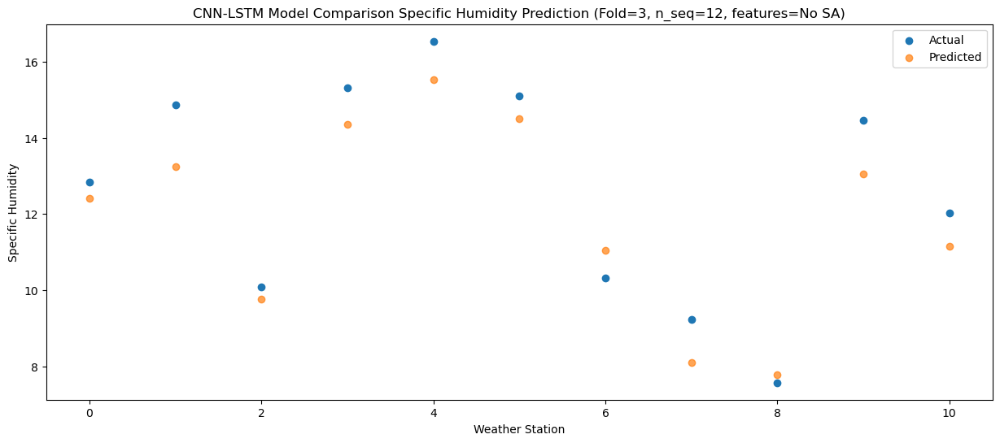

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0    9.21   9.552459
1                 1   10.89   9.841563
2                 2    8.80   8.914525
3                 3   11.85  11.150031
4                 4   12.77  12.037459
5                 5   11.81  11.016571
6                 6    8.62   9.524466
7                 7    7.50   7.081201
8                 8    6.93   7.002705
9                 9   11.86  10.291897
10               10    9.10   8.150626


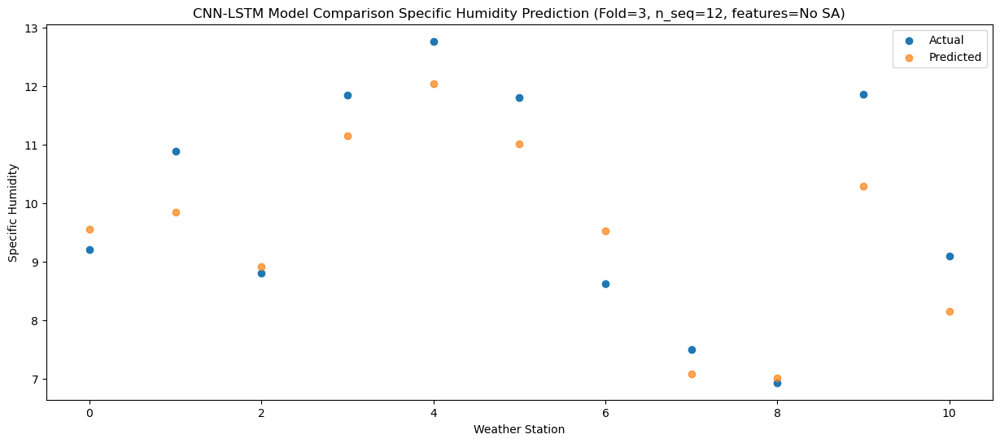

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    7.17   7.913301
1                 1    8.70   7.925712
2                 2    7.66   7.617191
3                 3    9.79   9.850269
4                 4   10.82  10.586448
5                 5   10.19   9.721896
6                 6    7.53   7.950202
7                 7    6.40   5.657205
8                 8    5.90   5.715813
9                 9    9.32   9.428248
10               10    7.20   7.249478


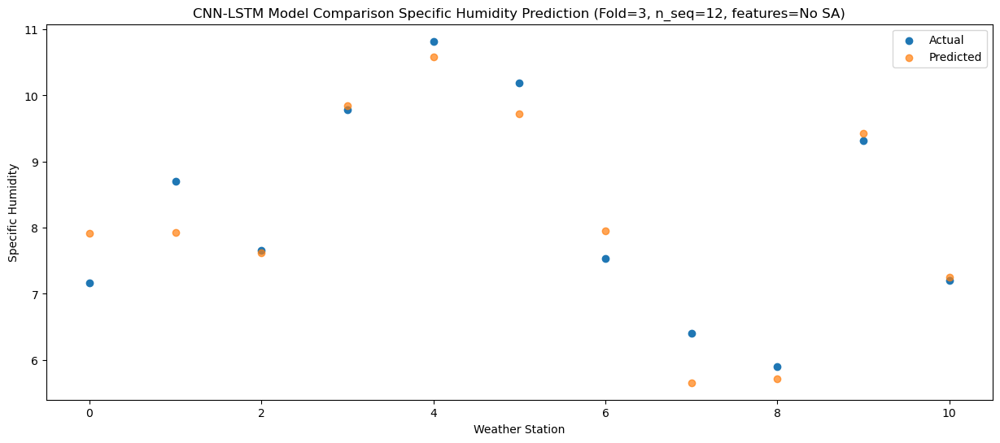

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    1.67   2.188249
1                 1    4.27   3.204002
2                 2    8.24   6.929820
3                 3    4.10   4.124811
4                 4    5.70   5.486877
5                 5    4.32   4.081212
6                 6    6.82   6.445044
7                 7    5.13   4.967701
8                 8    6.12   4.962581
9                 9    4.79   4.727251
10               10    2.28   2.167740


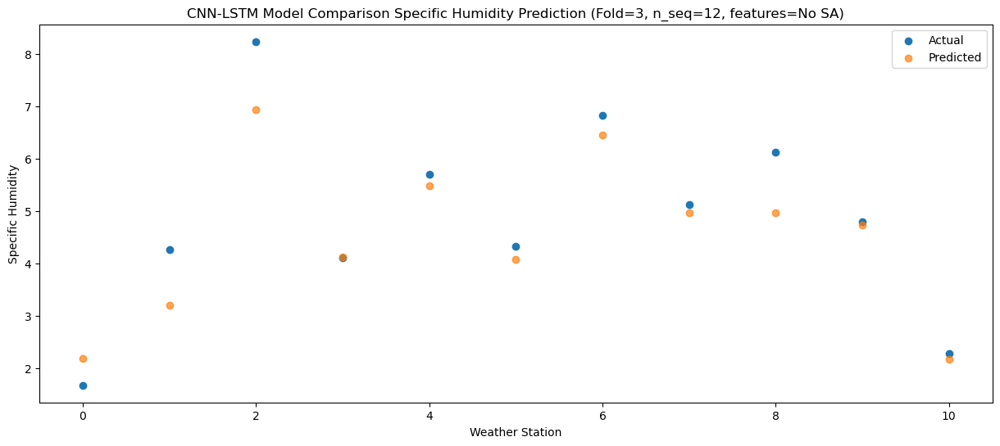

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    3.62   3.818306
1                 1    5.24   4.016382
2                 2    6.74   4.951306
3                 3    5.24   4.915393
4                 4    6.40   5.763932
5                 5    5.37   4.601935
6                 6    6.11   5.106590
7                 7    5.27   3.058777
8                 8    4.87   3.106914
9                 9    4.49   4.041978
10               10    2.18   1.728667


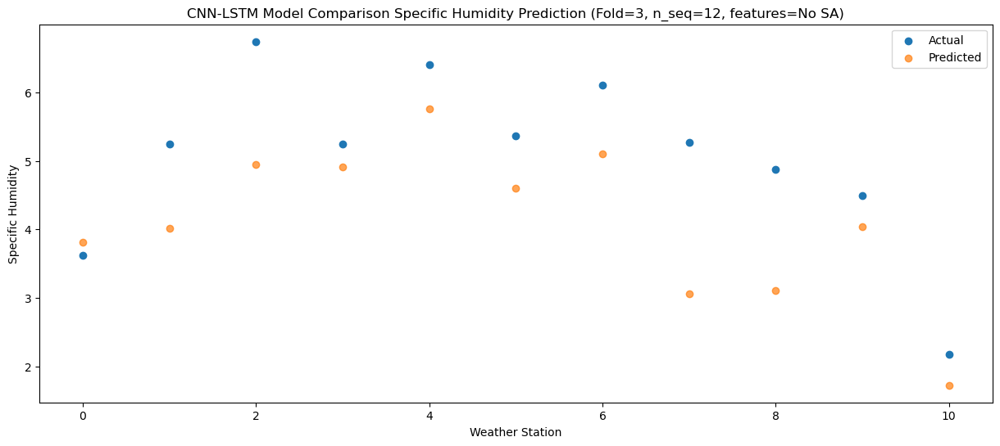

Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_504 (Conv1D)         (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_504 (MaxPooli  (None, 1, 1024)          0         
 ng1D)                                                           
                                                                 
 dropout_1512 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1008 (LSTM)            (None, 1, 256)            1311744   
                                                                 
 dropout_1513 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1009 (LSTM)            (None, 256)               525312    
                                                    

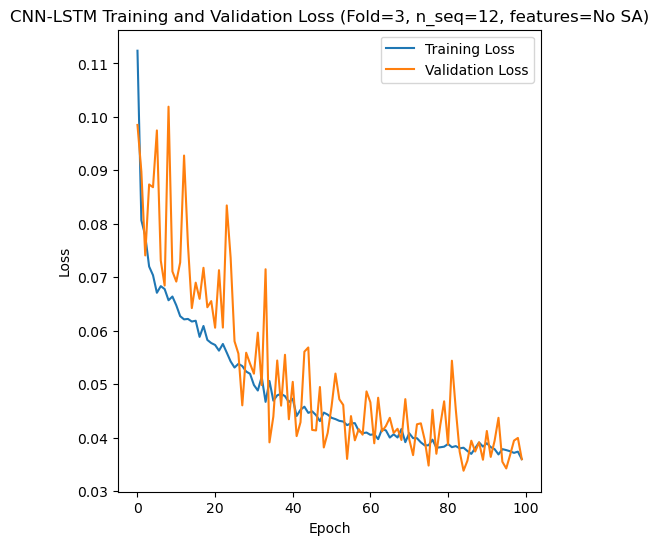

Epoch 1/100
84/84 [==============================] - 24s 112ms/step - loss: 0.1146 - accuracy: 0.5476 - mae: 0.0960 - rmse: 0.1146 - mape: 20.9588 - pearson: 0.6444 - val_loss: 0.0794 - val_accuracy: 0.8000 - val_mae: 0.0669 - val_rmse: 0.0794 - val_mape: 15.0782 - val_pearson: 0.7277
Epoch 2/100
84/84 [==============================] - 5s 65ms/step - loss: 0.0865 - accuracy: 0.6786 - mae: 0.0697 - rmse: 0.0865 - mape: 15.9690 - pearson: 0.6965 - val_loss: 0.0624 - val_accuracy: 0.8000 - val_mae: 0.0480 - val_rmse: 0.0624 - val_mape: 10.4291 - val_pearson: 0.8060
Epoch 3/100
84/84 [==============================] - 5s 56ms/step - loss: 0.0817 - accuracy: 0.7381 - mae: 0.0654 - rmse: 0.0817 - mape: 14.8800 - pearson: 0.7329 - val_loss: 0.0622 - val_accuracy: 0.8000 - val_mae: 0.0500 - val_rmse: 0.0622 - val_mape: 10.7601 - val_pearson: 0.8194
Epoch 4/100
84/84 [==============================] - 5s 55ms/step - loss: 0.0759 - accuracy: 0.7262 - mae: 0.0611 - rmse: 0.0759 - mape: 13.7167 -

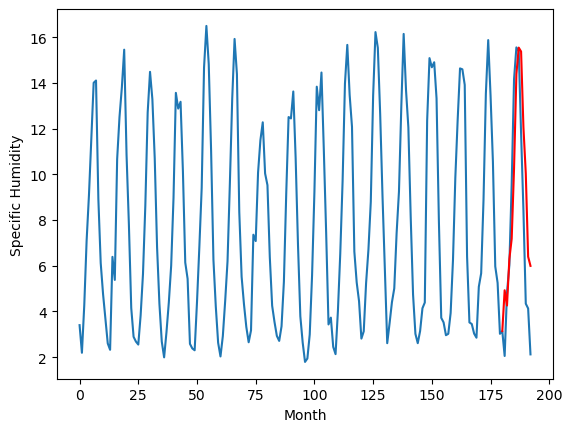

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.87		-0.40
6.26		4.57		-1.69
6.23		5.36		-0.87
6.98		5.87		-1.11
8.31		7.49		-0.82
12.60		11.34		-1.26
13.81		12.32		-1.49
14.20		12.66		-1.54
13.40		10.76		-2.64
10.48		8.82		-1.66
5.82		4.91		-0.91
7.56		6.22		-1.34
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.79, 3.8722323831915855, 4.57202435106039, 5.364045923650265, 5.865977173745632, 7.4899288472533225, 11.344469910562038, 12.324307328164577, 12.656797474324703, 10.764279192388058, 8.818734115064144, 4.90543431609869, 6.218945806920528]


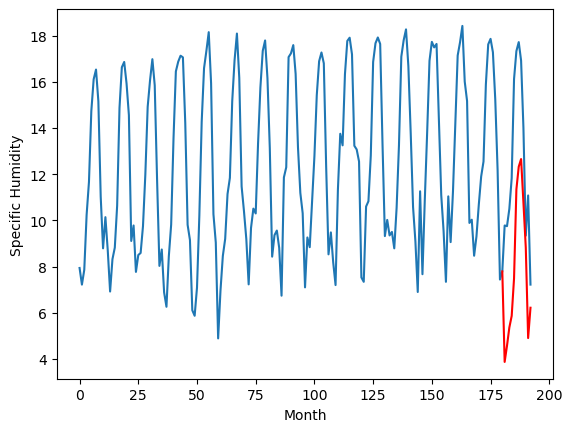

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.83		-0.04
3.75		4.00		0.25
6.81		6.14		-0.67
7.06		6.66		-0.40
10.50		9.69		-0.81
14.74		14.09		-0.65
16.39		15.11		-1.28
16.40		15.24		-1.16
13.46		12.23		-1.23
10.68		9.96		-0.72
5.24		4.93		-0.31
8.19		6.86		-1.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.03, 3.8317406433820724, 3.998014907836914, 6.137475233078003, 6.663634161949158, 9.690348963737488, 14.088957171440125, 15.107124786376954, 15.24416340470314, 12.22957886338234, 9.961001287698746, 4.933675657510758, 6.863291751146317]


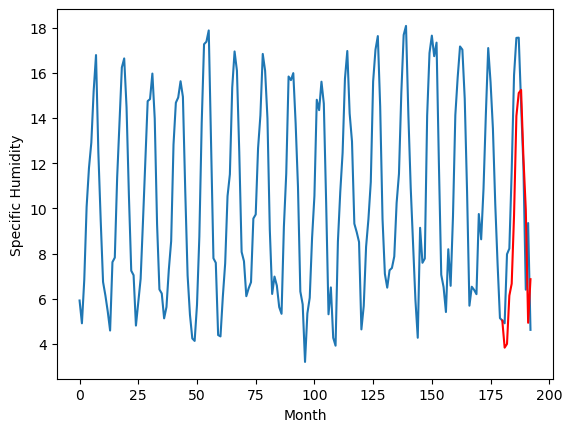

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.67		-0.06
3.41		3.23		-0.18
6.07		5.58		-0.49
7.36		6.25		-1.11
11.36		9.74		-1.62
15.05		13.76		-1.29
15.62		14.82		-0.80
16.01		14.53		-1.48
12.00		11.27		-0.73
9.15		9.02		-0.13
5.53		5.15		-0.38
7.39		5.68		-1.71
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.41, 3.6740726047754286, 3.234086644053459, 5.58364809691906, 6.250753950476646, 9.742203544974327, 13.755807232260704, 14.816223453879356, 14.529314231276512, 11.274731110930443, 9.020755957961082, 5.146374654173851, 5.684734415411949]


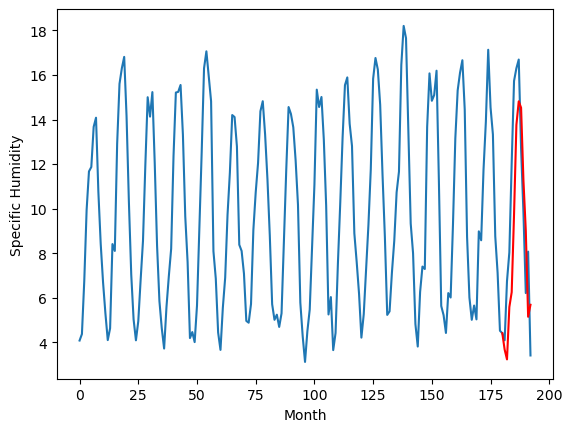

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.24		-0.12
2.91		2.76		-0.15
5.49		5.05		-0.44
6.85		5.72		-1.13
11.14		9.19		-1.95
15.02		13.11		-1.91
15.40		14.18		-1.22
15.51		13.84		-1.67
11.61		10.63		-0.98
8.88		8.40		-0.48
5.27		4.74		-0.53
6.68		5.07		-1.61
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.29, 3.2402716368436812, 2.7584266752004623, 5.049203643202782, 5.7242119997739795, 9.189302036166191, 13.113116332888604, 14.177478024363518, 13.840313741564751, 10.630368062853814, 8.395013162493706, 4.741973468661309, 5.067348071932793]


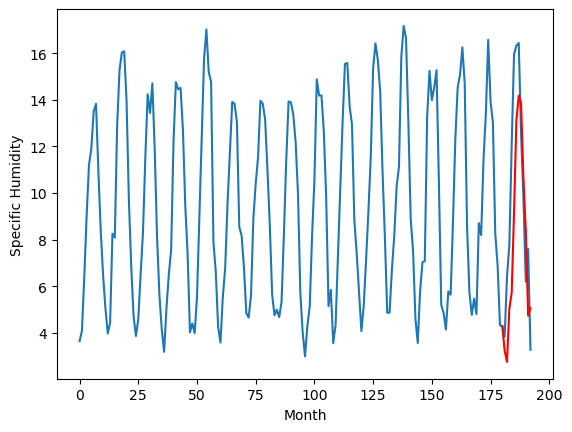

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		7.94		-0.70
8.00		7.58		-0.42
9.49		9.13		-0.36
10.45		9.68		-0.77
15.00		12.58		-2.42
17.30		15.75		-1.55
18.33		16.78		-1.55
18.05		16.22		-1.83
14.80		13.80		-1.00
11.75		11.70		-0.05
10.03		9.54		-0.49
9.18		9.05		-0.13
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.47, 7.941581075135619, 7.58360815519467, 9.130532984677703, 9.68358695978299, 12.576516752187164, 15.751653795186431, 16.781473164502533, 16.221080069486053, 13.796591048184784, 11.702453856412323, 9.539077286664398, 9.04678184265271]


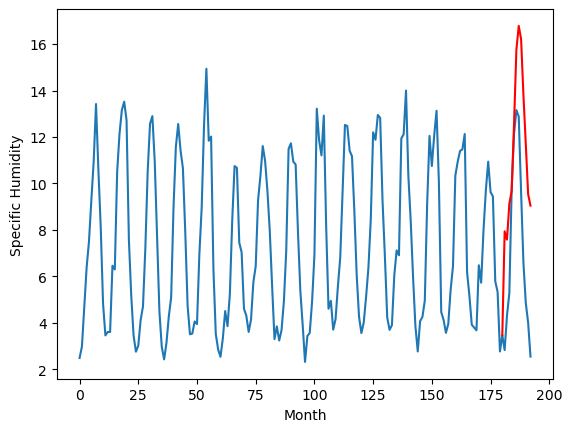

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.68		-0.12
6.05		5.86		-0.19
7.76		7.47		-0.29
8.17		8.15		-0.02
11.15		10.56		-0.59
15.84		14.98		-0.86
17.44		16.05		-1.39
17.82		16.35		-1.47
14.24		13.53		-0.71
12.03		11.48		-0.55
6.31		6.73		0.42
8.17		8.00		-0.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.52, 5.681451408267021, 5.860711557865143, 7.466272099018097, 8.146499199867248, 10.564180655479431, 14.977402968406677, 16.051650090217592, 16.352196617126467, 13.526176137924196, 11.475278062820436, 6.727101488113405, 7.995722098350527]


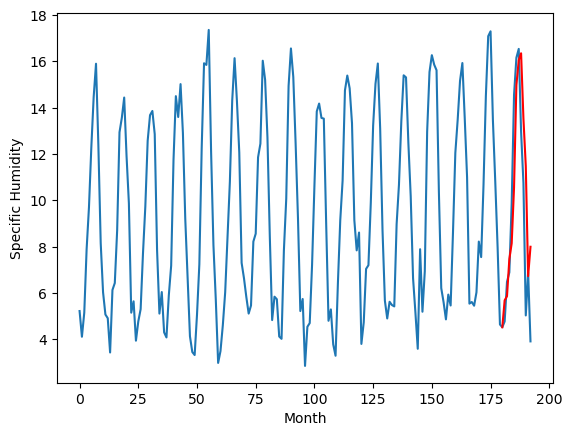

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		3.79		-0.14
3.30		3.39		0.09
5.67		5.50		-0.17
6.59		6.33		-0.26
9.75		9.39		-0.36
14.35		13.75		-0.60
15.30		14.87		-0.43
15.04		14.89		-0.15
11.78		11.56		-0.22
9.69		9.47		-0.22
5.00		5.12		0.12
6.47		5.57		-0.90
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.4, 3.7916125524044038, 3.386594789028168, 5.504293696880341, 6.334900693893433, 9.388459281921387, 13.754086570739746, 14.87293441772461, 14.885942919105291, 11.557184917777777, 9.465078813880682, 5.118453008979559, 5.570527030080557]


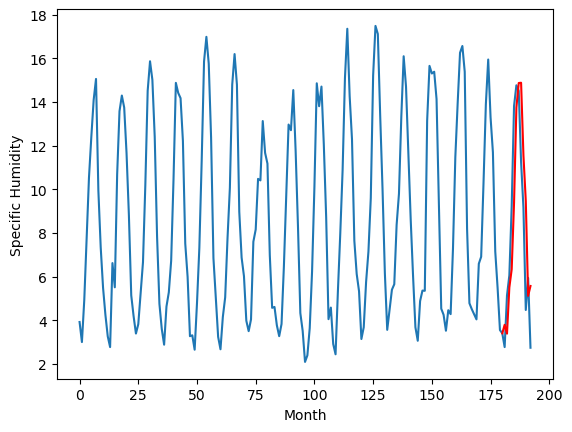

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.22		-0.08
2.73		2.80		0.07
4.67		4.35		-0.32
6.00		5.43		-0.57
8.29		7.72		-0.57
13.35		12.29		-1.06
14.61		13.48		-1.13
14.75		13.80		-0.95
11.27		10.58		-0.69
10.12		8.78		-1.34
4.35		4.42		0.07
5.06		4.23		-0.83
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 3.2152656257152556, 2.7950412571430205, 4.349172526597977, 5.430208379030228, 7.723714524507523, 12.293243104219437, 13.477197343111039, 13.795648777484894, 10.581383430957795, 8.776501619815827, 4.41933628320694, 4.230678746104241]


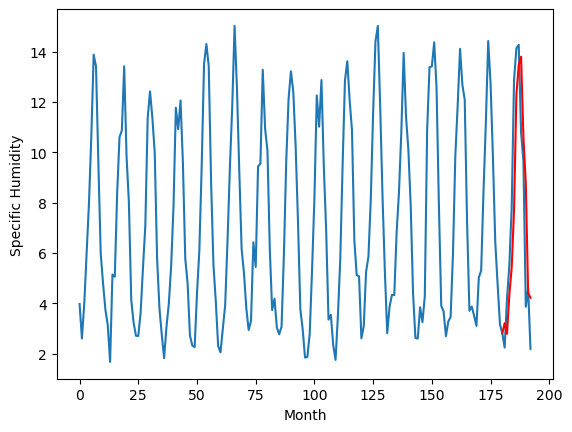

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		2.08		-0.09
1.53		1.53		0.00
3.90		3.31		-0.59
5.21		4.36		-0.85
7.83		6.96		-0.87
12.58		11.47		-1.11
13.98		12.66		-1.32
14.23		12.84		-1.39
10.20		9.49		-0.71
8.33		7.62		-0.71
3.04		3.37		0.33
3.58		3.11		-0.47
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 2.080311199426651, 1.531490584611893, 3.3118965828418734, 4.3616616928577425, 6.957369109392166, 11.470557948350907, 12.662060877084732, 12.843902354836464, 9.493750339150429, 7.623233800530434, 3.36968946993351, 3.1084122115373614]


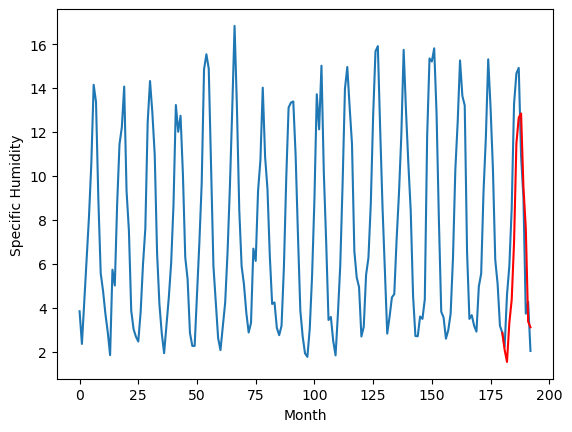

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		4.72		-0.12
4.27		4.35		0.08
5.56		5.45		-0.11
7.23		6.65		-0.58
8.83		8.41		-0.42
13.84		12.92		-0.92
15.11		14.11		-1.00
15.98		14.59		-1.39
12.22		11.62		-0.60
11.21		9.98		-1.23
5.97		5.93		-0.04
5.93		5.27		-0.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 4.718233914375305, 4.348688544034958, 5.45042818903923, 6.650574148893356, 8.41299492239952, 12.923818172216414, 14.114659847021102, 14.58546343564987, 11.624458701610564, 9.983942778110503, 5.927675516605376, 5.272060663700103]


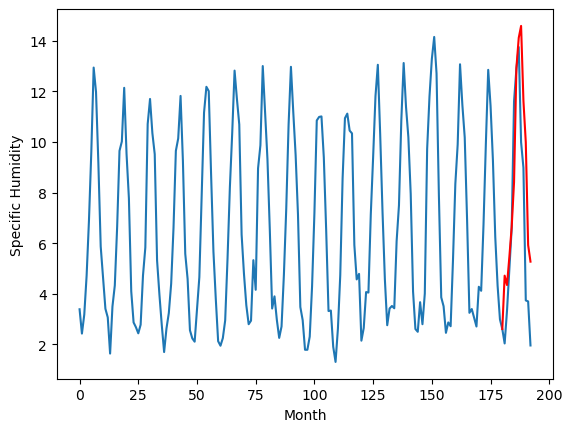

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[4.926975847482681, 3.8722323831915855, 3.8317406433820724, 3.6740726047754286, 3.2402716368436812, 7.941581075135619, 5.681451408267021, 3.7916125524044038, 3.2152656257152556, 2.080311199426651, 4.718233914375305]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   4.926976
1                 1    4.27   3.872232
2                 2    3.87   3.831741
3                 3    3.73   3.674073
4                 4    3.36   3.240272
5                 5    8.64   7.941581
6                 6    5.80   5.681451
7                 7    3.93   3.791613
8                 8    3.30   3.215266
9                 9    2.17   2.080311
10               10    4.84   4.718234


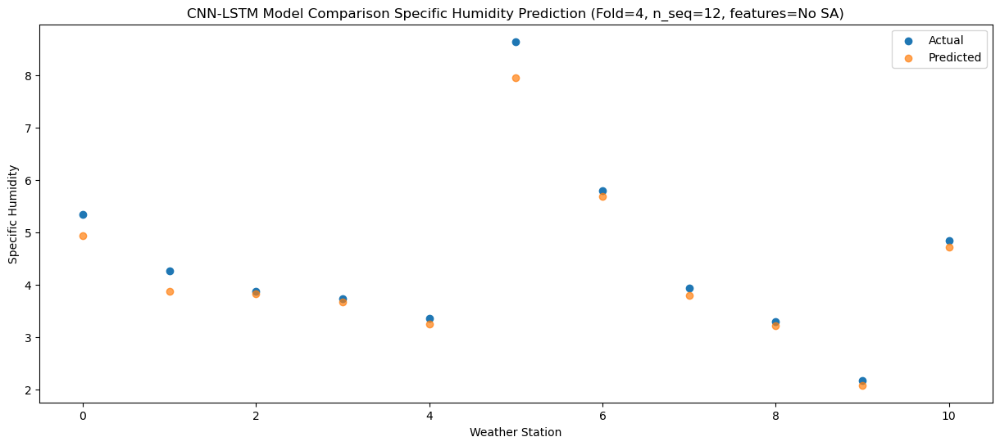

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.259771
1                 1    6.26   4.572024
2                 2    3.75   3.998015
3                 3    3.41   3.234087
4                 4    2.91   2.758427
5                 5    8.00   7.583608
6                 6    6.05   5.860712
7                 7    3.30   3.386595
8                 8    2.73   2.795041
9                 9    1.53   1.531491
10               10    4.27   4.348689


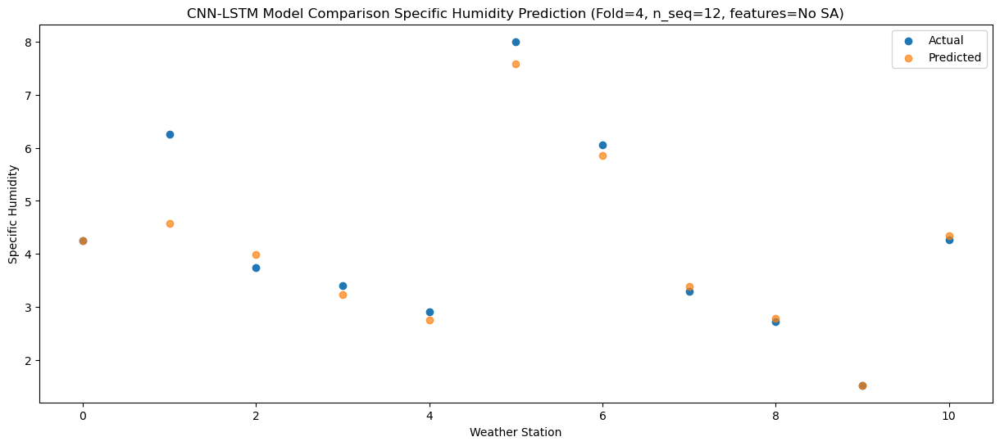

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   6.288604
1                 1    6.23   5.364046
2                 2    6.81   6.137475
3                 3    6.07   5.583648
4                 4    5.49   5.049204
5                 5    9.49   9.130533
6                 6    7.76   7.466272
7                 7    5.67   5.504294
8                 8    4.67   4.349173
9                 9    3.90   3.311897
10               10    5.56   5.450428


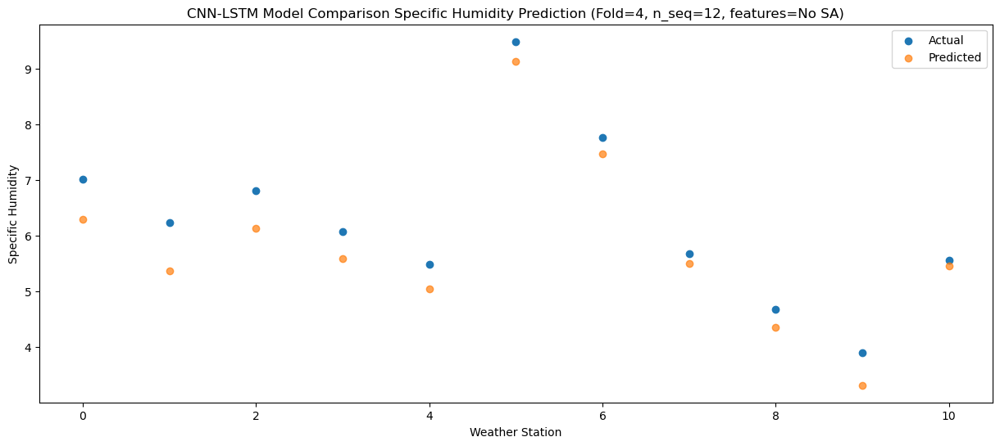

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    8.22   7.181566
1                 1    6.98   5.865977
2                 2    7.06   6.663634
3                 3    7.36   6.250754
4                 4    6.85   5.724212
5                 5   10.45   9.683587
6                 6    8.17   8.146499
7                 7    6.59   6.334901
8                 8    6.00   5.430208
9                 9    5.21   4.361662
10               10    7.23   6.650574


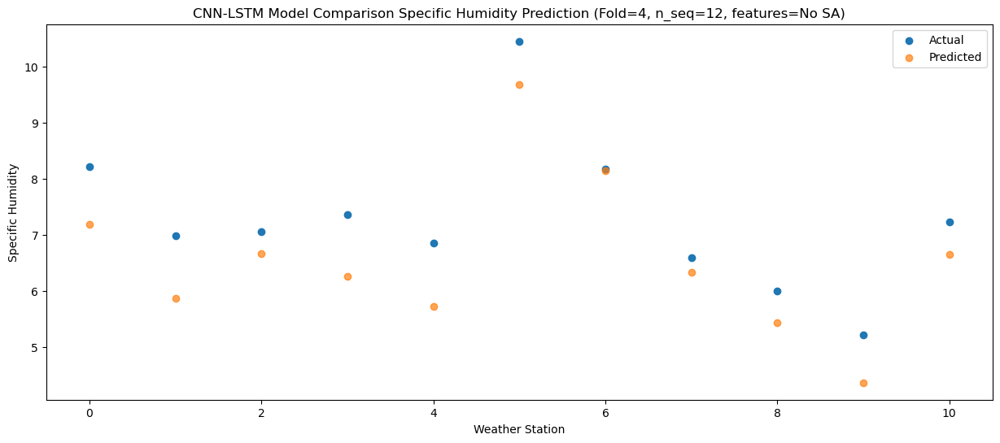

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   11.78  10.262871
1                 1    8.31   7.489929
2                 2   10.50   9.690349
3                 3   11.36   9.742204
4                 4   11.14   9.189302
5                 5   15.00  12.576517
6                 6   11.15  10.564181
7                 7    9.75   9.388459
8                 8    8.29   7.723715
9                 9    7.83   6.957369
10               10    8.83   8.412995


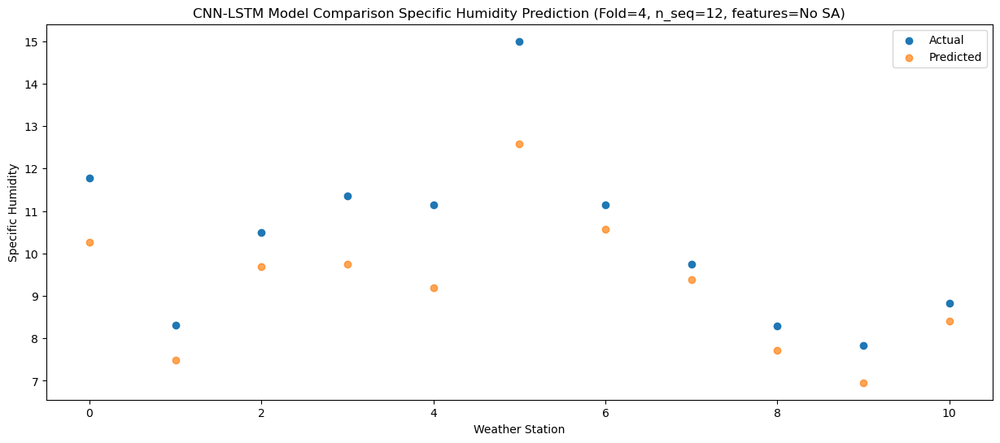

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   16.37  14.390404
1                 1   12.60  11.344470
2                 2   14.74  14.088957
3                 3   15.05  13.755807
4                 4   15.02  13.113116
5                 5   17.30  15.751654
6                 6   15.84  14.977403
7                 7   14.35  13.754087
8                 8   13.35  12.293243
9                 9   12.58  11.470558
10               10   13.84  12.923818


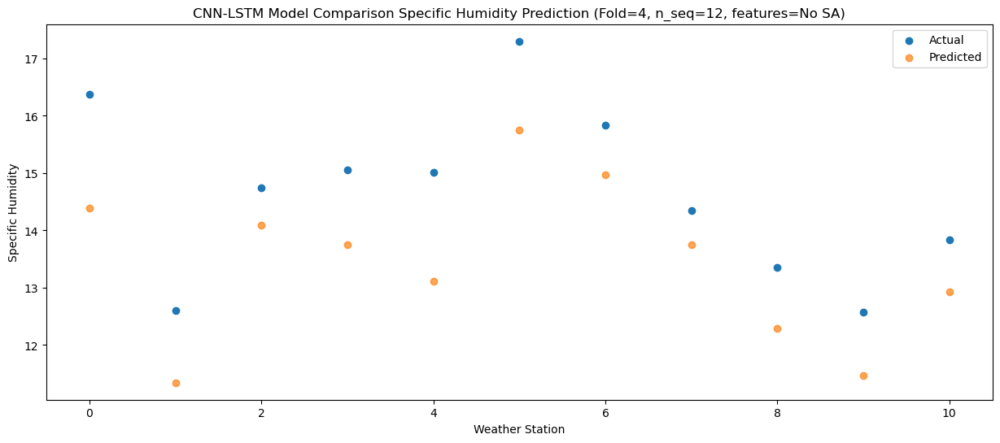

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   17.76  15.550025
1                 1   13.81  12.324307
2                 2   16.39  15.107125
3                 3   15.62  14.816223
4                 4   15.40  14.177478
5                 5   18.33  16.781473
6                 6   17.44  16.051650
7                 7   15.30  14.872934
8                 8   14.61  13.477197
9                 9   13.98  12.662061
10               10   15.11  14.114660


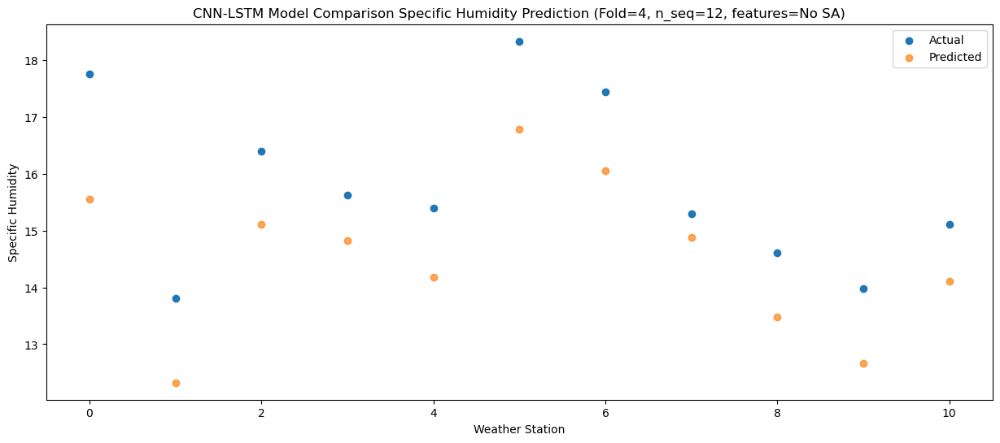

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   17.58  15.379233
1                 1   14.20  12.656797
2                 2   16.40  15.244163
3                 3   16.01  14.529314
4                 4   15.51  13.840314
5                 5   18.05  16.221080
6                 6   17.82  16.352197
7                 7   15.04  14.885943
8                 8   14.75  13.795649
9                 9   14.23  12.843902
10               10   15.98  14.585463


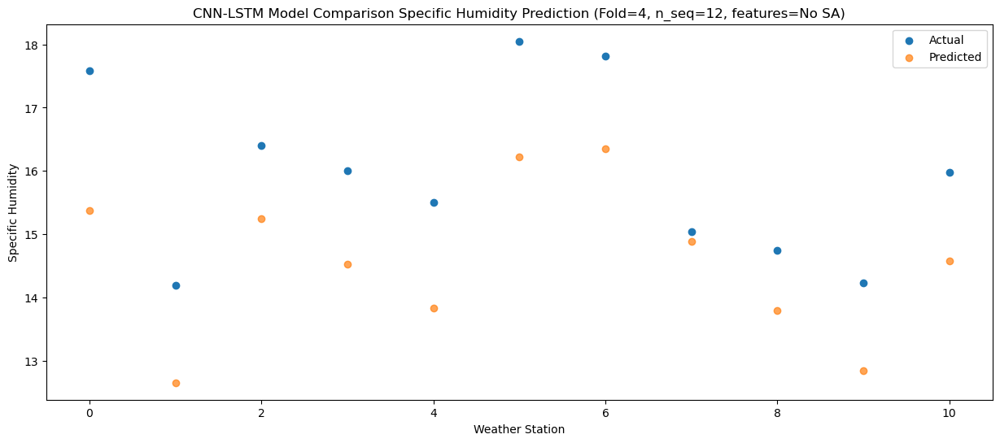

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   14.00  12.057963
1                 1   13.40  10.764279
2                 2   13.46  12.229579
3                 3   12.00  11.274731
4                 4   11.61  10.630368
5                 5   14.80  13.796591
6                 6   14.24  13.526176
7                 7   11.78  11.557185
8                 8   11.27  10.581383
9                 9   10.20   9.493750
10               10   12.22  11.624459


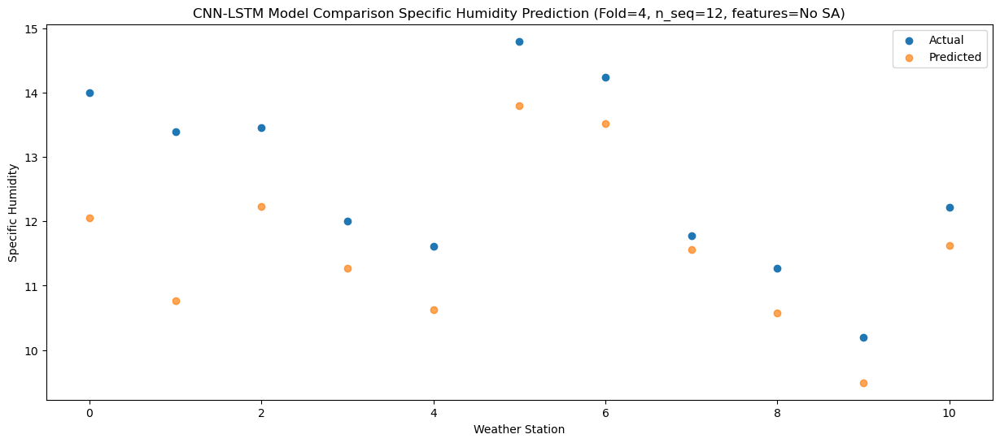

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.63  10.037098
1                 1   10.48   8.818734
2                 2   10.68   9.961001
3                 3    9.15   9.020756
4                 4    8.88   8.395013
5                 5   11.75  11.702454
6                 6   12.03  11.475278
7                 7    9.69   9.465079
8                 8   10.12   8.776502
9                 9    8.33   7.623234
10               10   11.21   9.983943


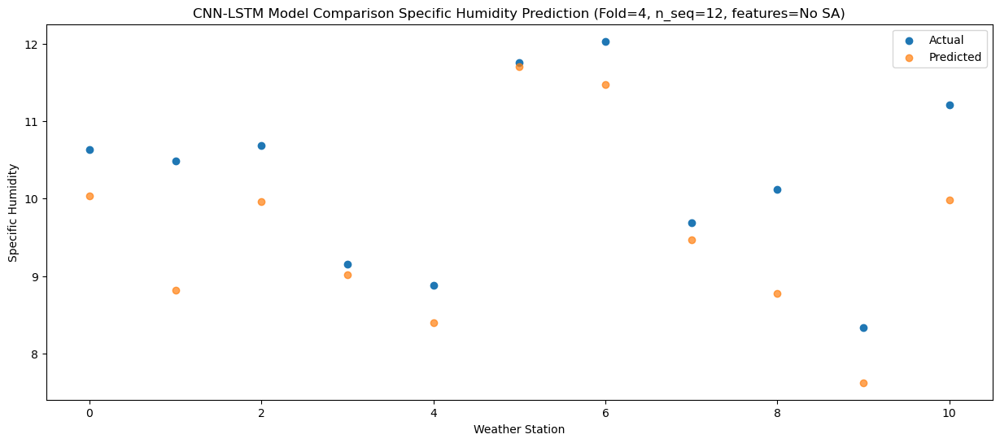

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.54   6.396149
1                 1    5.82   4.905434
2                 2    5.24   4.933676
3                 3    5.53   5.146375
4                 4    5.27   4.741973
5                 5   10.03   9.539077
6                 6    6.31   6.727101
7                 7    5.00   5.118453
8                 8    4.35   4.419336
9                 9    3.04   3.369689
10               10    5.97   5.927676


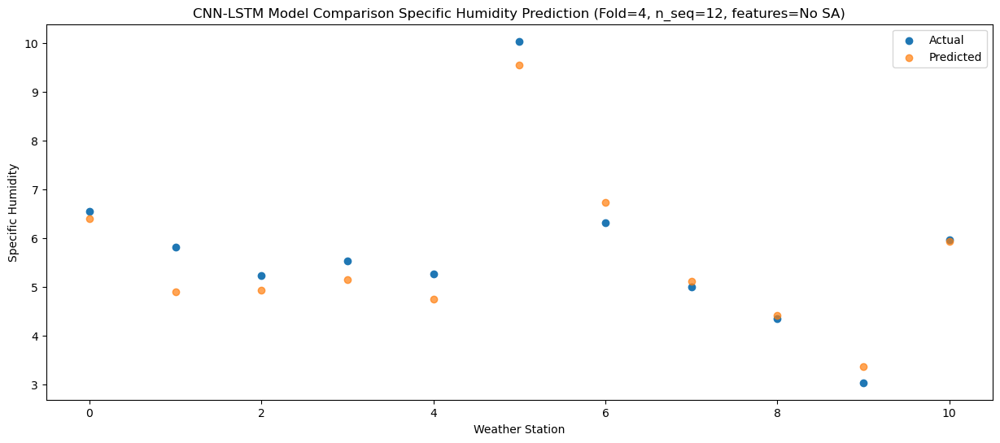

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    6.33   5.993976
1                 1    7.56   6.218946
2                 2    8.19   6.863292
3                 3    7.39   5.684734
4                 4    6.68   5.067348
5                 5    9.18   9.046782
6                 6    8.17   7.995722
7                 7    6.47   5.570527
8                 8    5.06   4.230679
9                 9    3.58   3.108412
10               10    5.93   5.272061


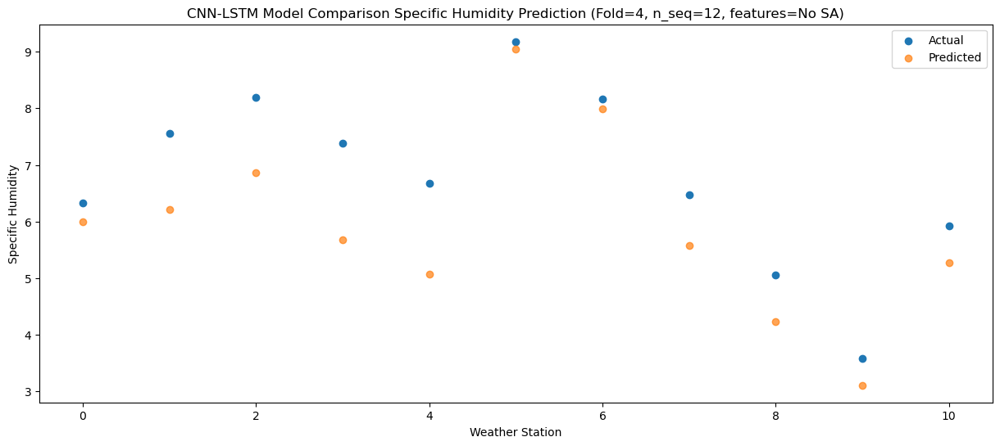

Model: "sequential_505"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_505 (Conv1D)         (None, 1, 1024)           2017280   
                                                                 
 max_pooling1d_505 (MaxPooli  (None, 1, 1024)          0         
 ng1D)                                                           
                                                                 
 dropout_1515 (Dropout)      (None, 1, 1024)           0         
                                                                 
 lstm_1010 (LSTM)            (None, 1, 256)            1311744   
                                                                 
 dropout_1516 (Dropout)      (None, 1, 256)            0         
                                                                 
 lstm_1011 (LSTM)            (None, 256)               525312    
                                                    

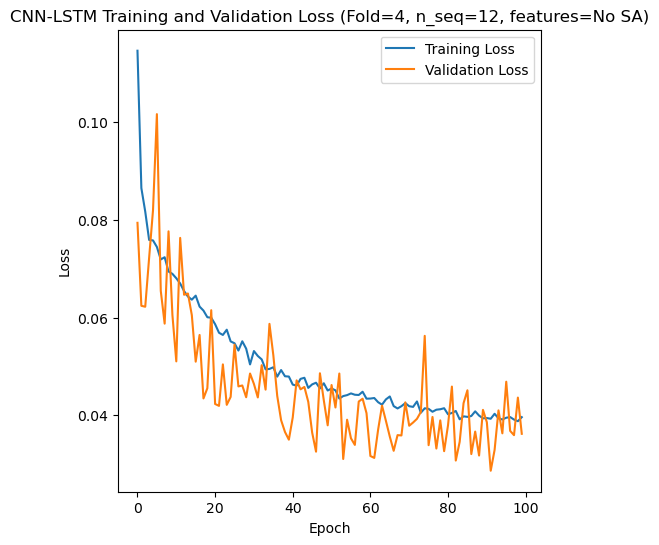

[[0.25765506367896973, 0.6319355862236081, 0.5343377386558904, 0.6330721653130058, 0.6580673019069978, 0.502888891787448, 0.7529057623331918, 0.7491471340210152, 0.5478970811082857, 0.43999843129052923, 0.4951762299490244, 0.6930303975886691], [0.444474974888929, 0.2566025869716817, 0.3615853307452839, 0.6174270138691254, 0.8505485713524965, 1.0551359330482815, 1.0185546695721934, 1.2442302457747278, 0.859906575889708, 1.5195611309745465, 0.39969246559596233, 0.9678583094207915], [0.3530487511690551, 0.8738269896190426, 1.110507536627002, 1.310881431958249, 2.3900464911232393, 1.6139119715811379, 1.6972957650475853, 1.8898414456191706, 1.787413964087809, 0.8659846026382785, 1.9644930536188585, 2.273542619722473], [0.29514965306647545, 0.4422708170112997, 0.2905943345960968, 0.37406096364589536, 0.6496264211823232, 1.1245030048179014, 1.511999829921481, 0.9420453362789567, 0.8115480811608667, 0.4479809583573851, 0.6569664744649149, 1.1772504439136457], [0.28584474234646673, 0.5386788599

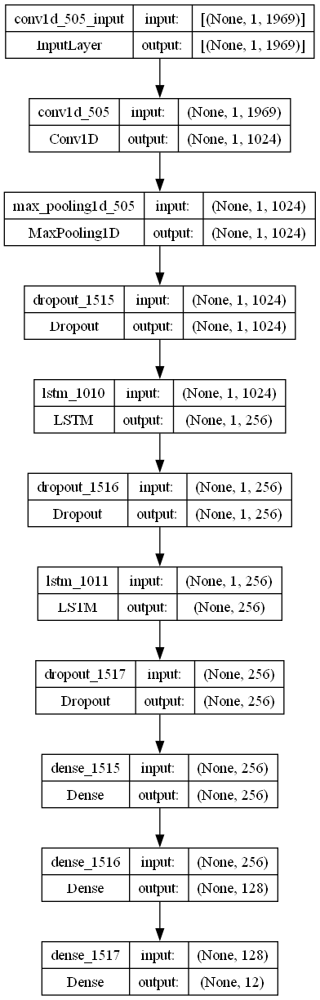

In [9]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best CNN-LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 1024
    lr = 0.11486804417943138
    optimizer = SGD(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 256
    dropout_rate = 0.29997327270694923

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S12_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)